# Connect Forest Management Model with Forest Carbon Budget Model

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
from IPython.display import display
import ws3.forest
import time
import gurobipy as grb
import pickle
import libcbm
import os
from util_opt import compile_events, cbm_report, compile_scenario_maxstock, plot_scenario_maxstock, run_cbm_emissionstock, run_scenario, plugin_c_curves, plugin_c_curves_both, cbm_report_both, compare_ws3_cbm, compare_ws3_cbm_both, track_system_stock, track_system_emission, compile_scenario_minemission, plot_scenario_minemission, kpi_age, kpi_species, cmp_c_ss, cmp_c_se, results_scenarios, bootstrap_ogi, compare_kpi_age

In [2]:
base_year = 2020
horizon = 10
period_length = 10
max_age = 1000
n_steps = 100
tvy_name = 'totvol'
max_harvest = 1.0

In [4]:
# Define scenario options based on case study
scenario_options = {
    'redchris': ['no_cons','evenflow_cons',  'bau_redchrs', 'redchrs_AAC_90%', 'redchrs_AAC_80%', 'redchrs_AAC_70%', 'redchrs_AAC_60%', 'redchrs_AAC_50%', 'redchrs_AAC_40%', 'redchrs_AAC_30%', 'redchrs_AAC_20%', 'redchrs_AAC_10%' ],
    'goldenbear': ['no_cons', 'evenflow_cons', 'bau_gldbr', 'gldbr_AAC_90%', 'gldbr_AAC_80%', 'gldbr_AAC_70%', 'gldbr_AAC_60%', 'gldbr_AAC_50%', 'gldbr_AAC_40%', 'gldbr_AAC_30%', 'gldbr_AAC_20%', 'gldbr_AAC_10%'],
    'equitysilver': [ 'no_cons','evenflow_cons', 'bau_eqtslvr', 'eqtslvr_AAC_90%', 'eqtslvr_AAC_80%', 'eqtslvr_AAC_70%', 'eqtslvr_AAC_60%', 'eqtslvr_AAC_50%', 'eqtslvr_AAC_40%', 'eqtslvr_AAC_30%', 'eqtslvr_AAC_20%', 'eqtslvr_AAC_10%'],
    'test': ['no_cons', 'evenflow_cons', 'bau_redchrs']
}

# Function to handle case study selection and update scenario dropdown
def select_case_study(case_study):
    print(f"Selected case study: {case_study}")
    # Update the scenario dropdown based on the selected case study
    scenario_dropdown.options = scenario_options.get(case_study, [])
    scenario_dropdown.value = scenario_options[case_study][0]  # Set a default value

# Case study dropdown
case_study_dropdown = widgets.Dropdown(
    options=['redchris', 'goldenbear', 'equitysilver', 'test'],
    value='goldenbear',
    description='Case Study:'
)
case_study_dropdown.observe(lambda change: select_case_study(change['new']), names='value')
display(case_study_dropdown)

# Function to handle scenario selection
def select_scenario(scenario_name):
    print(f"Selected scenario: {scenario_name}")

# Scenario dropdown
scenario_dropdown = widgets.Dropdown(
    options=scenario_options['redchris'],  # Set initial options based on default case study
    value=scenario_options['redchris'][1],  # Set initial value
    description='Scenario:'
)
scenario_dropdown.observe(lambda change: select_scenario(change['new']), names='value')
display(scenario_dropdown)

# Function to handle objective functon
def select_obj(obj_mode):
    print(f"Selected objective: {obj_mode}")
obj_dropdown = widgets.Dropdown(
    options=['max_hv', 'min_ha', 'max_st', 'min_em'],
    value='max_st',
    description='Objective:'
)
display(obj_dropdown)
obj_dropdown.observe(lambda change: select_obj(change['new']), names='value')

Dropdown(description='Case Study:', options=('redchris', 'goldenbear', 'equitysilver', 'test'), value='redchri…

Dropdown(description='Scenario:', index=1, options=('no_cons', 'evenflow_cons', 'bau_redchrs', 'redchrs_AAC_90…

Dropdown(description='Objective:', index=2, options=('max_hv', 'min_ha', 'max_st', 'min_em'), value='max_st')

In [5]:
# Initialize main widget components 
hwp_pool_effect = widgets.FloatSlider(min=0, max=1, step=1, description='HWP_effect', value=1, layout=widgets.Layout(margin='10px 0'))
release_immediately = widgets.FloatSlider(min=0, max=1, step=1, description='Release immediately', value=1, layout=widgets.Layout(margin='10px 0'))
displacement_effect = widgets.FloatSlider(min=0, max=1, step=1, description='Displacement', value=1, layout=widgets.Layout(margin='10px 0'))
clt_percentage = widgets.FloatSlider(min=0, max=1, step=0.1, description='CLT_percent:', value=0.5, layout=widgets.Layout(margin='10px 0'))
credibility = widgets.FloatSlider(min=0, max=1, step=0.1, description='Credibility:', value=1, layout=widgets.Layout(margin='10px 0'))
# max_harvest = widgets.FloatSlider(min=0, max=1, step=0.05, description='Max_harvest:', value=1.0, layout=widgets.Layout(margin='10px 0'))
budget_input = widgets.FloatText(value=10000000, description='Budget:', layout=widgets.Layout(margin='10px 0'))

release_immediately.layout.display = 'none' if hwp_pool_effect.value != 0 else 'block'
displacement_effect.layout.display = 'block' if hwp_pool_effect.value != 0 else 'none'
clt_percentage.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'
credibility.layout.display = 'block' if hwp_pool_effect.value != 0 and displacement_effect.value != 0 else 'none'

container = widgets.VBox([
    hwp_pool_effect, release_immediately, displacement_effect, clt_percentage, credibility, budget_input  
    # ,max_harvest
])

display(container)

def update_widgets(change):
    hwp_pool_effect_value = hwp_pool_effect.value
    displacement_effect_value = displacement_effect.value

    release_immediately.layout.display = 'block' if hwp_pool_effect_value == 0 else 'none'
    displacement_effect.layout.display = 'block' if hwp_pool_effect_value != 0 else 'none'

    clt_percentage.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'
    credibility.layout.display = 'block' if hwp_pool_effect_value != 0 and displacement_effect_value != 0 else 'none'

hwp_pool_effect.observe(update_widgets, names='value')
displacement_effect.observe(update_widgets, names='value')

In [6]:
#Start Calculating the Running Time
Start = time.time()

In [7]:
case_study = case_study_dropdown.value
scenario_name = scenario_dropdown.value
obj_mode = obj_dropdown.value
hwp_pool_effect_value = hwp_pool_effect.value
release_immediately_value = release_immediately.value if hwp_pool_effect_value == 0 else 0
displacement_effect = displacement_effect.value if hwp_pool_effect_value != 0 else 0
clt_percentage = clt_percentage.value if displacement_effect != 0 else 0
credibility = credibility.value if displacement_effect != 0 else 0
# max_harvest = max_harvest.value
budget_input = budget_input.value

In [8]:
# Define case study mappings and retrieve model details based on case study
case_study_options = {
    'redchris': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris'
    },
    'goldenbear': {
        'model_name': 'goldenbear',
        'model_path': './data/woodstock_model_files_goldenbear'
    },
    'equitysilver': {
        'model_name': 'equitysilver',
        'model_path': './data/woodstock_model_files_equitysilver'
    },
    'test': {
        'model_name': 'redchris',
        'model_path': './data/woodstock_model_files_redchris_test'
    }
}

model_info = case_study_options.get(case_study)

if model_info:
    model_name = model_info['model_name']
    model_path = model_info['model_path']
else:
    print('The case study name is not valid')


In [9]:
# Create and Run `ForestModel` instance
fm = ws3.forest.ForestModel(model_name=model_name,
                            model_path=model_path,
                            base_year=base_year,
                            horizon=horizon,
                            period_length=period_length,
                            max_age=max_age)
fm.import_landscape_section()
fm.import_areas_section()
fm.import_yields_section()
fm.import_actions_section()
fm.import_transitions_section()
fm.initialize_areas()
fm.add_null_action()
fm.reset_actions()
fm.grow()

In [10]:
# Flag 'harvest' as a harvesting action in the ws3 model
harvest_acode='harvest'
fm.actions[harvest_acode].is_harvest = True

In [11]:
# Read curves
file_directory = "./inputs/curves"
file_names = [f"{case_study}_c_curves_p.pkl", f"{case_study}_c_curves_f.pkl"]
loaded_data = {}

for filename in file_names:
    file_path = os.path.join(file_directory, filename)
    with open(file_path, 'rb') as file:
        loaded_data[filename] = pickle.load(file)
    print(f"Loaded data from {file_path}")

c_curves_p = loaded_data.get(f"{case_study}_c_curves_p.pkl")
c_curves_f = loaded_data.get(f"{case_study}_c_curves_f.pkl")

Loaded data from ./inputs/curves/goldenbear_c_curves_p.pkl
Loaded data from ./inputs/curves/goldenbear_c_curves_f.pkl


In [12]:
# Plug carbon and old groth yield curves into forest model
plugin_c_curves_both(fm, c_curves_p, c_curves_f)
bootstrap_ogi(fm)

Running for goldenbear_max_st_no_cons...
running no_cons scenario
Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-09
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3905 rows, 36130 columns and 36130 nonzeros
Model fingerprint: 0x70d0a460
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 3905 rows and 36130 columns
Presolve time: 0.02s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.0281551e+08   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.03 seconds (0.01 work units)
Optimal objective  3.028155091e+08


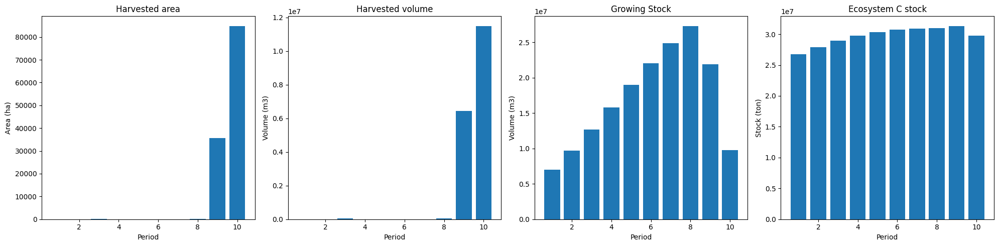

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_no_cons_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  19092
The economic indicator (the provincial government revenues) is:  651097
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


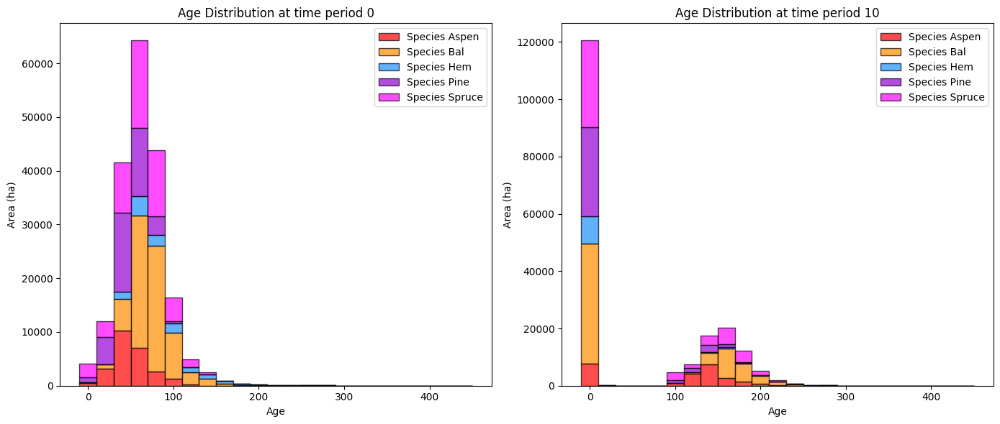

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_no_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  3485.893305  3483.184771
Bal     278.565372  7368.335601  7089.770229
Aspen   273.490478  9252.111513  8978.621035
Pine      0.000000  1097.627363  1097.627363
Hem     419.699331   705.040396   285.341065

Overall diversity has **increased** by 20934.54 hectares from time period 0 to time period 10.


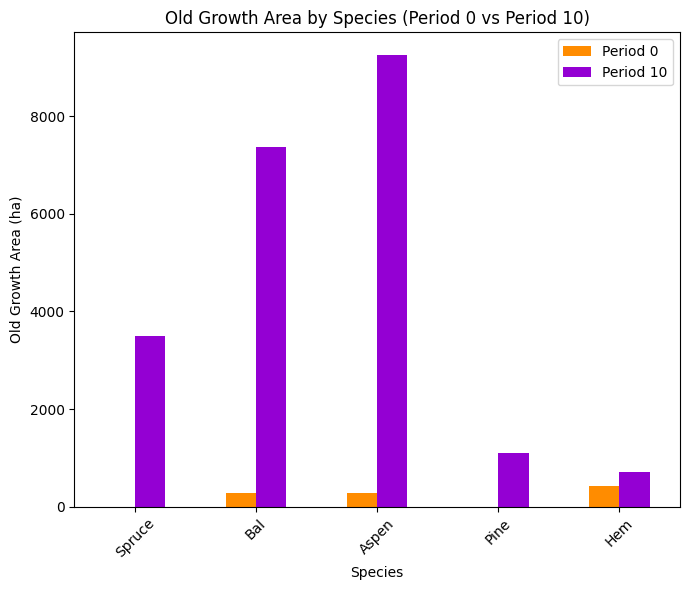

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_no_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8672

Diversity has **decreased** by 7.83% from time 0 to time 10.


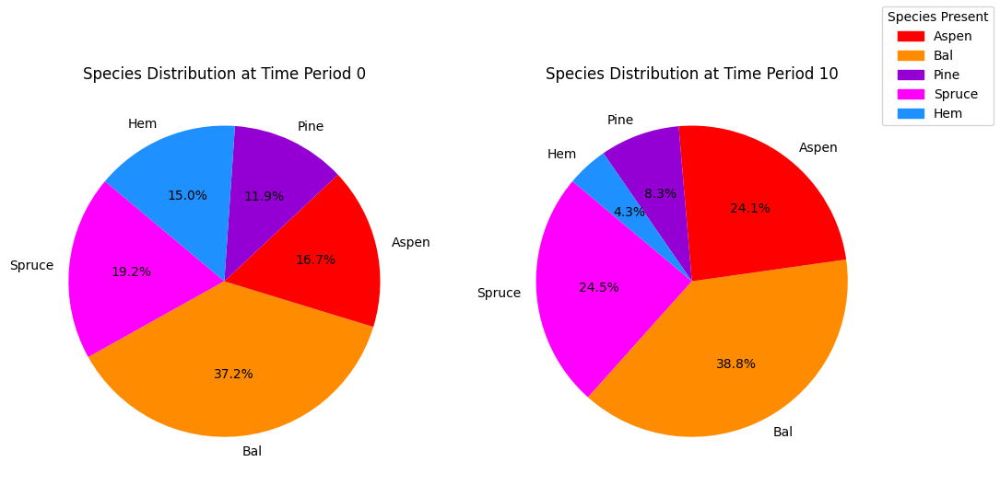

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_no_cons_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Factor Ops

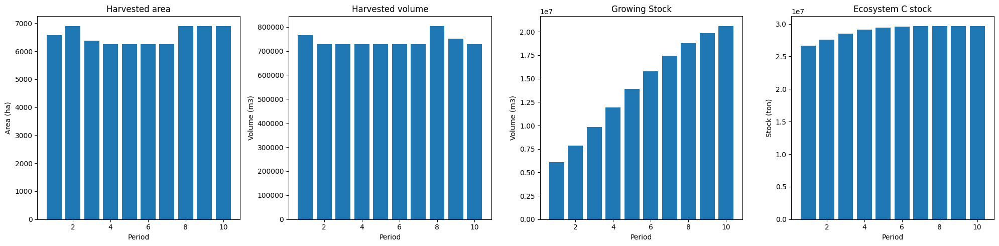

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


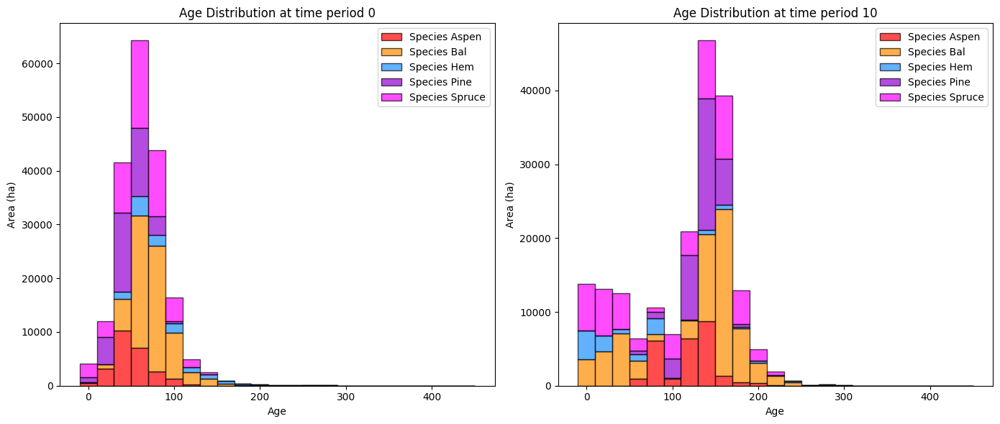

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


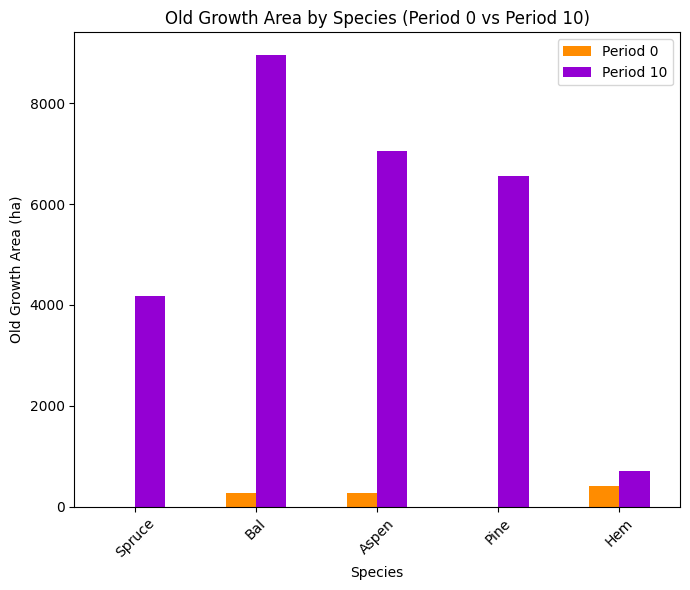

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


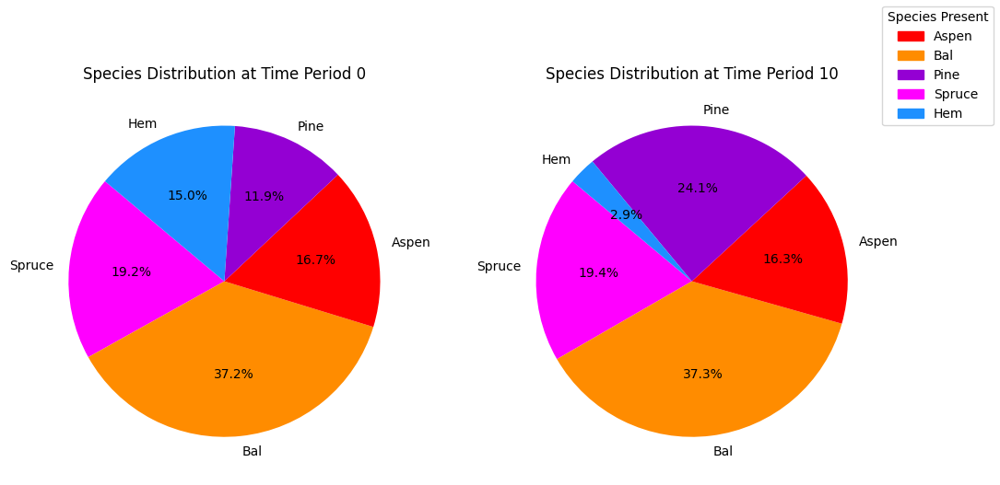

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


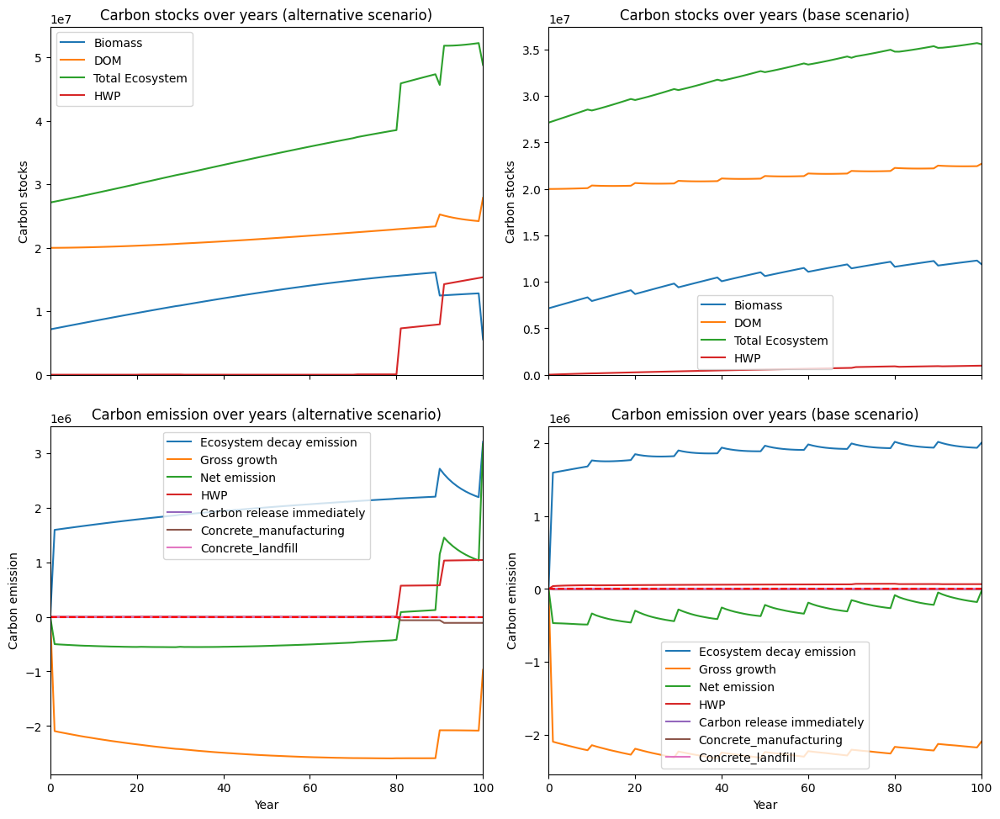

---------------------------------------------------------------------------------------
Net emission difference -2714002.0926293414
Net emission base scenario -12859876.164167123
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  3.6845955377698107
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  -685.086458  -685.086458
Bal     0.0 -1587.216897 -1587.216897
Aspen   0.0  2210.414504  2210.414504
Pine    0.0 -5466.636417 -5466.636417
Hem     0.0    -5.863017    -5.863017

Overall, the old growth area has **decreased** by -5534.39 hectares in the alternative scenario compared to the base scenario.


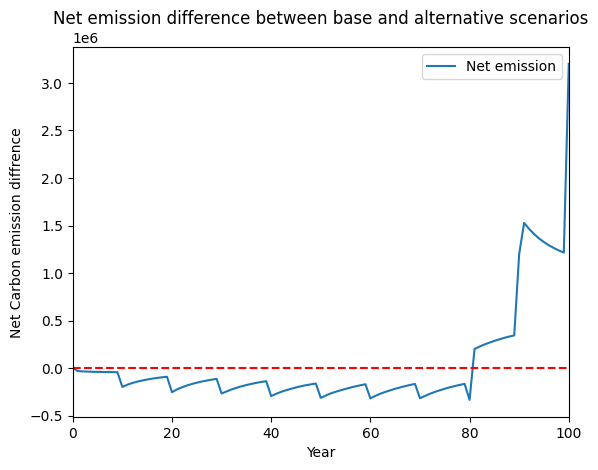

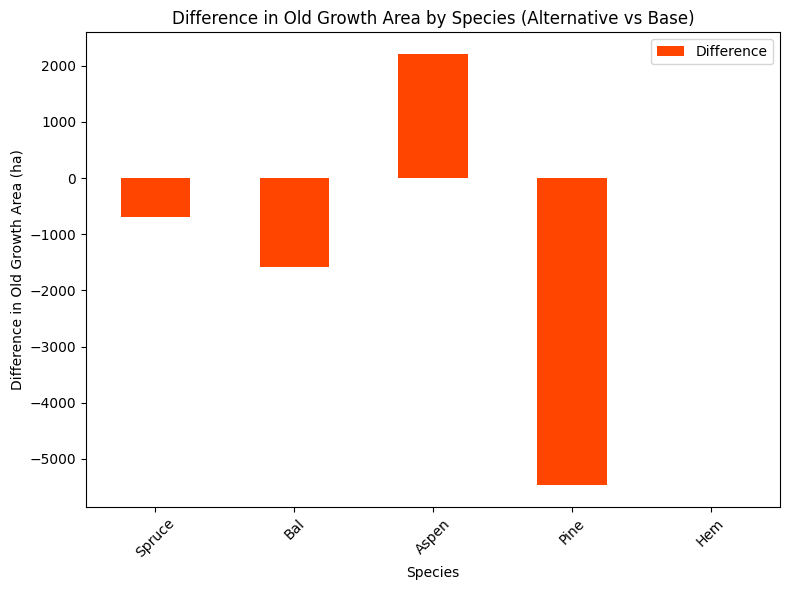

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


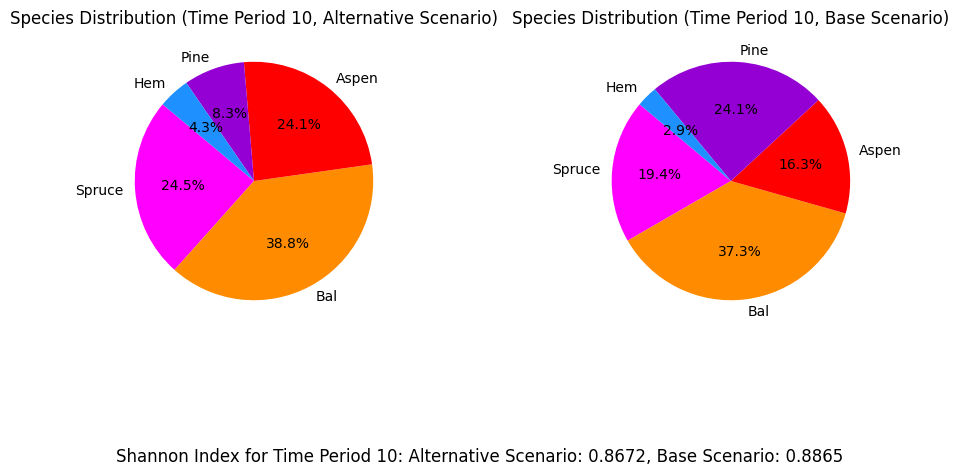

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_evenflow_cons...
running even flow constraints scenario
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3945 rows, 36130 columns and 430076 nonzeros
Model fingerprint: 0xf26b8e00
Coefficient statistics:
  Matrix range     [1e-02, 9e+04]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 1e+00]
Presolve removed 2035 rows and 2031 columns
Presolve time: 0.11s
Presolved: 1910 rows, 34099 columns, 402875 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering ti

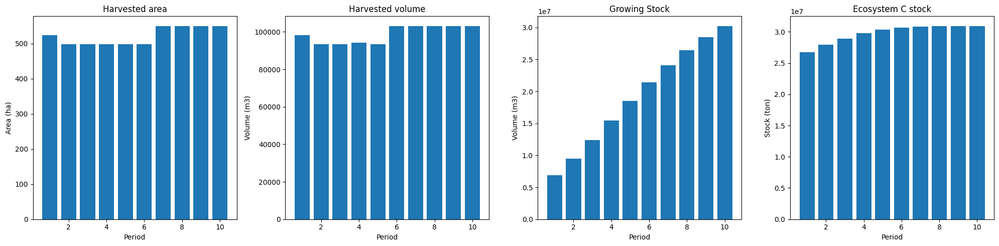

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_evenflow_cons_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  1044
The economic indicator (the provincial government revenues) is:  35629
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


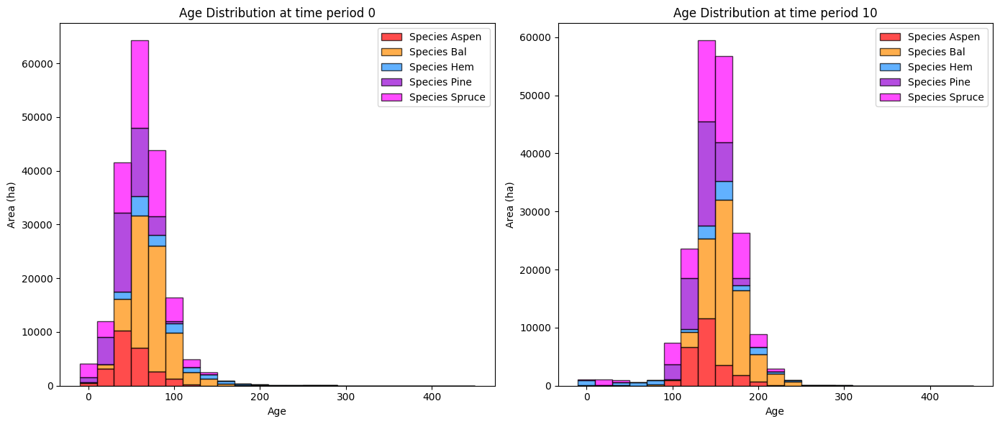

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_evenflow_cons_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   7198.583984   7195.875451
Bal     278.565372  15630.607060  15352.041688
Aspen   273.490478  13191.618272  12918.127794
Pine      0.000000   7631.887200   7631.887200
Hem     419.699331   1858.556296   1438.856965

Overall diversity has **increased** by 44536.79 hectares from time period 0 to time period 10.


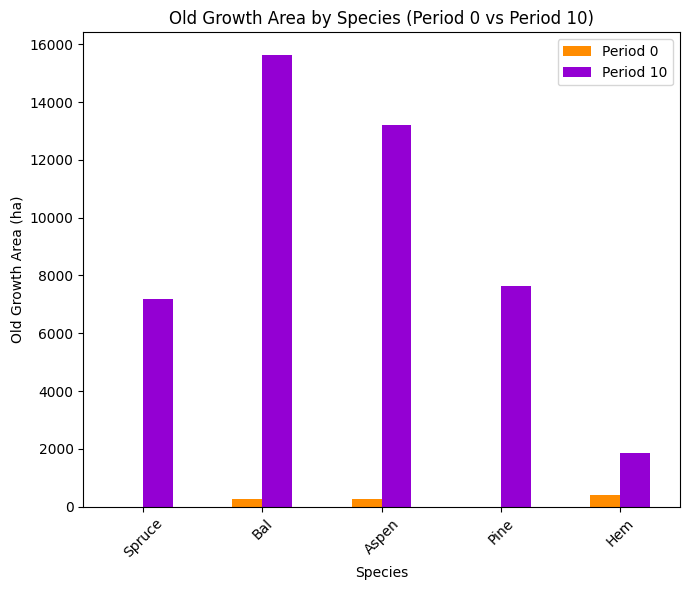

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_evenflow_cons_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.9163

Diversity has **decreased** by 2.93% from time 0 to time 10.


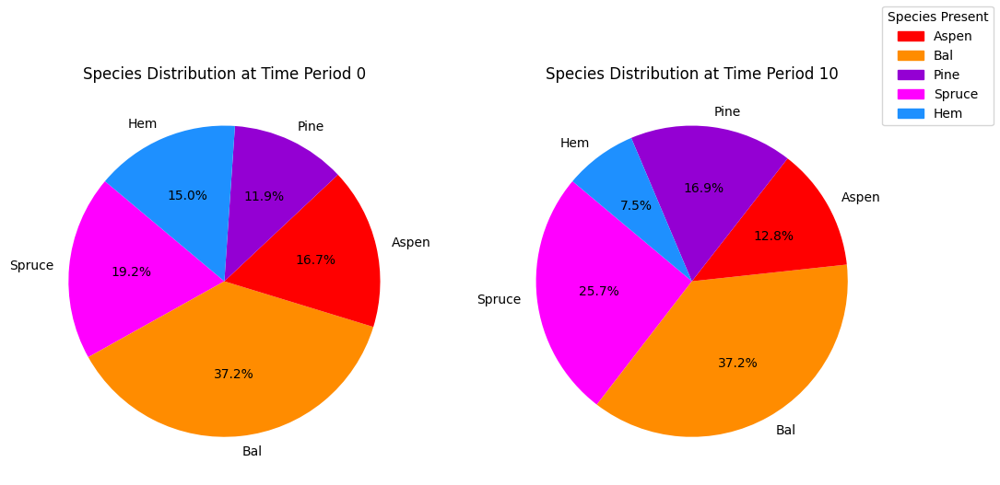

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_evenflow_cons_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.12s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

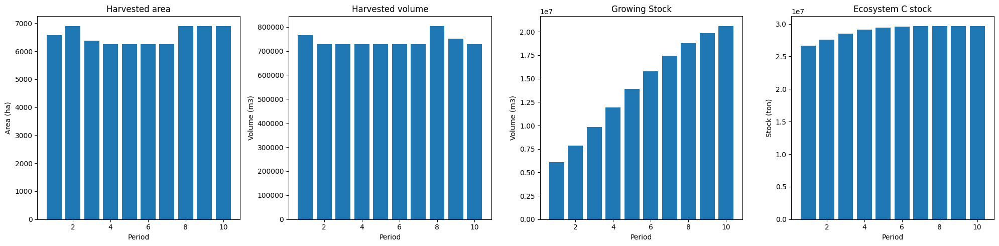

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


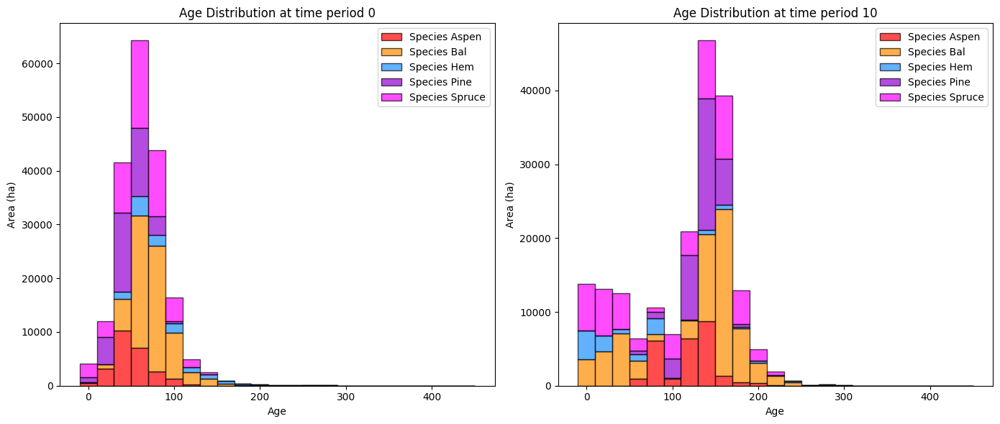

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


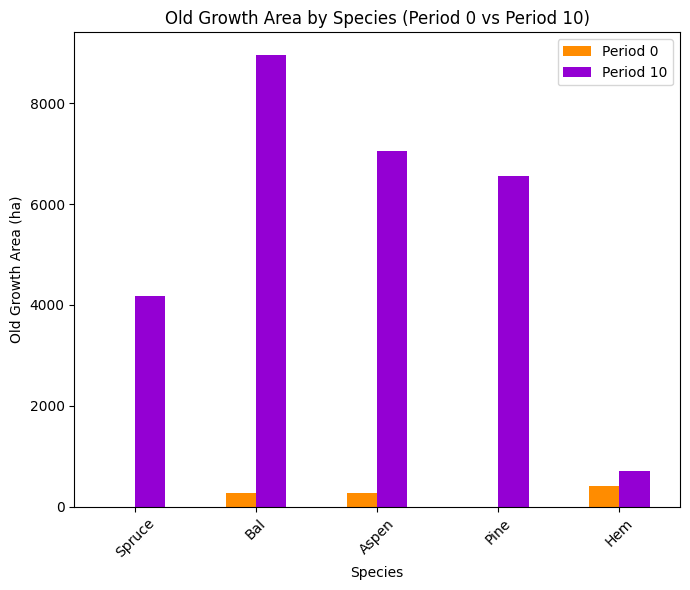

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


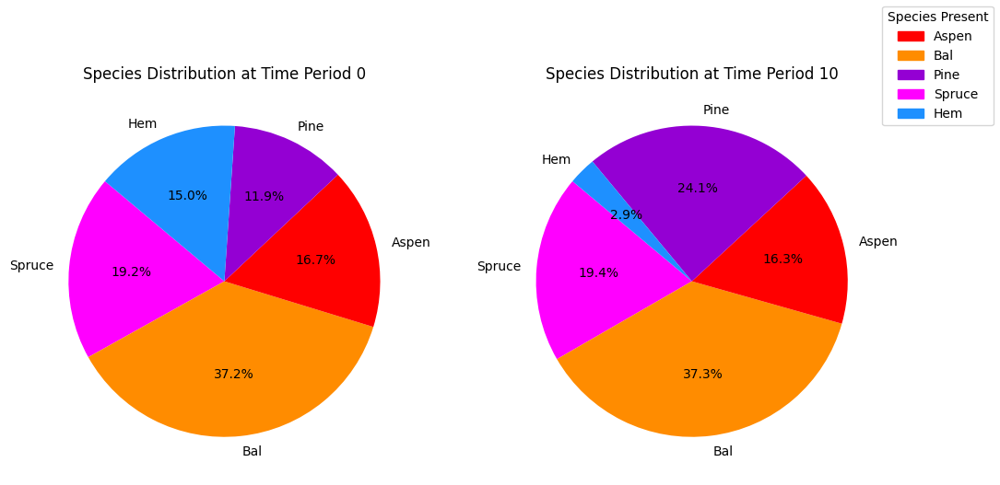

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


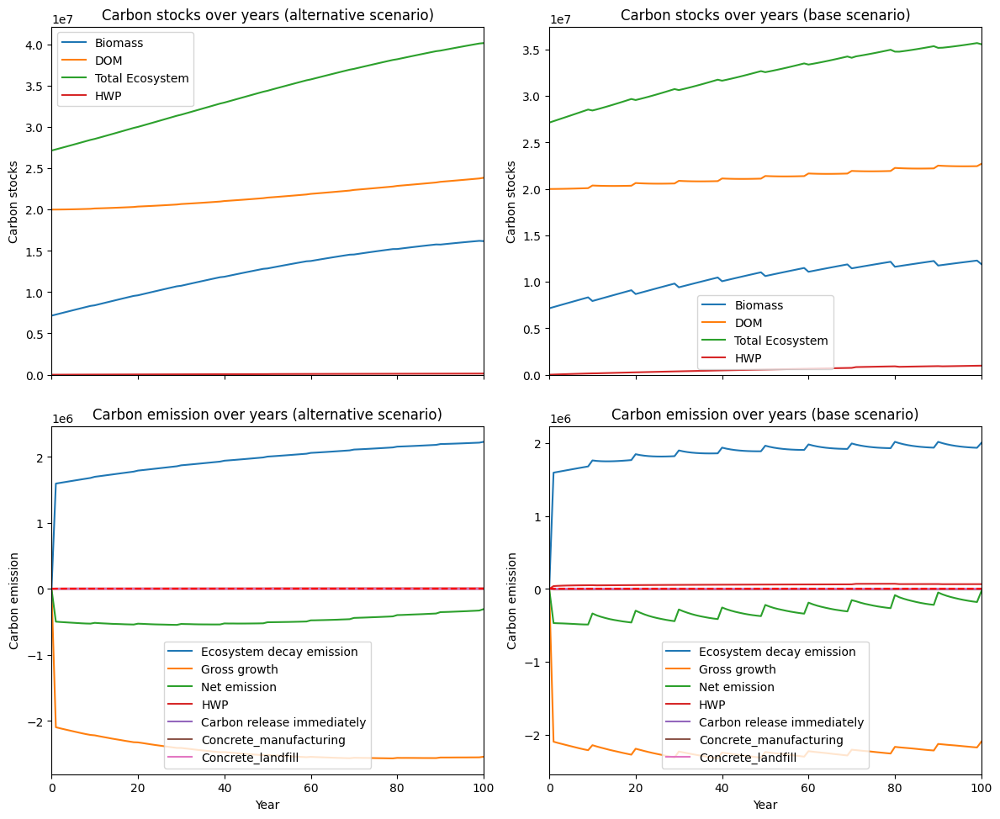

---------------------------------------------------------------------------------------
Net emission difference -2422123.4734100164
Net emission base scenario -12567997.544947797
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  4.128608681505975
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  3027.604221  3027.604221
Bal     0.0  6675.054562  6675.054562
Aspen   0.0  6149.921263  6149.921263
Pine    0.0  1067.623420  1067.623420
Hem     0.0  1147.652883  1147.652883

Overall, the old growth area has **increased** by 18067.86 hectares in the alternative scenario compared to the base scenario.


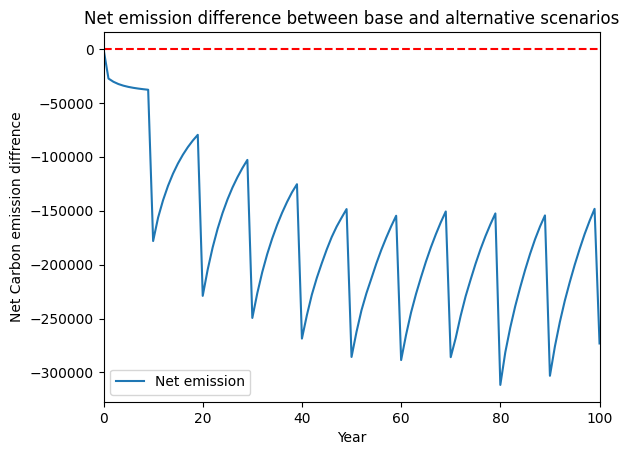

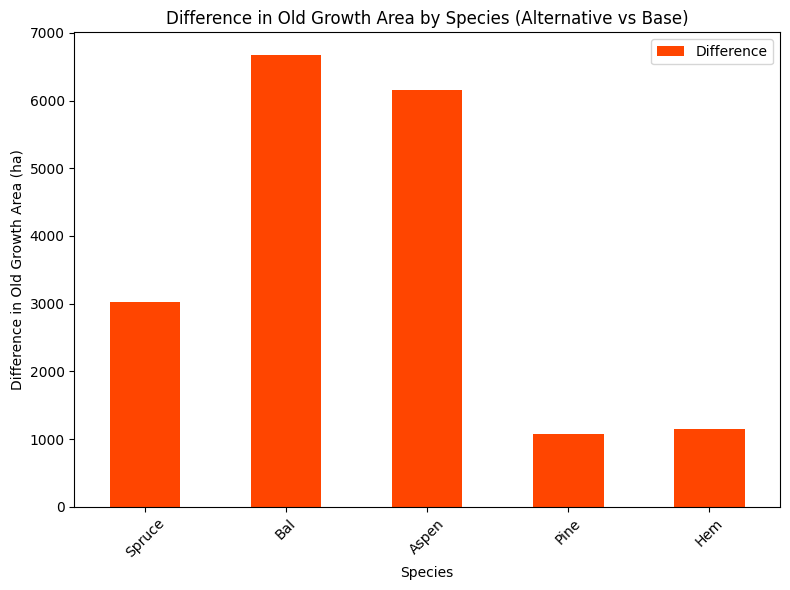

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


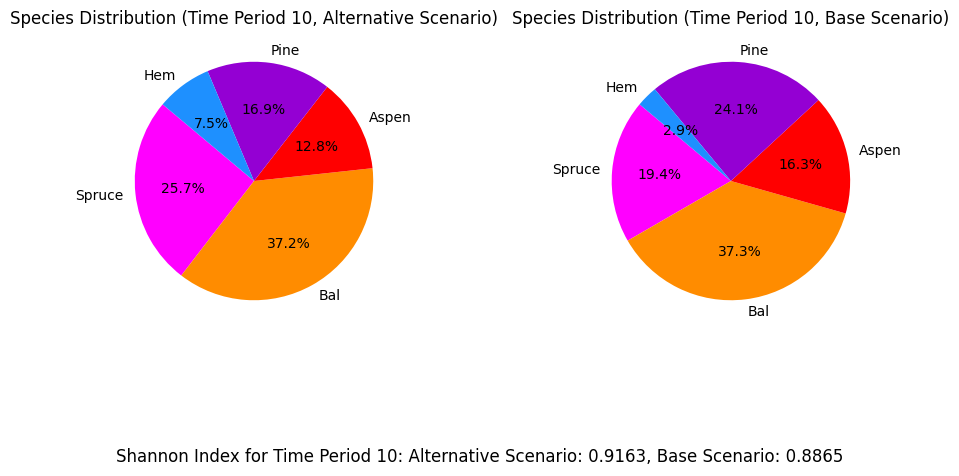

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_bau_gldbr...
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier lo

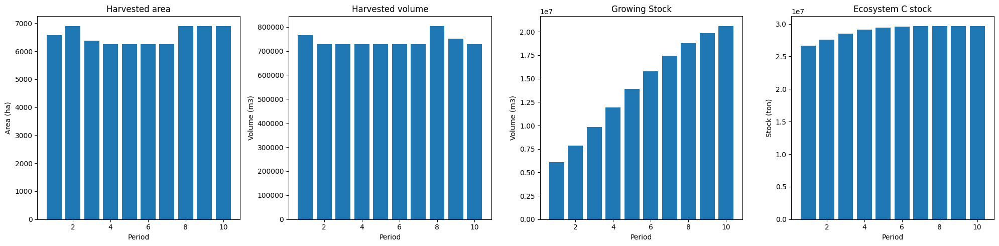

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


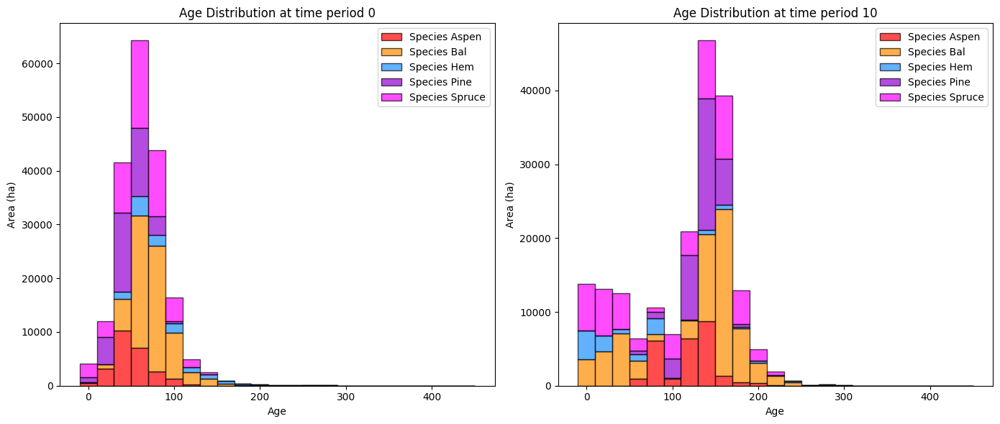

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


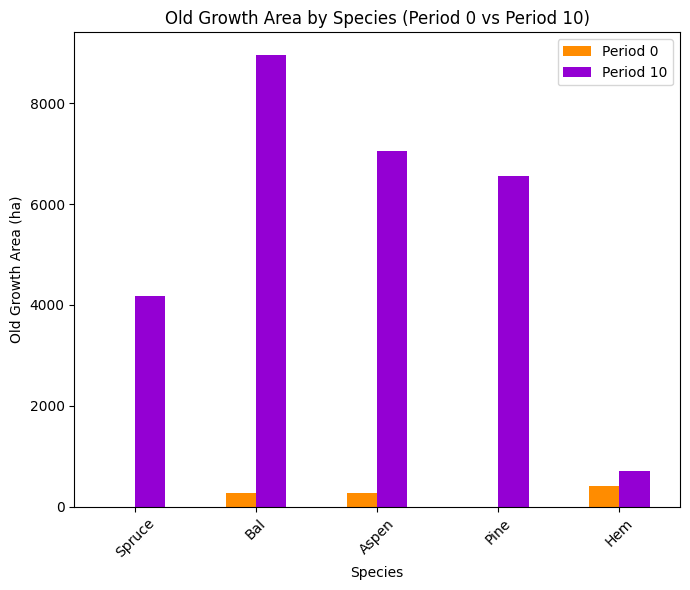

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


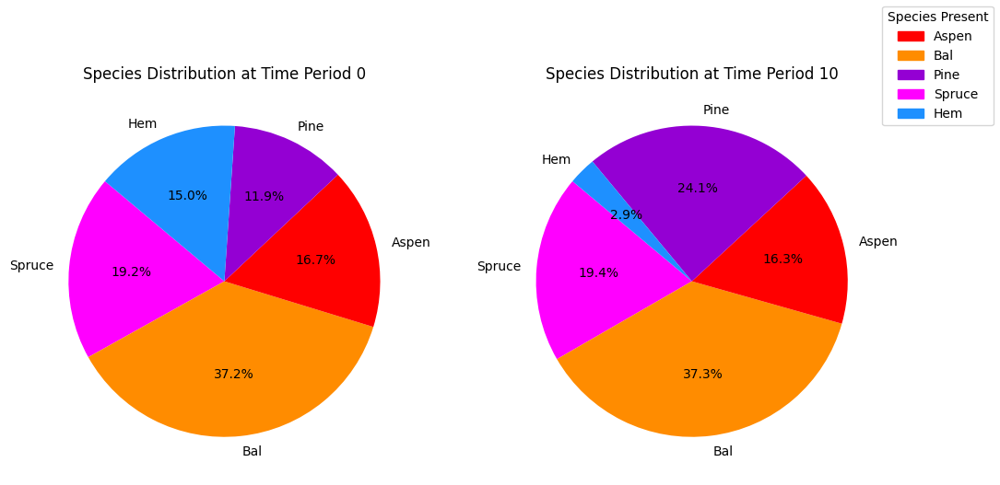

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.12s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Factor O

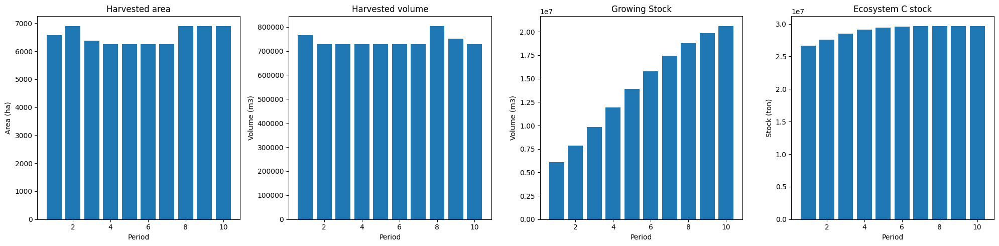

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


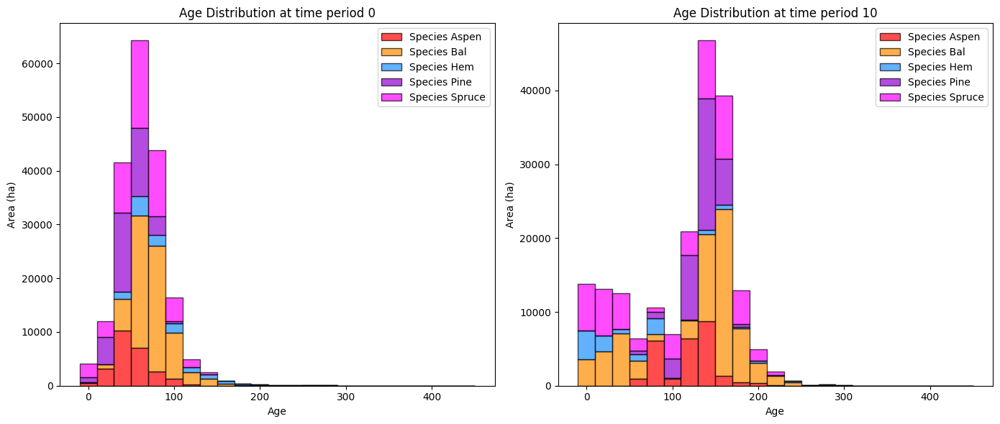

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


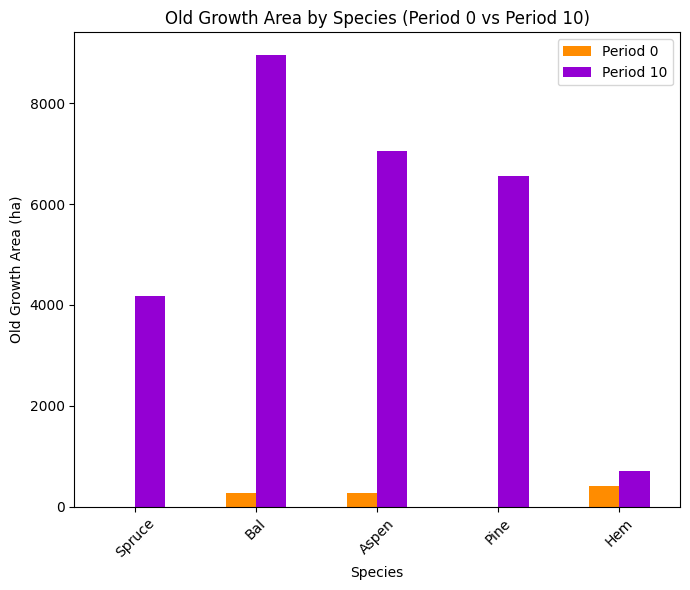

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


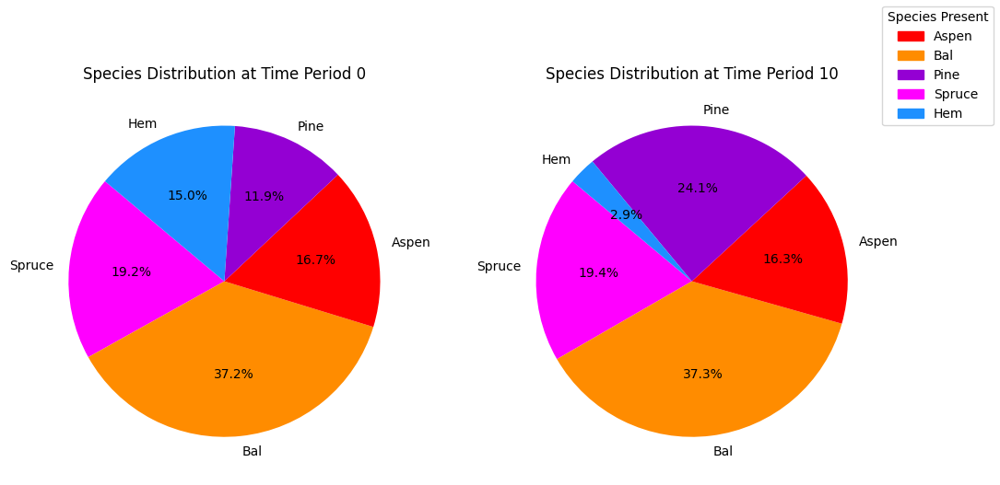

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


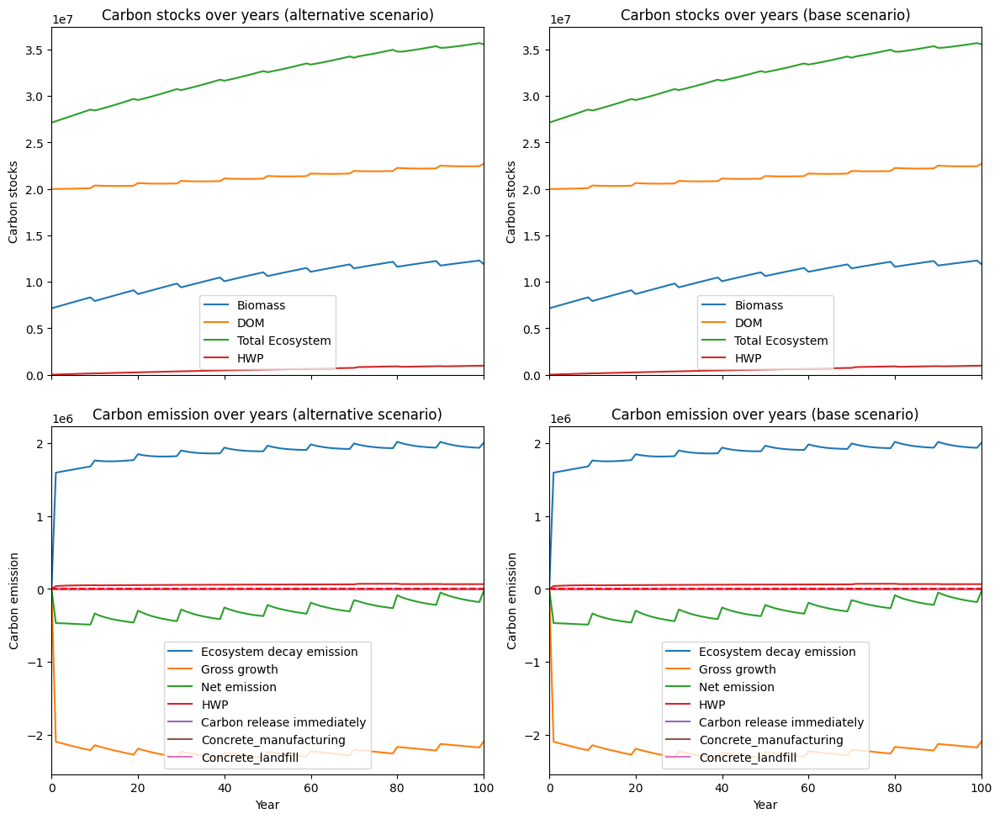

---------------------------------------------------------------------------------------
Net emission difference 0.0
Net emission base scenario -10145874.071537782
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  inf
Comparison of Old Growth Areas (Alternative - Base)
          0   10  Difference
Spruce  0.0  0.0         0.0
Bal     0.0  0.0         0.0
Aspen   0.0  0.0         0.0
Pine    0.0  0.0         0.0
Hem     0.0  0.0         0.0

Overall, the old growth area has **increased** by 0.00 hectares in the alternative scenario compared to the base scenario.


/media/data/project/eghasemi/nbds_mining/util_opt.py:1211: RuntimeWarning: divide by zero encountered in scalar divide
  dollar_per_ton = abs(budget_input / dif_scenario.iloc[:25]['Net emission'].sum())


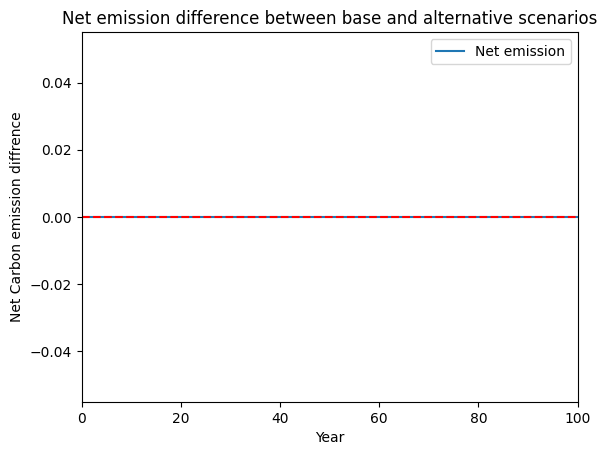

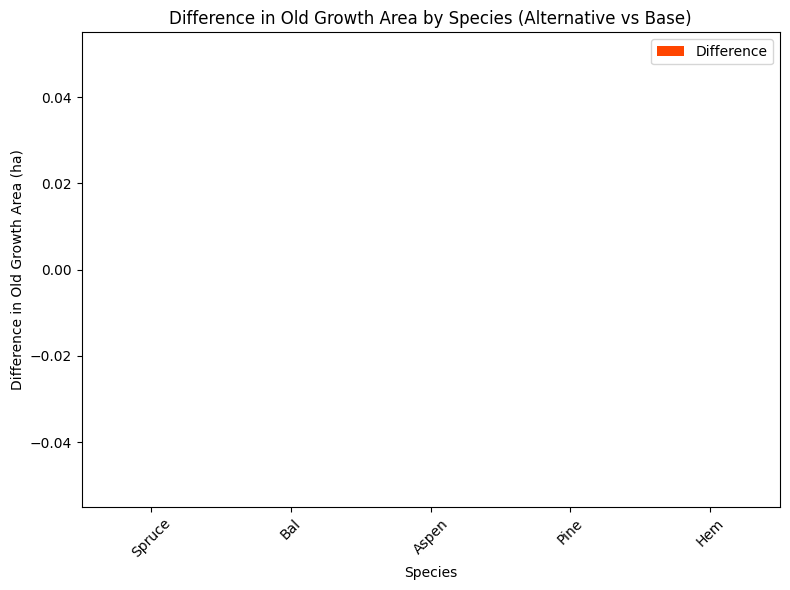

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


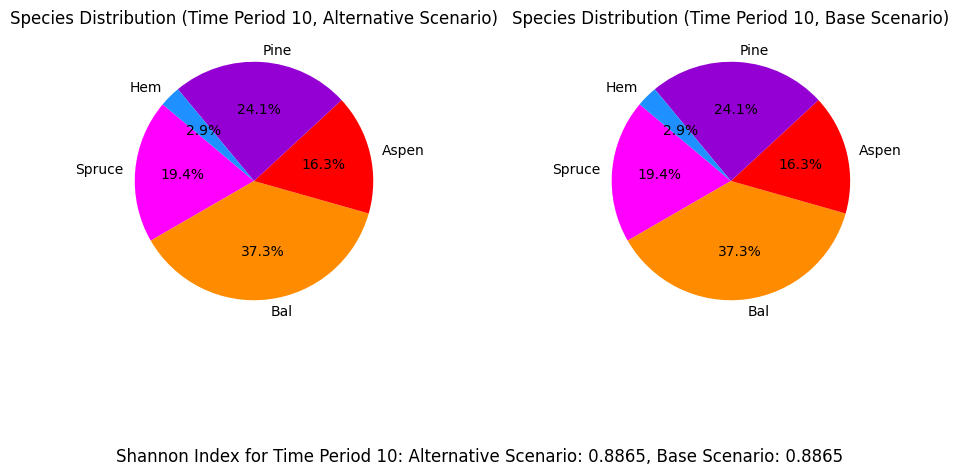

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_90%...
running the scenario for the Golden Bear mining site (90%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0x52482630
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.15s
Presolved: 1911 rows, 34100 

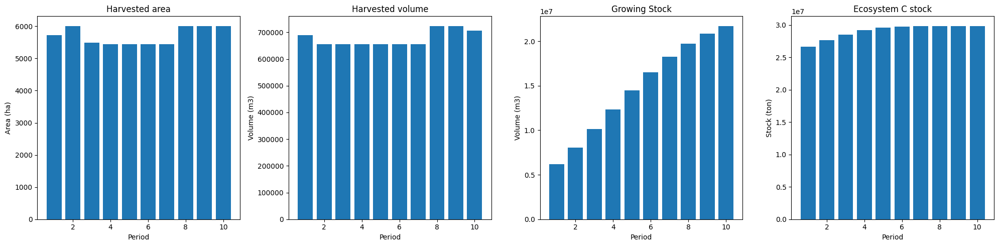

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_90%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7161
The economic indicator (the provincial government revenues) is:  244210
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


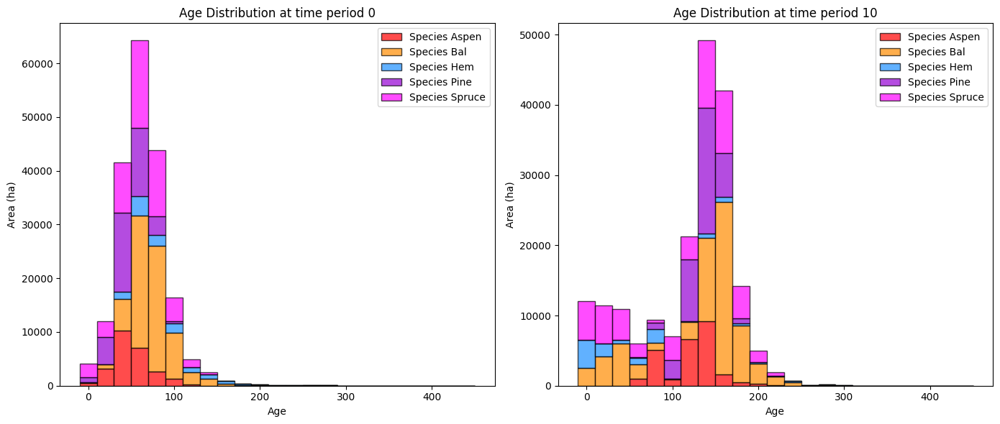

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_90%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4464.356751  4461.648218
Bal     278.565372  9760.530499  9481.965127
Aspen   273.490478  7741.206007  7467.715529
Pine      0.000000  6902.802138  6902.802138
Hem     419.699331   731.925091   312.225760

Overall diversity has **increased** by 28626.36 hectares from time period 0 to time period 10.


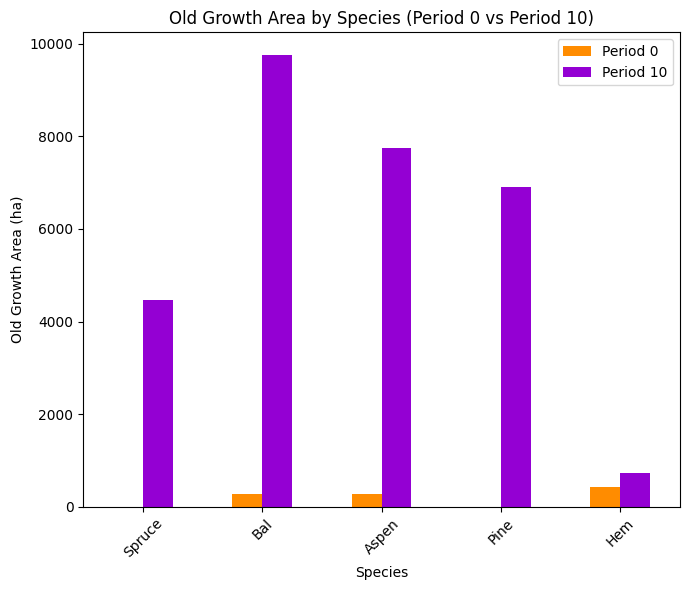

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_90%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8841

Diversity has **decreased** by 6.14% from time 0 to time 10.


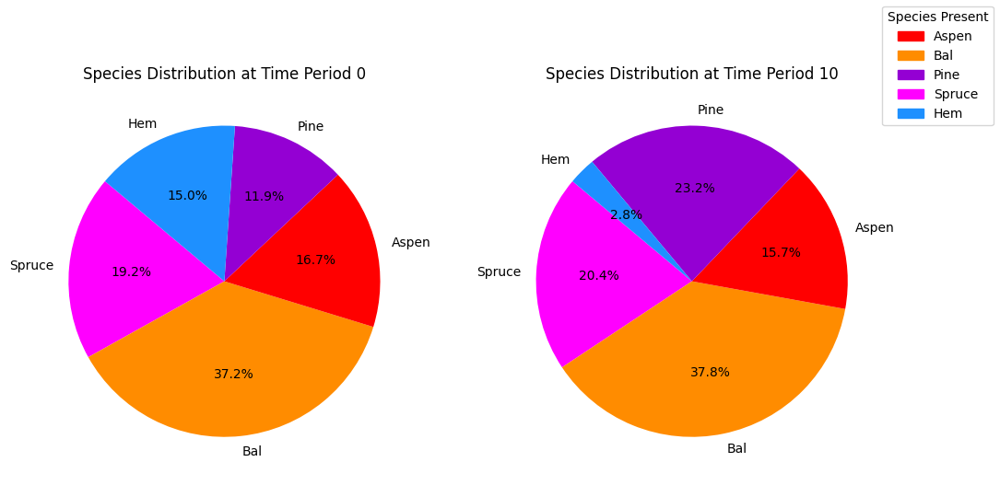

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_90%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

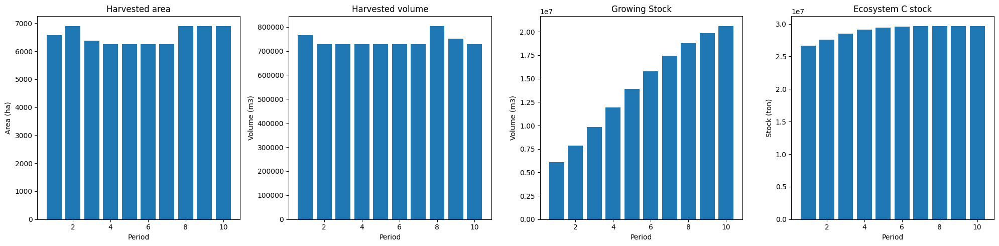

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


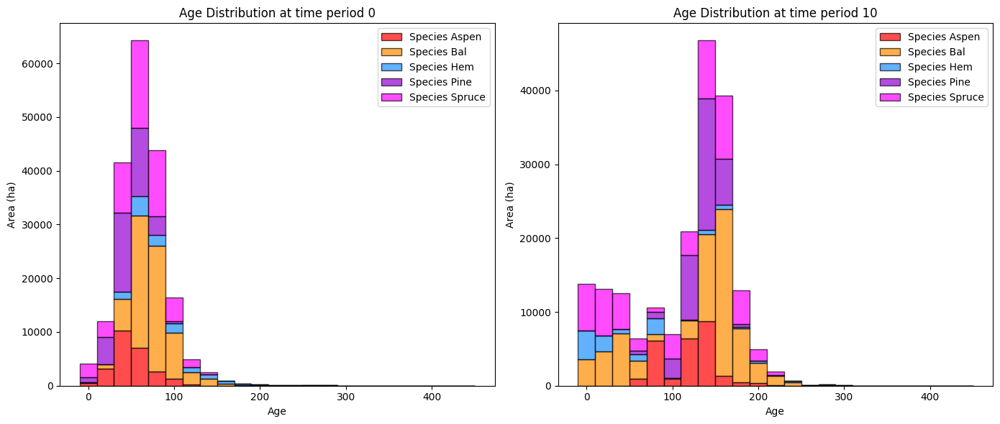

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


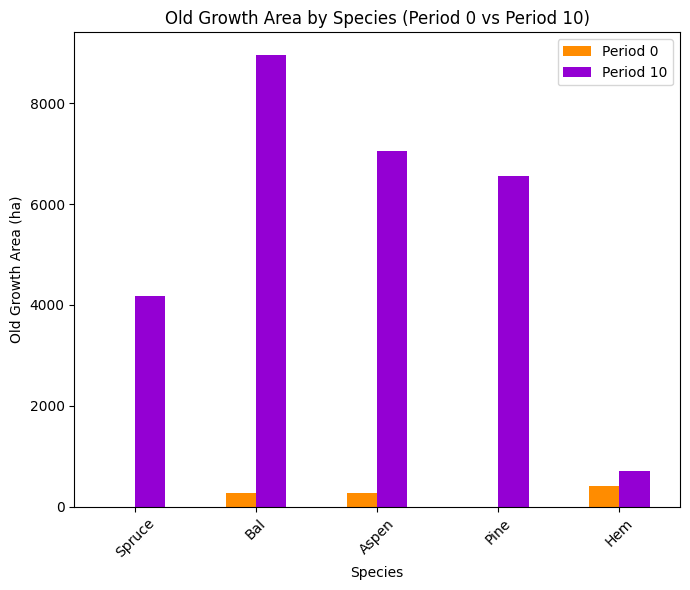

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


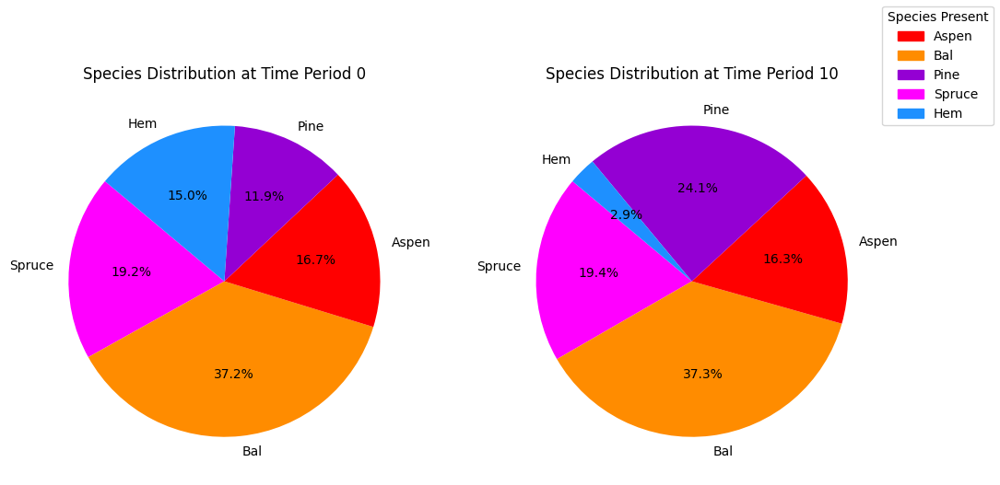

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


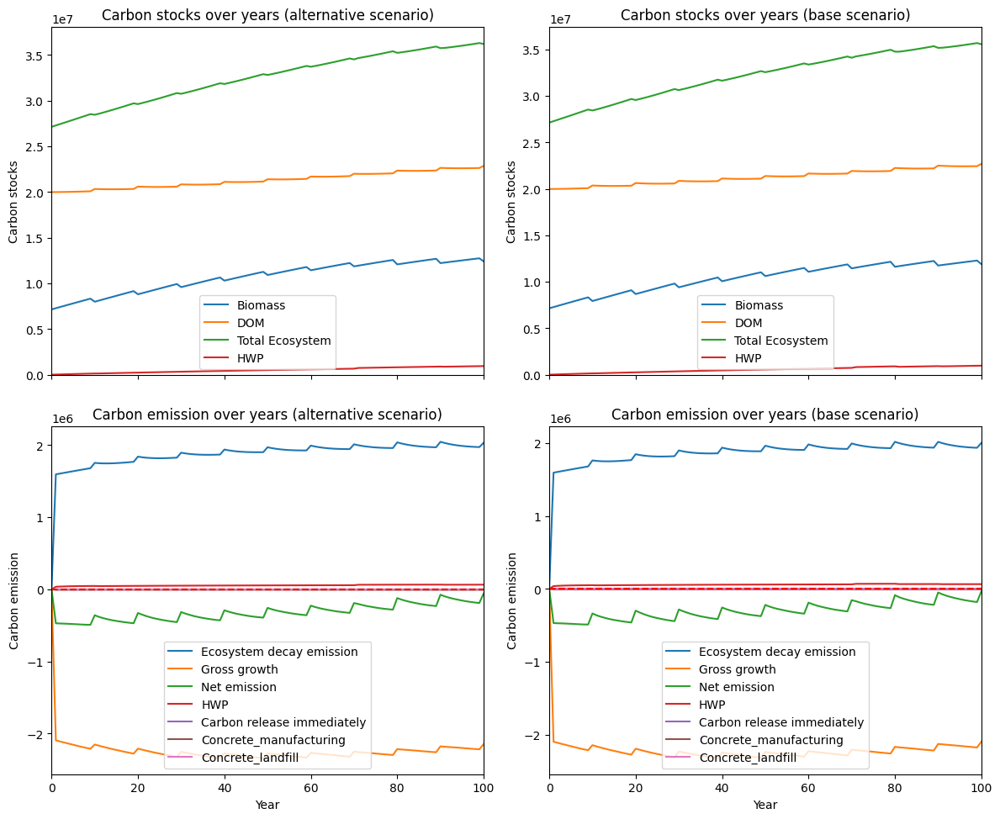

---------------------------------------------------------------------------------------
Net emission difference -315651.4224269583
Net emission base scenario -10461525.49396474
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  31.680516194454974
Comparison of Old Growth Areas (Alternative - Base)
          0          10  Difference
Spruce  0.0  293.376988  293.376988
Bal     0.0  804.978001  804.978001
Aspen   0.0  699.508998  699.508998
Pine    0.0  338.538357  338.538357
Hem     0.0   21.021677   21.021677

Overall, the old growth area has **increased** by 2157.42 hectares in the alternative scenario compared to the base scenario.


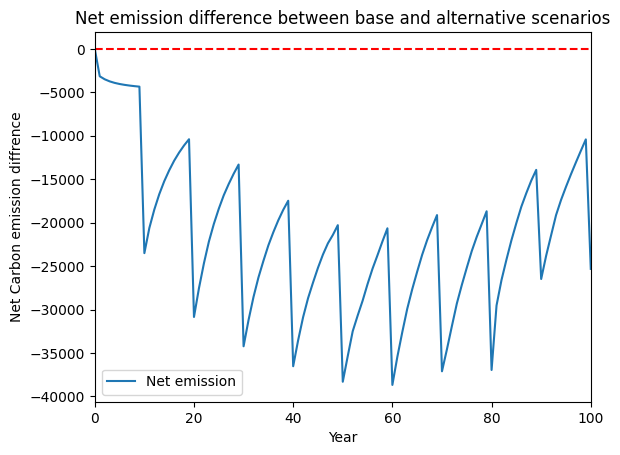

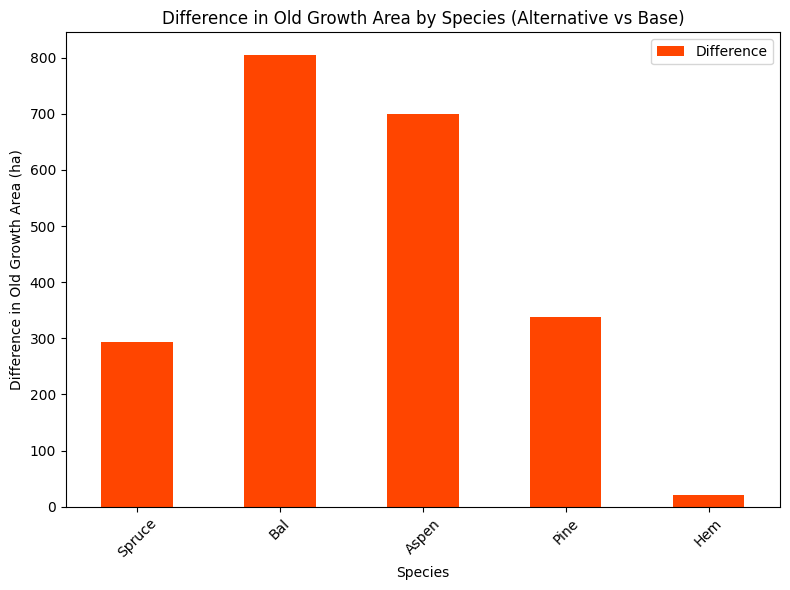

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


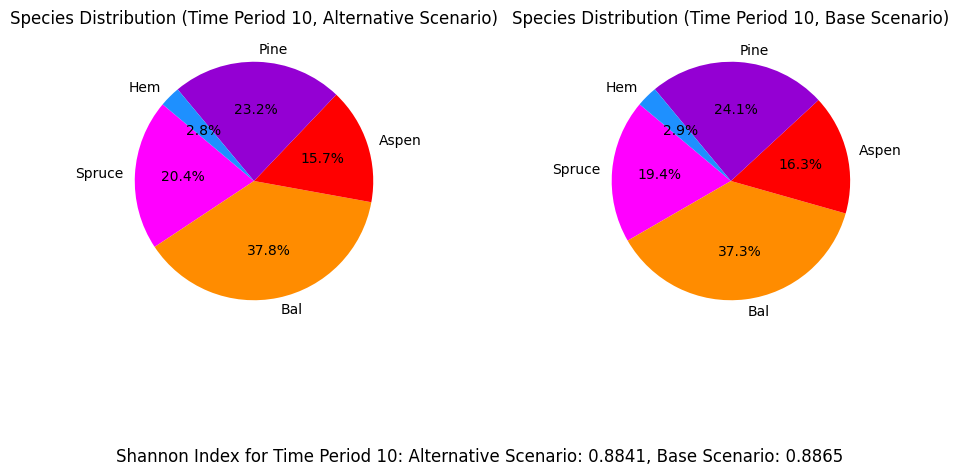

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_80%...
running the scenario for the Golden Bear mining site (80%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xef005892
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.18s
Presolved: 1911 rows, 34100 

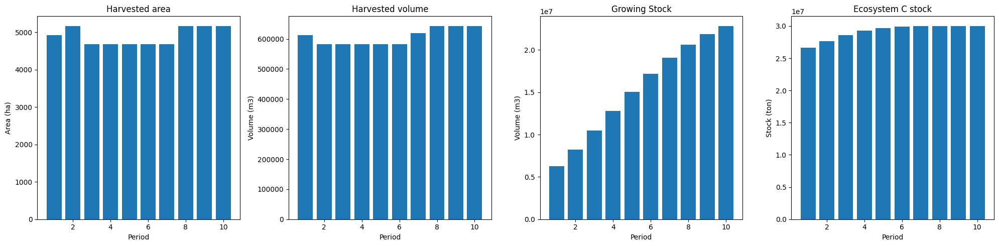

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_80%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  6421
The economic indicator (the provincial government revenues) is:  218972
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


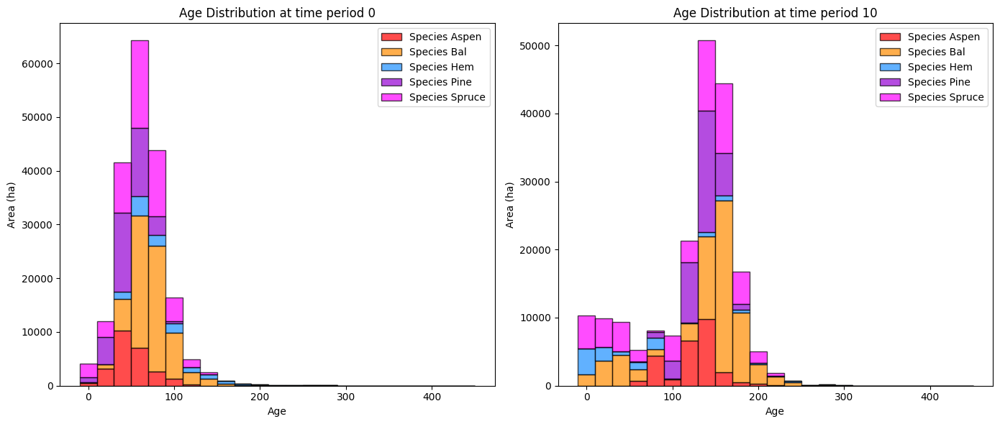

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_80%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   4751.704077   4748.995543
Bal     278.565372  10628.763750  10350.198378
Aspen   273.490478   8530.319404   8256.828926
Pine      0.000000   6976.016150   6976.016150
Hem     419.699331    759.720458    340.021127

Overall diversity has **increased** by 30672.06 hectares from time period 0 to time period 10.


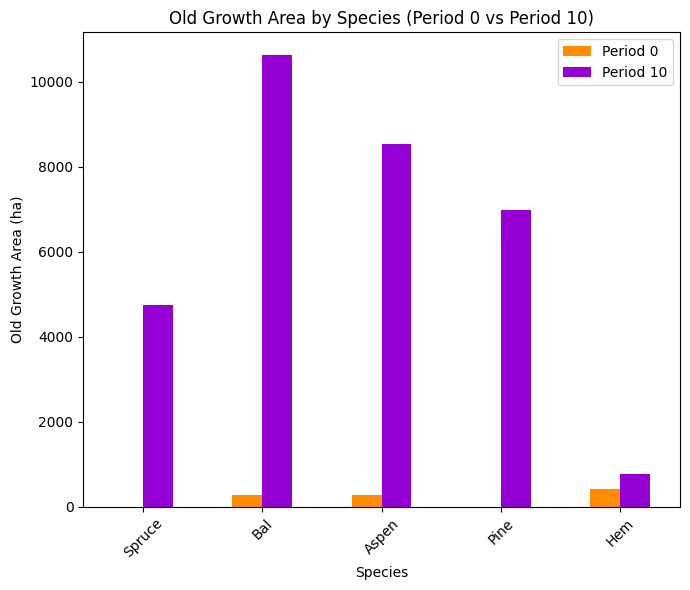

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_80%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8807

Diversity has **decreased** by 6.48% from time 0 to time 10.


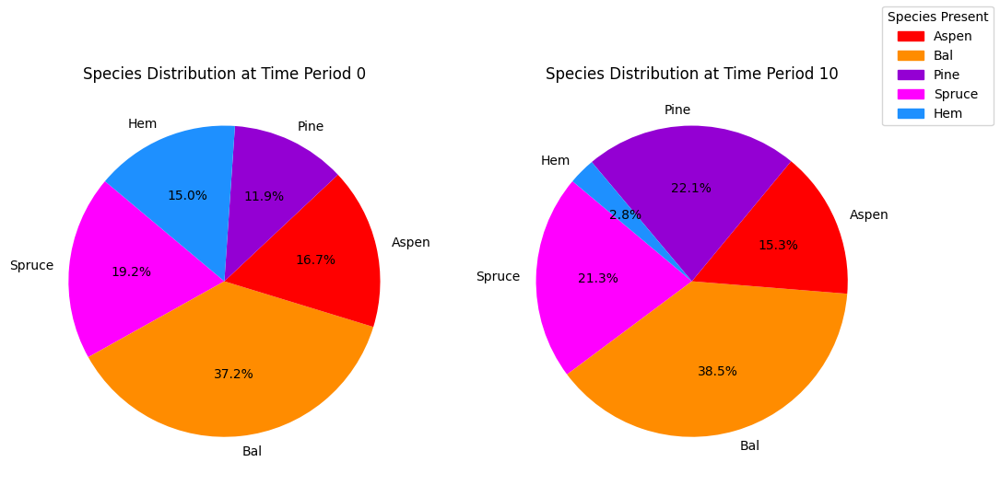

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_80%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

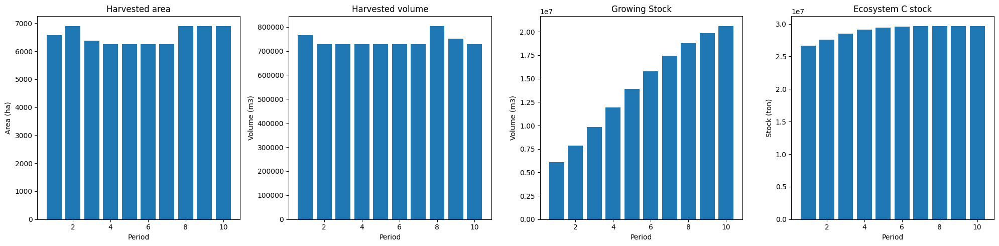

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


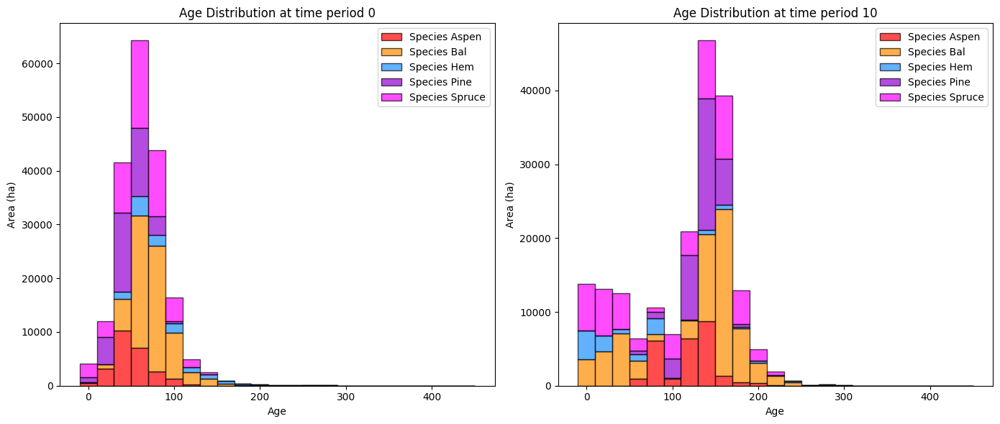

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


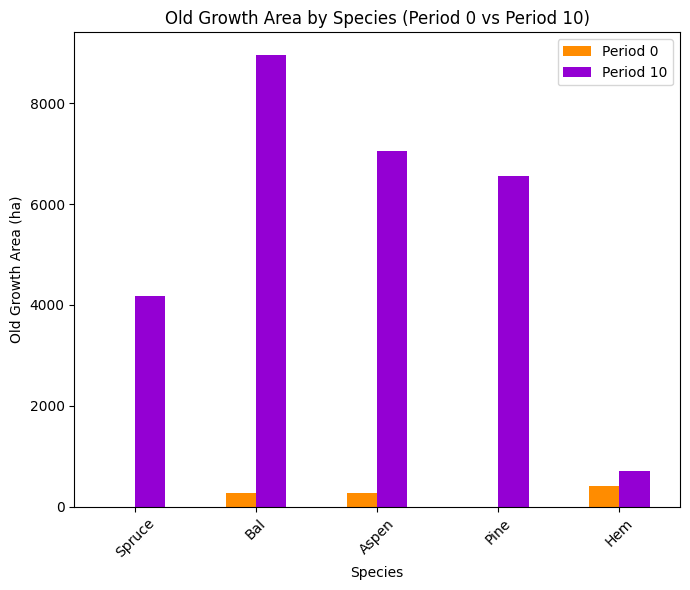

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


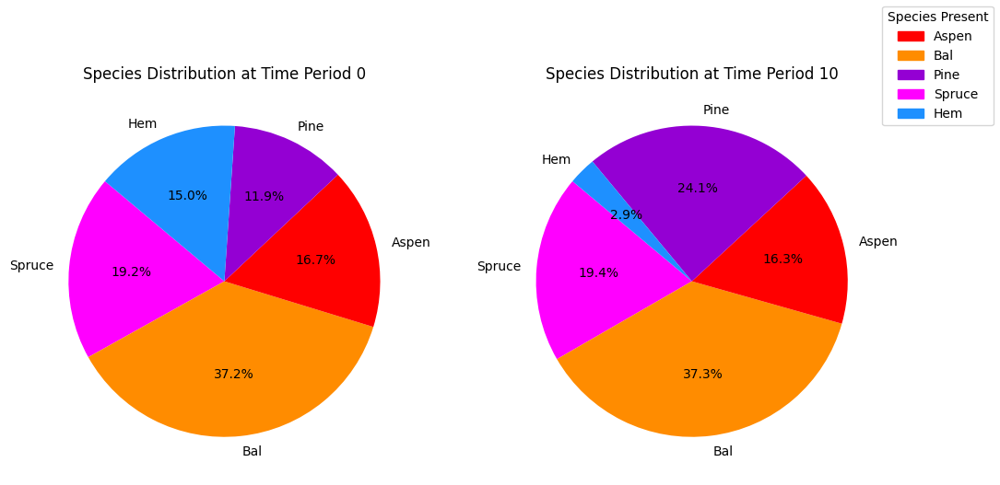

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


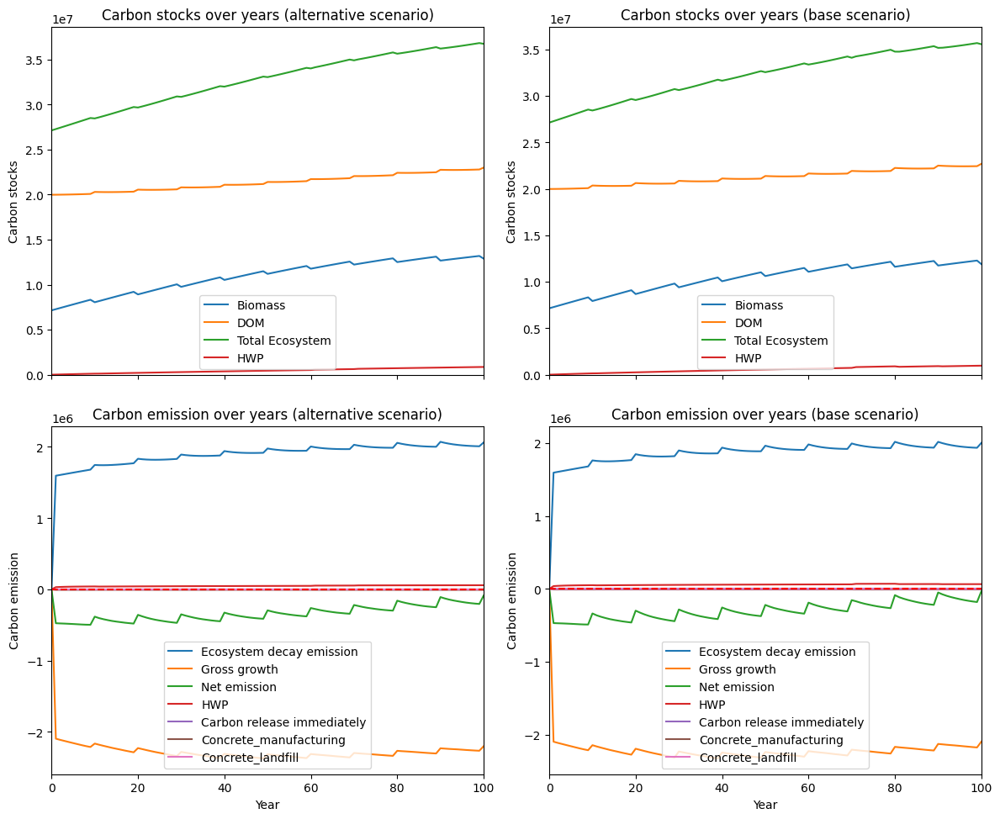

---------------------------------------------------------------------------------------
Net emission difference -616775.9209297395
Net emission base scenario -10762649.99246752
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  16.213343713103804
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0   580.724314   580.724314
Bal     0.0  1673.211252  1673.211252
Aspen   0.0  1488.622395  1488.622395
Pine    0.0   411.752370   411.752370
Hem     0.0    48.817044    48.817044

Overall, the old growth area has **increased** by 4203.13 hectares in the alternative scenario compared to the base scenario.


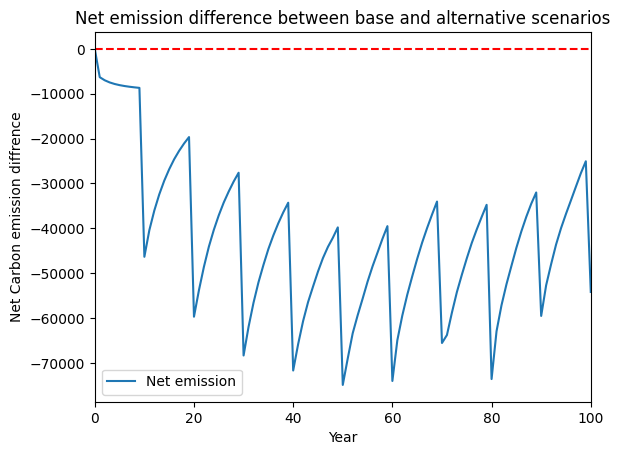

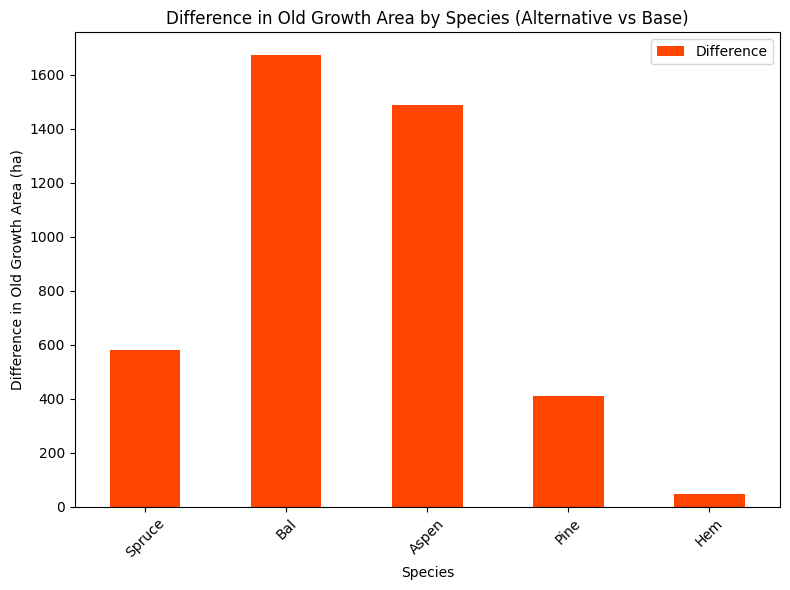

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


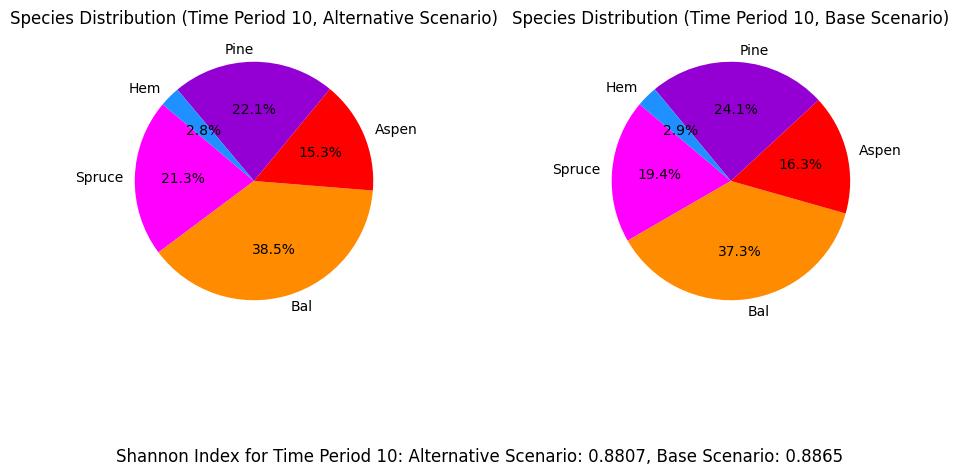

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_70%...
running the scenario for the Golden Bear mining site (70%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xeb3b5a66
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1911 rows, 34100 

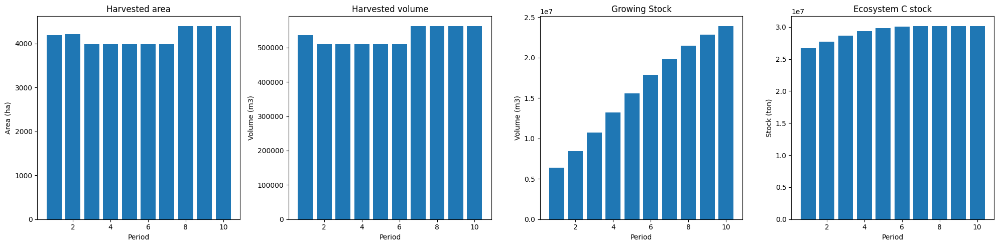

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_70%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  5640
The economic indicator (the provincial government revenues) is:  192366
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


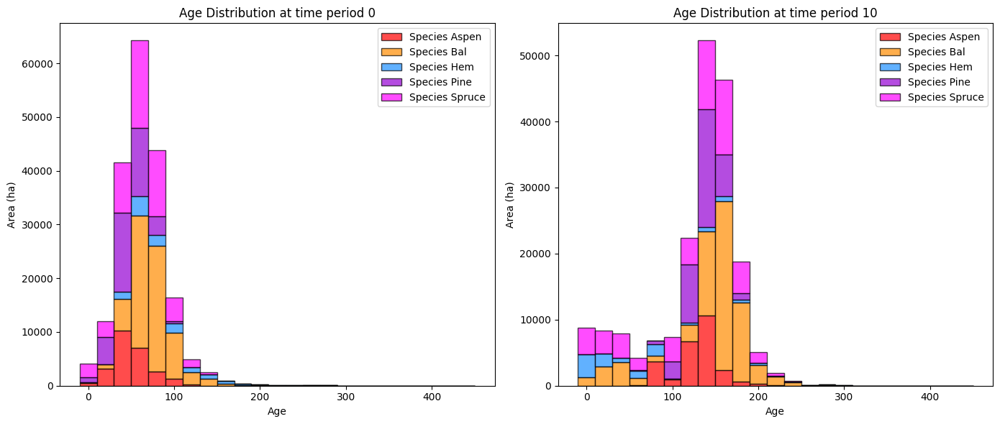

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_70%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   4867.746044   4865.037511
Bal     278.565372  11411.894023  11133.328652
Aspen   273.490478   9573.945182   9300.454704
Pine      0.000000   7162.842711   7162.842711
Hem     419.699331    779.239284    359.539953

Overall diversity has **increased** by 32821.20 hectares from time period 0 to time period 10.


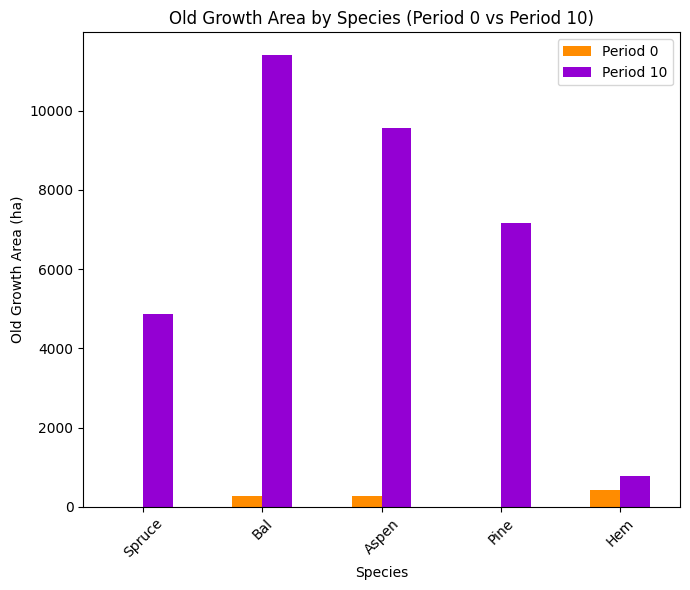

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_70%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8821

Diversity has **decreased** by 6.34% from time 0 to time 10.


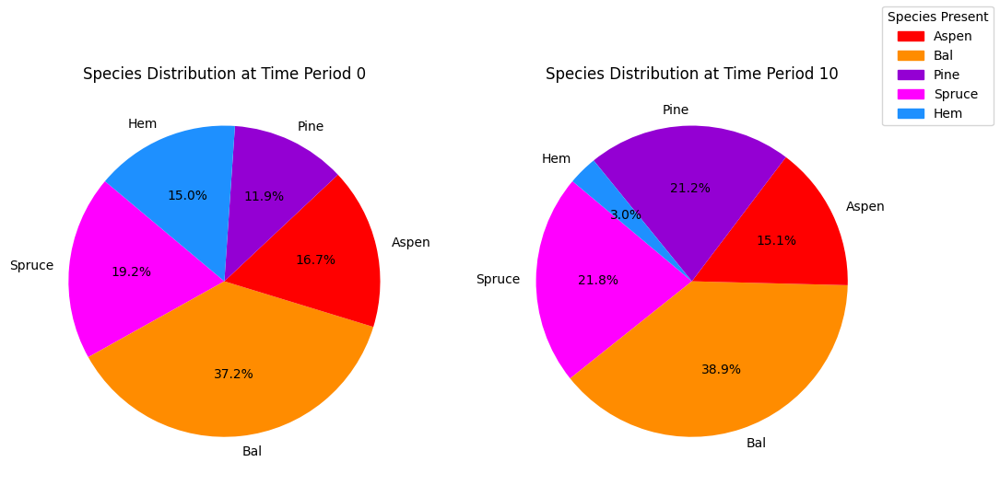

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_70%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.14s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

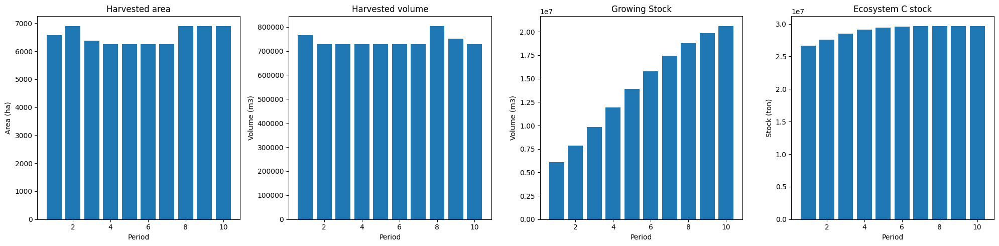

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


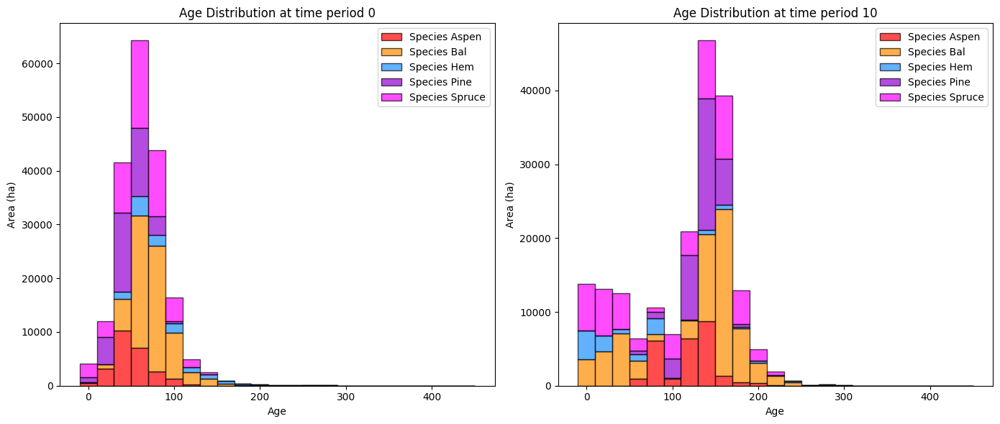

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


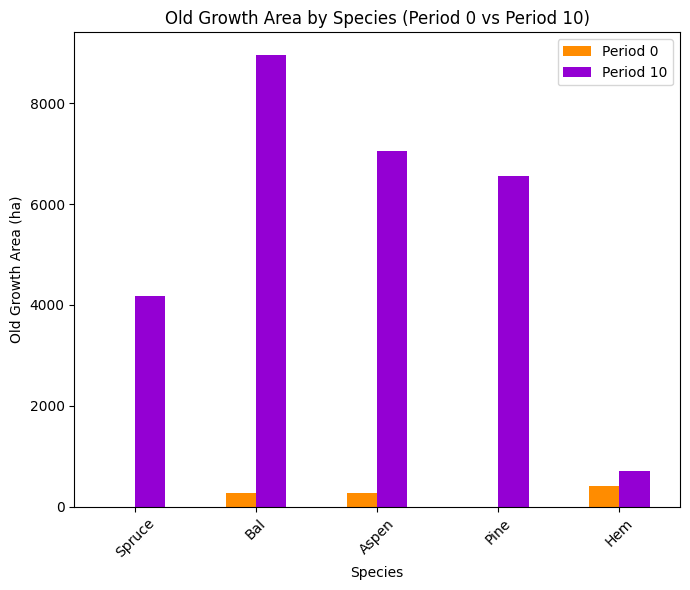

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


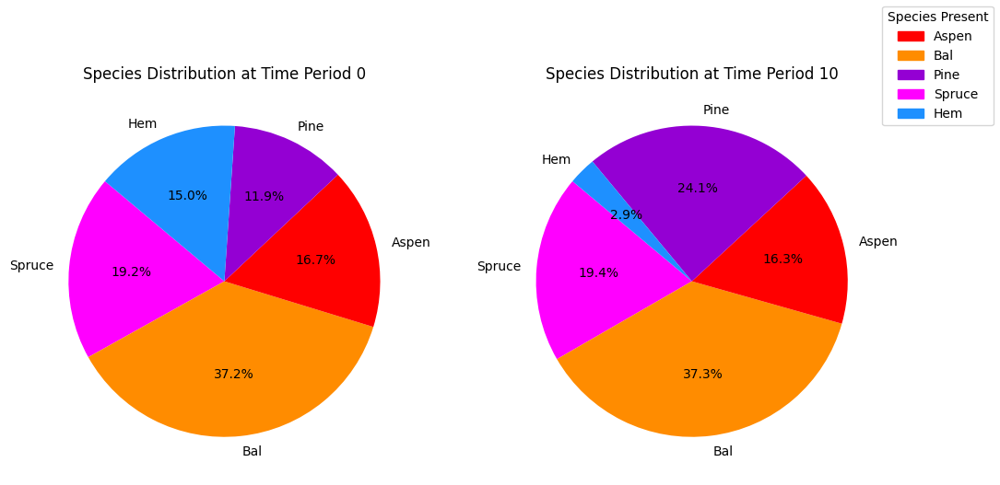

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


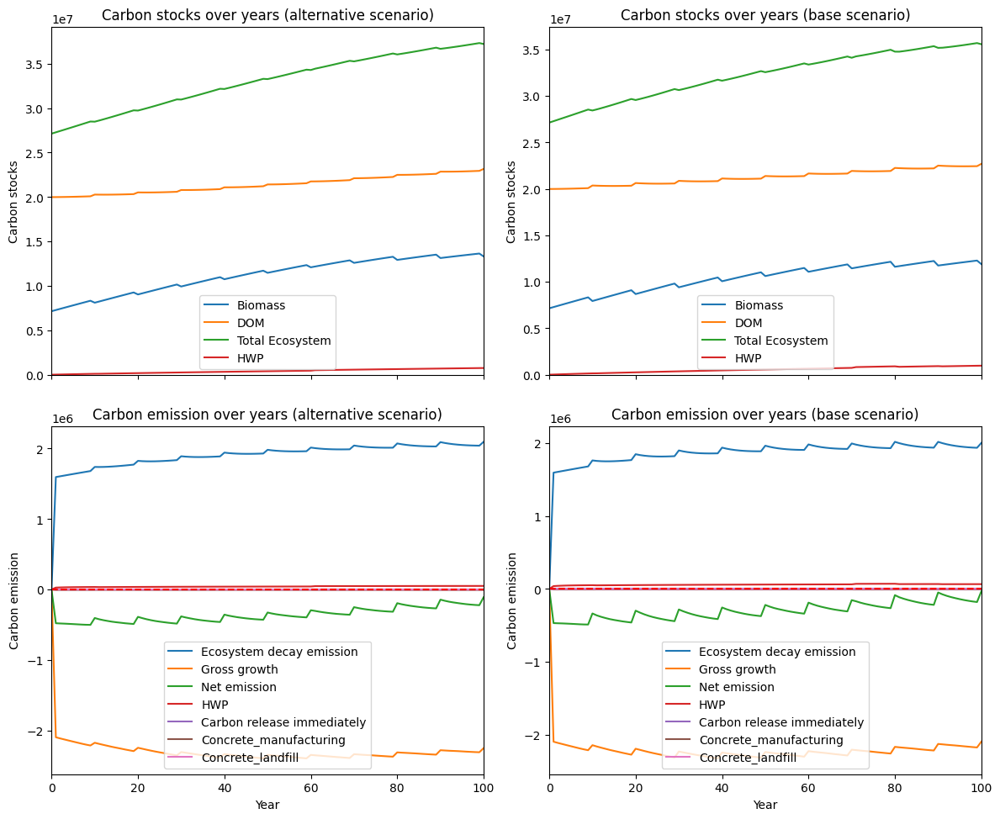

---------------------------------------------------------------------------------------
Net emission difference -911916.754013152
Net emission base scenario -11057790.825550934
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  10.965913232750822
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0   696.766281   696.766281
Bal     0.0  2456.341526  2456.341526
Aspen   0.0  2532.248172  2532.248172
Pine    0.0   598.578930   598.578930
Hem     0.0    68.335871    68.335871

Overall, the old growth area has **increased** by 6352.27 hectares in the alternative scenario compared to the base scenario.


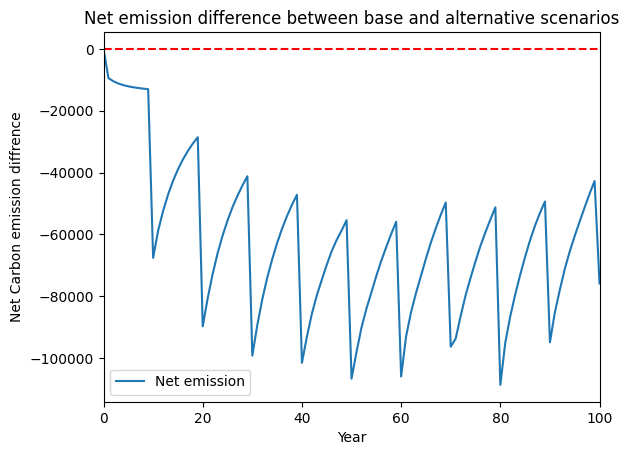

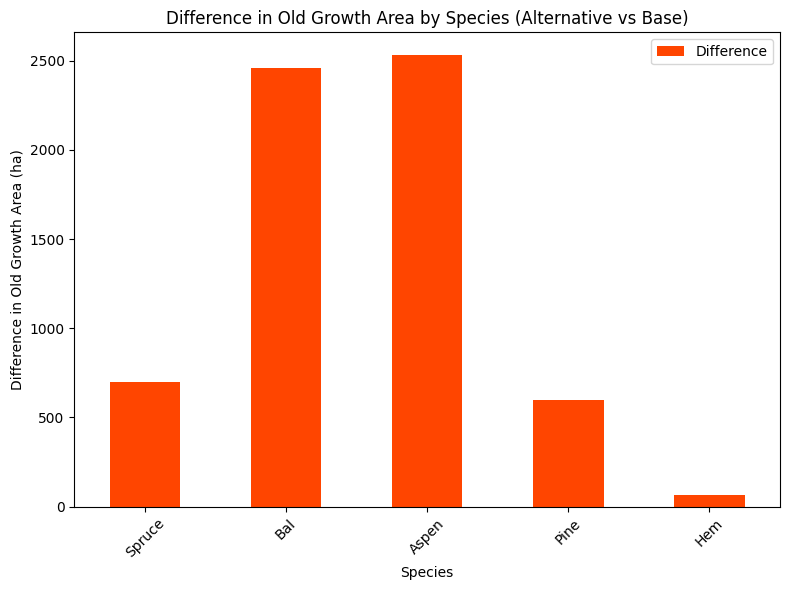

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


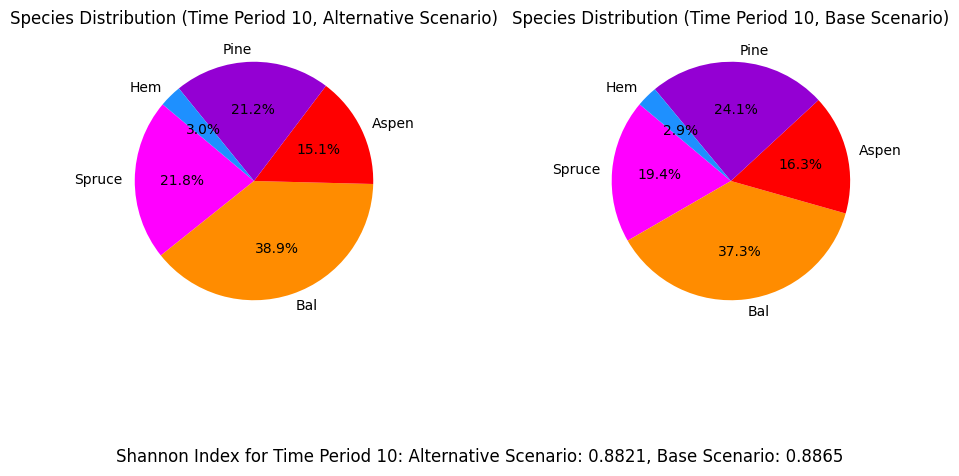

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_60%...
running the scenario for the Golden Bear mining site (60%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xf83026ea
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1911 rows, 34100 

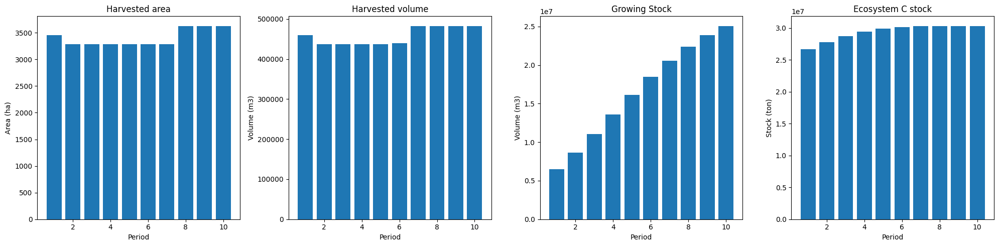

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_60%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  4837
The economic indicator (the provincial government revenues) is:  164972
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


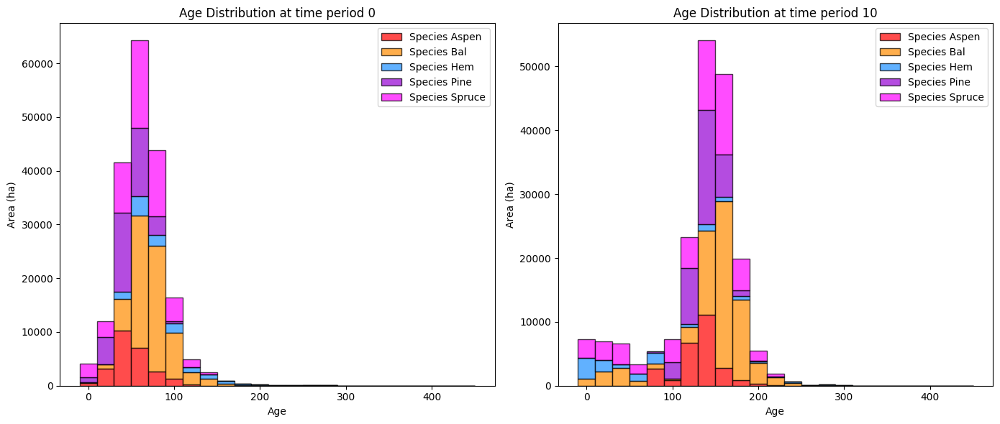

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_60%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   5065.390803   5062.682270
Bal     278.565372  12069.677653  11791.112281
Aspen   273.490478  10585.587180  10312.096702
Pine      0.000000   7406.031919   7406.031919
Hem     419.699331    790.922530    371.223199

Overall diversity has **increased** by 34943.15 hectares from time period 0 to time period 10.


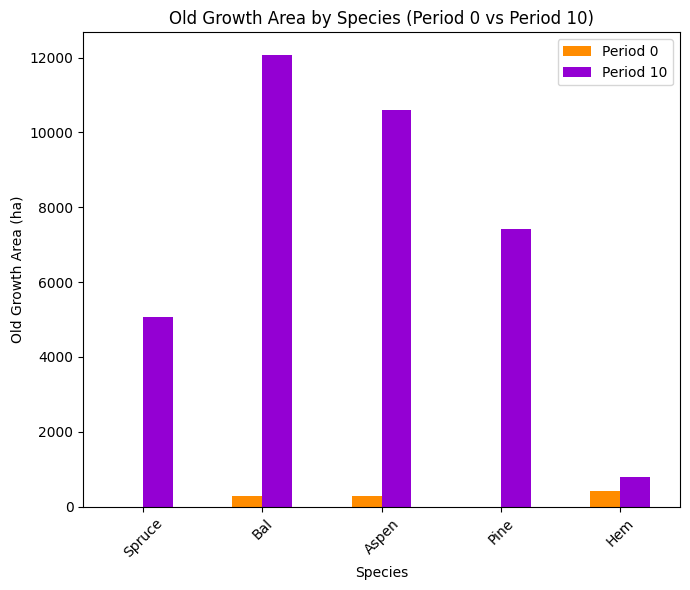

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_60%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8826

Diversity has **decreased** by 6.29% from time 0 to time 10.


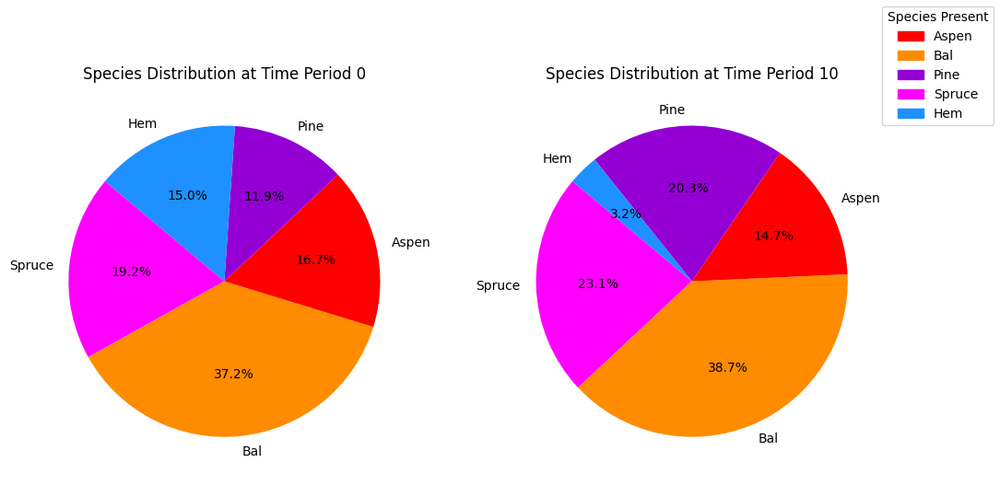

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_60%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.12s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

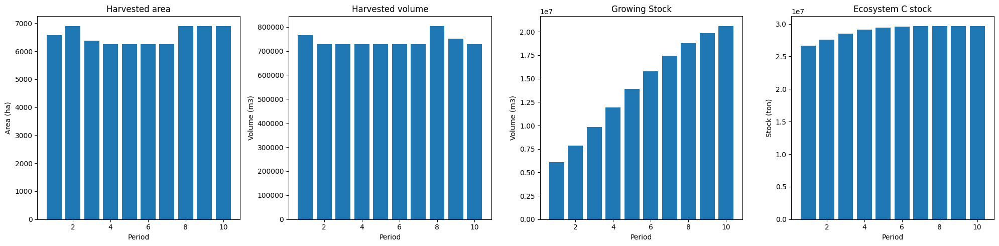

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


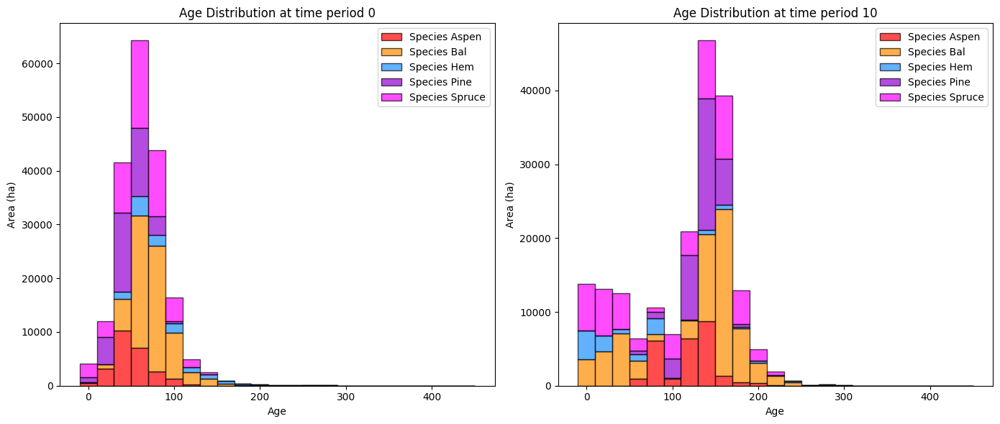

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


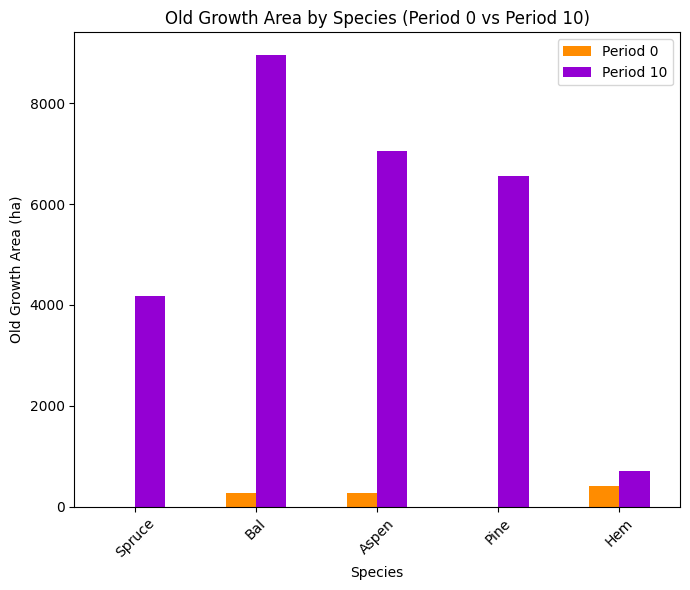

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


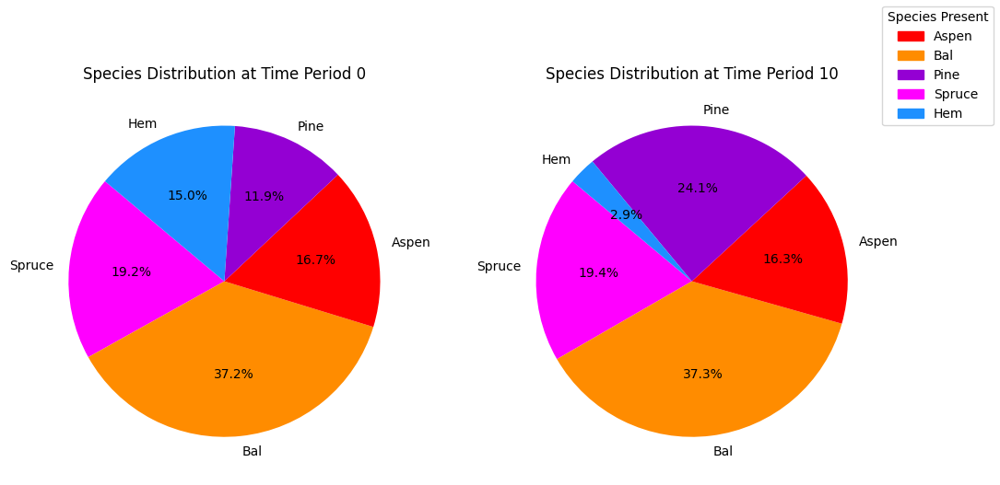

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


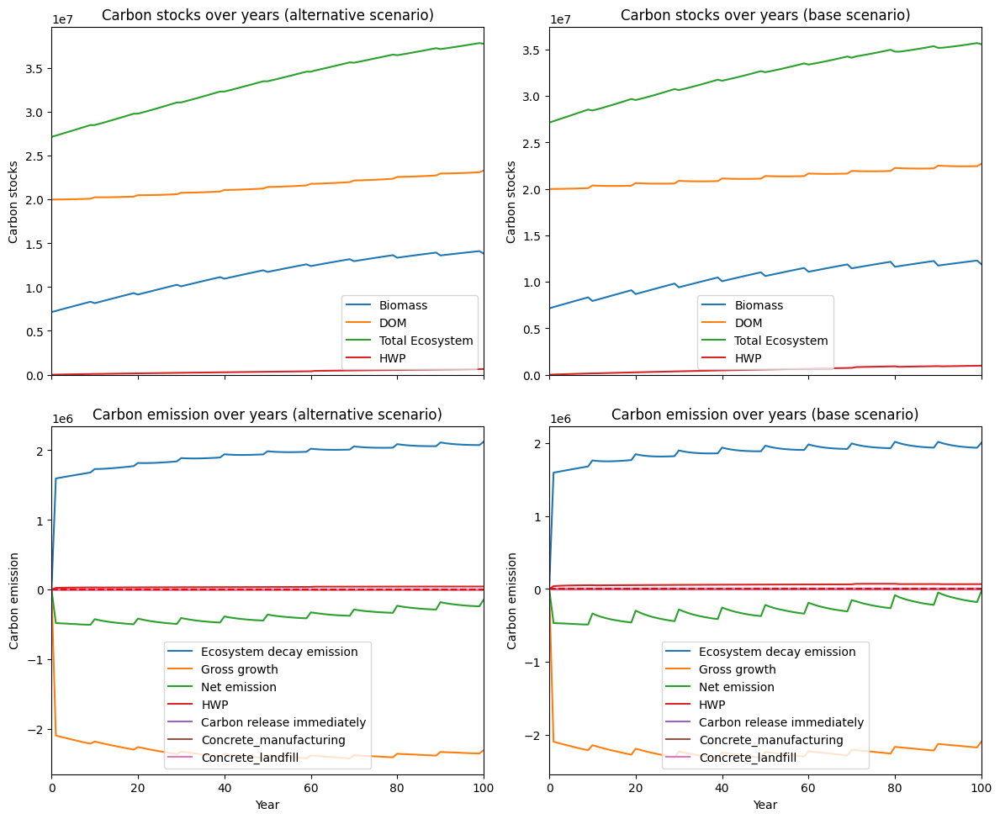

---------------------------------------------------------------------------------------
Net emission difference -1199474.3475973336
Net emission base scenario -11345348.419135116
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  8.336985296960284
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0   894.411040   894.411040
Bal     0.0  3114.125155  3114.125155
Aspen   0.0  3543.890171  3543.890171
Pine    0.0   841.768139   841.768139
Hem     0.0    80.019117    80.019117

Overall, the old growth area has **increased** by 8474.21 hectares in the alternative scenario compared to the base scenario.


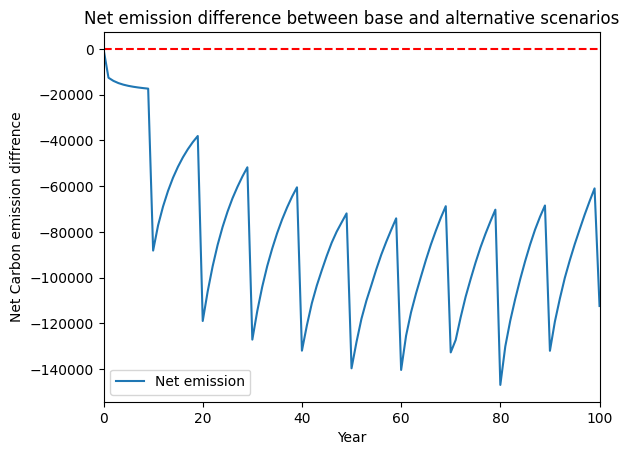

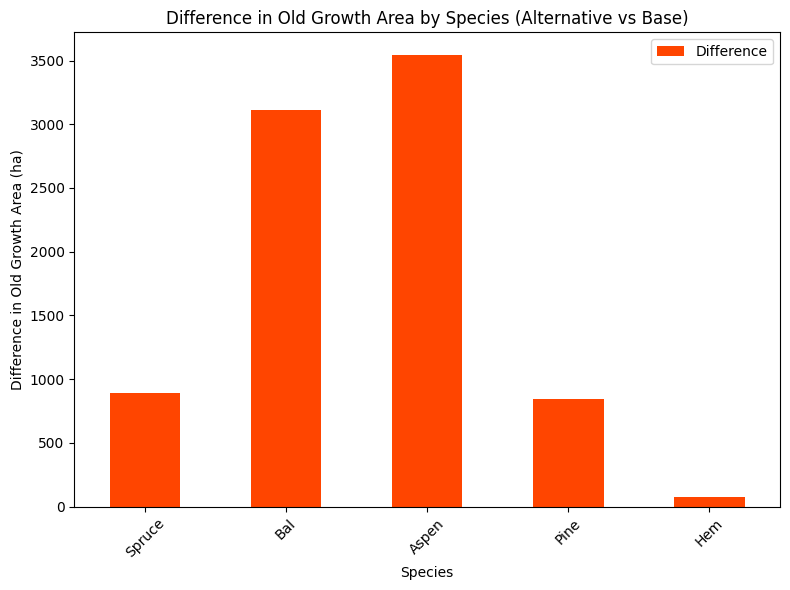

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


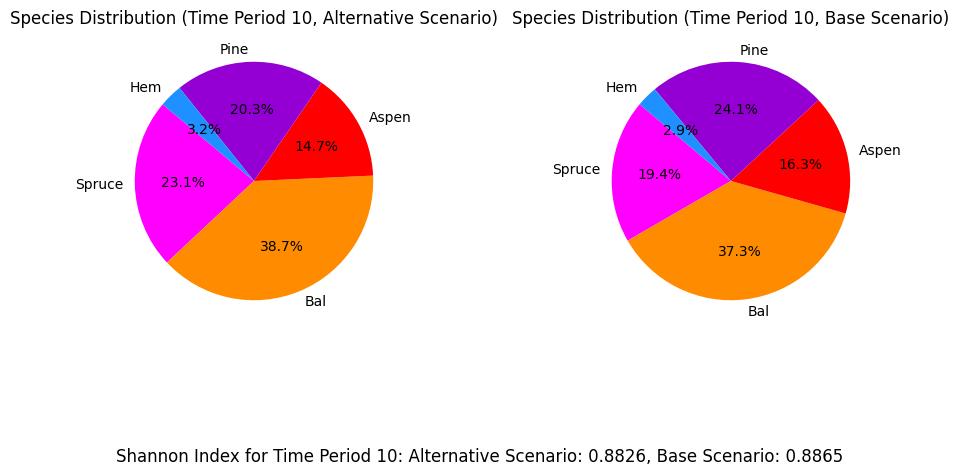

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_50%...
running the scenario for the Golden Bear mining site (50%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfa0c725d
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.14s
Presolved: 1911 rows, 34100 

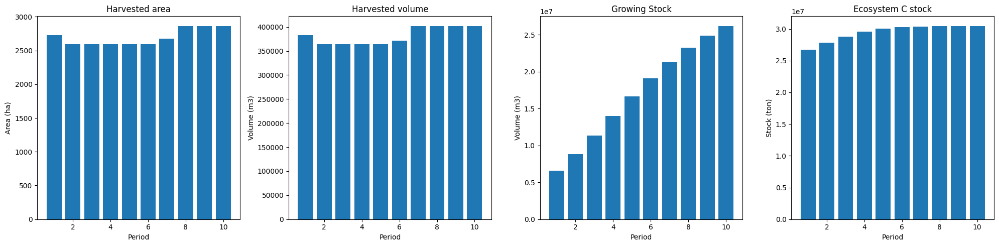

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_50%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  4037
The economic indicator (the provincial government revenues) is:  137671
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


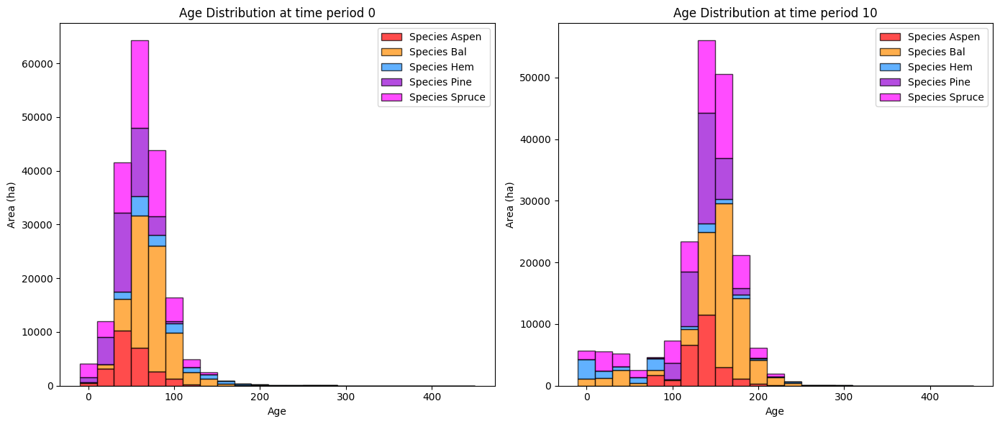

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_50%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   5506.001314   5503.292780
Bal     278.565372  12737.634905  12459.069533
Aspen   273.490478  11528.582901  11255.092423
Pine      0.000000   7479.539415   7479.539415
Hem     419.699331    830.482584    410.783253

Overall diversity has **increased** by 37107.78 hectares from time period 0 to time period 10.


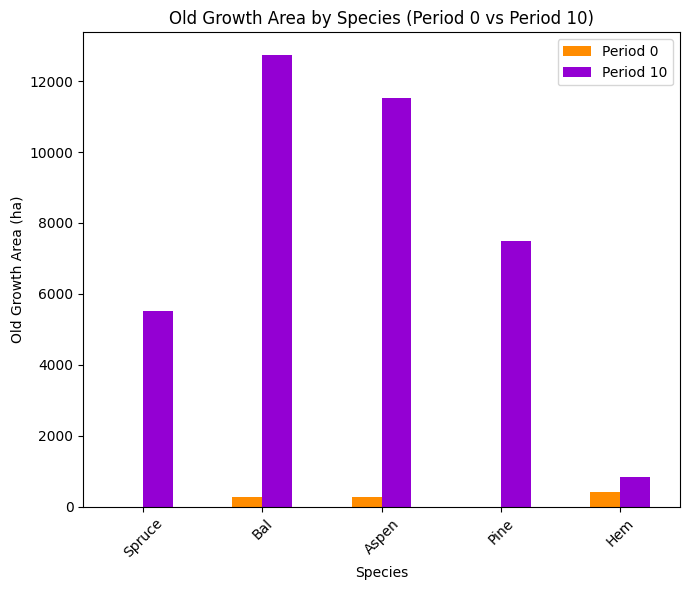

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_50%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8902

Diversity has **decreased** by 5.53% from time 0 to time 10.


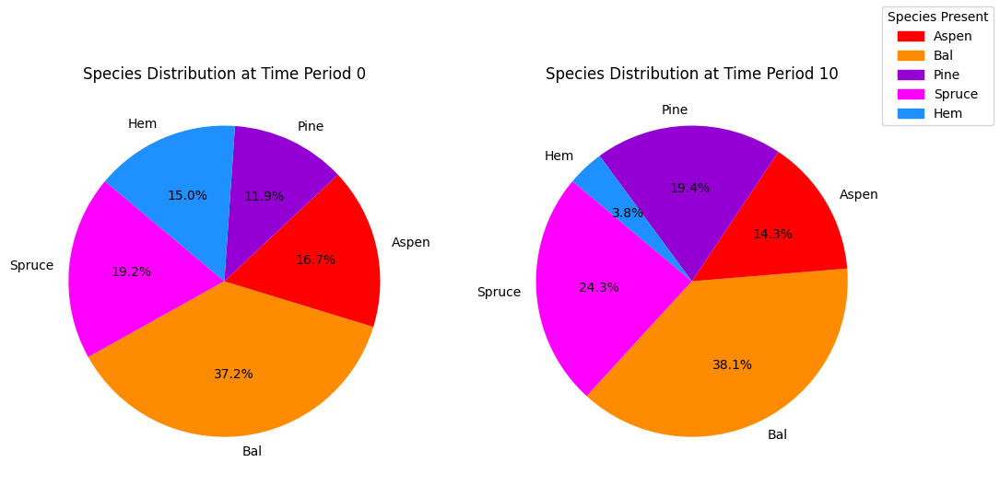

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_50%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.17s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

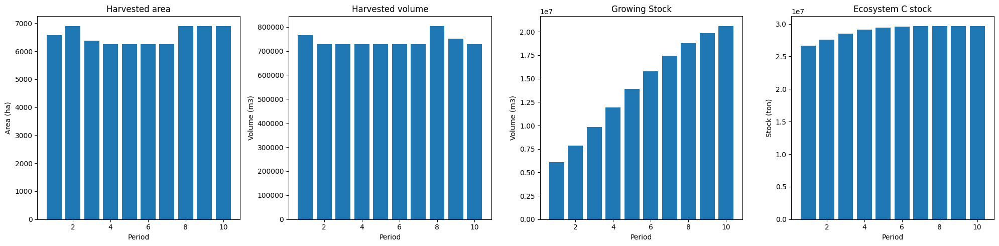

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


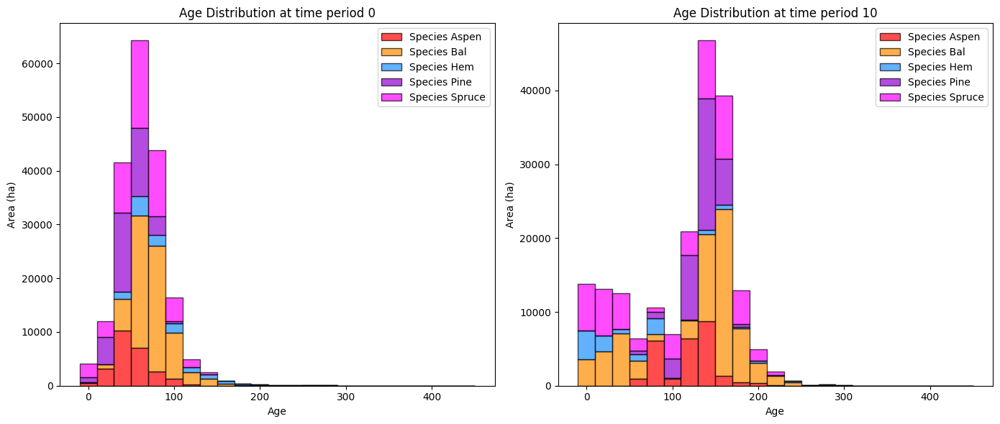

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


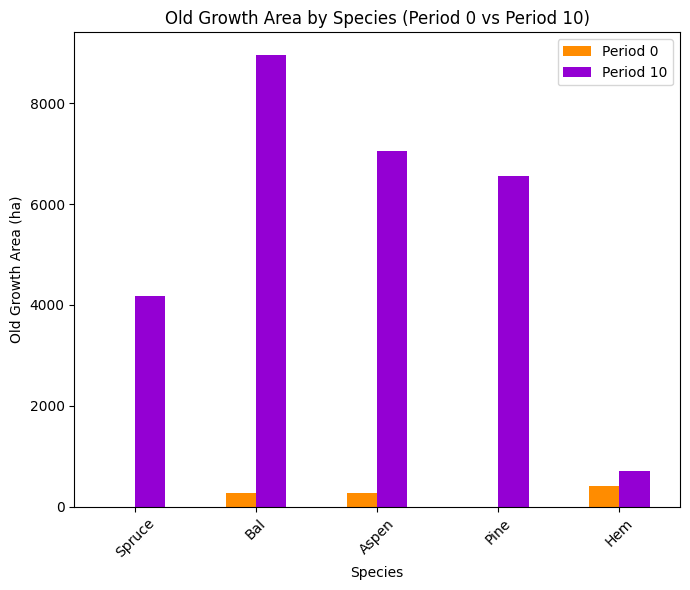

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


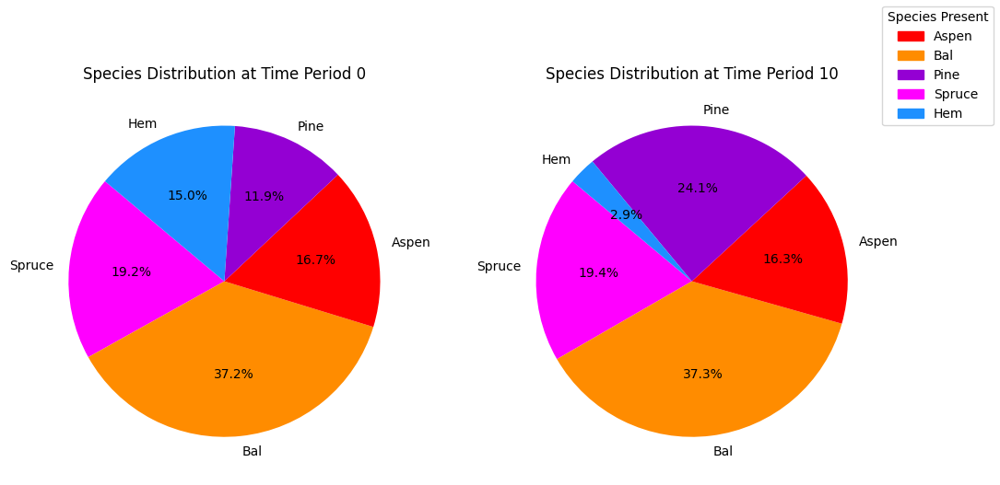

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


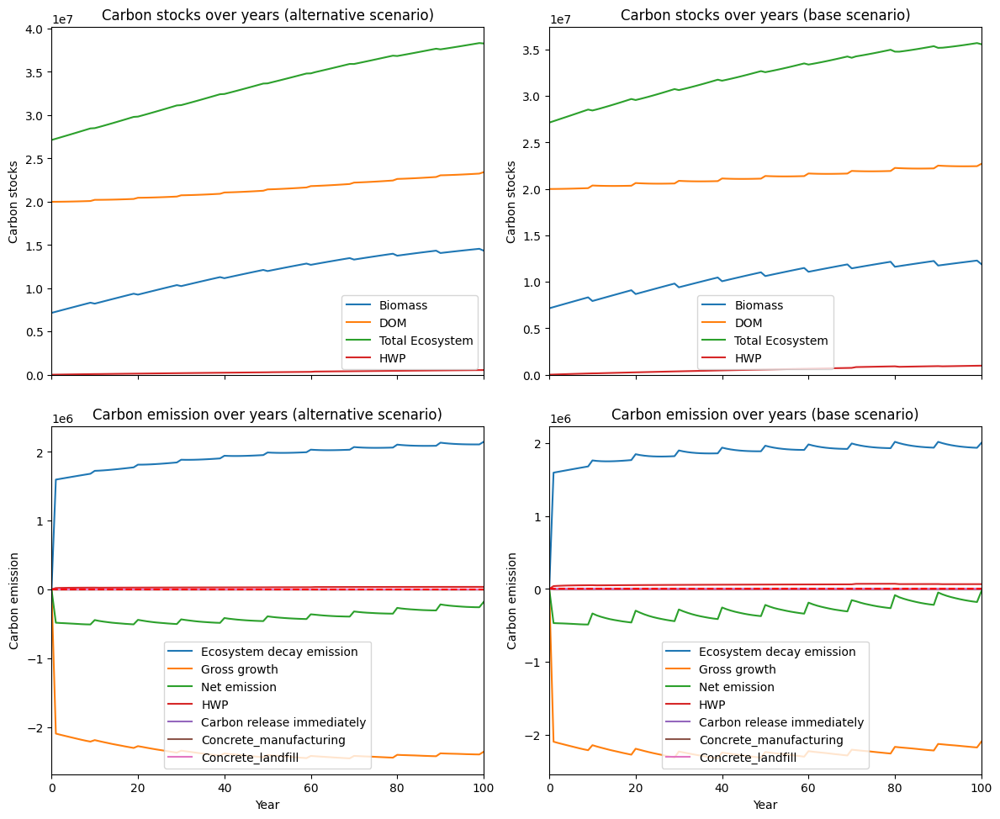

---------------------------------------------------------------------------------------
Net emission difference -1479957.3618014986
Net emission base scenario -11625831.433339281
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  6.756951421781072
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  1335.021551  1335.021551
Bal     0.0  3782.082407  3782.082407
Aspen   0.0  4486.885892  4486.885892
Pine    0.0   915.275634   915.275634
Hem     0.0   119.579171   119.579171

Overall, the old growth area has **increased** by 10638.84 hectares in the alternative scenario compared to the base scenario.


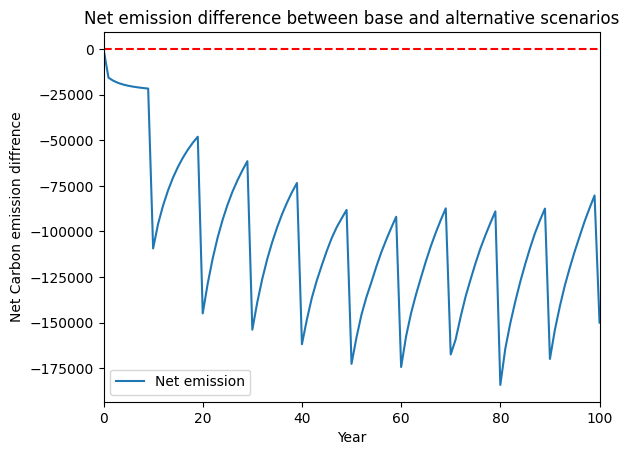

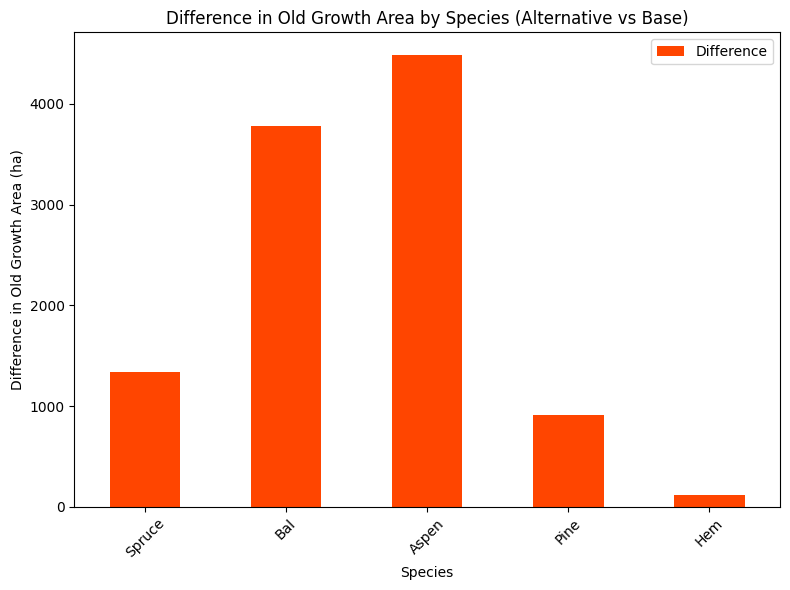

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


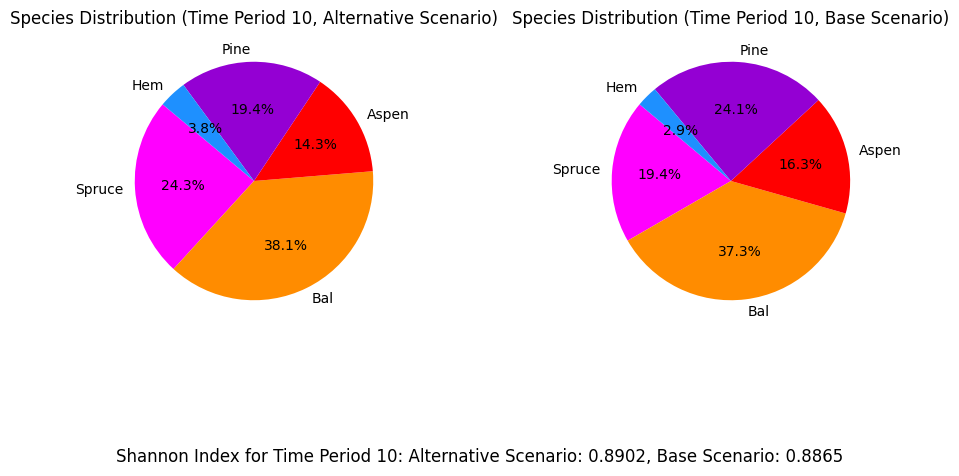

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_40%...
running the scenario for the Golden Bear mining site (40%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0x456535ab
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1911 rows, 34100 

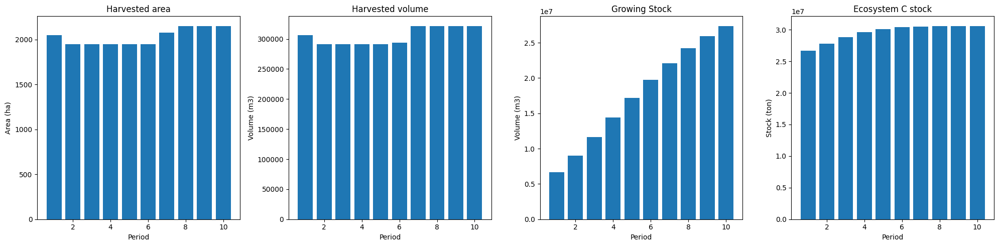

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_40%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  3226
The economic indicator (the provincial government revenues) is:  110022
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


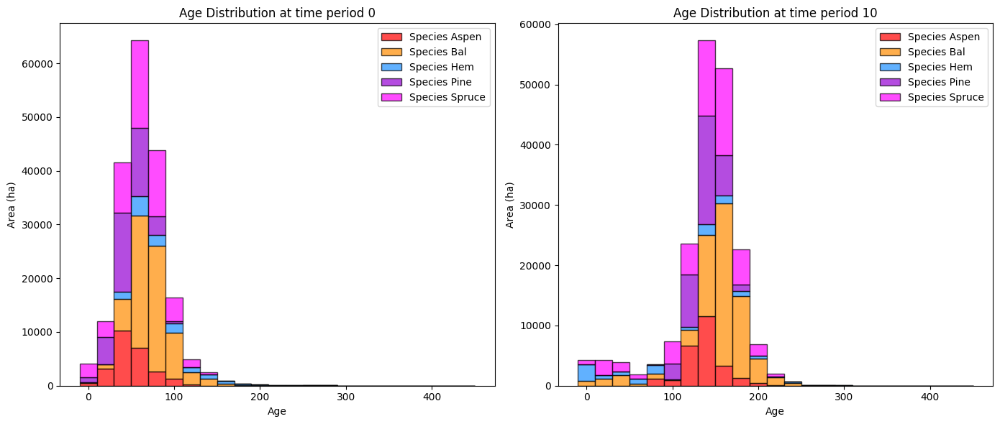

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_40%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   5972.298014   5969.589480
Bal     278.565372  13317.198662  13038.633290
Aspen   273.490478  11997.125161  11723.634683
Pine      0.000000   7559.402805   7559.402805
Hem     419.699331   1004.965809    585.266478

Overall diversity has **increased** by 38876.53 hectares from time period 0 to time period 10.


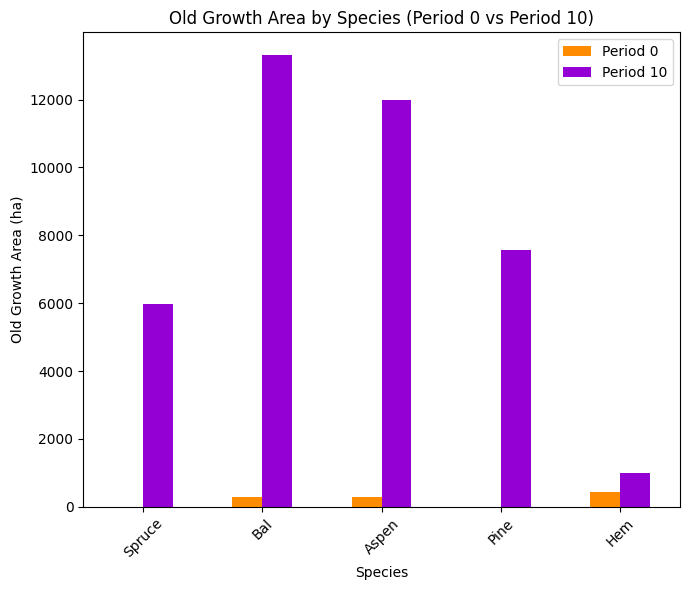

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_40%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.9007

Diversity has **decreased** by 4.48% from time 0 to time 10.


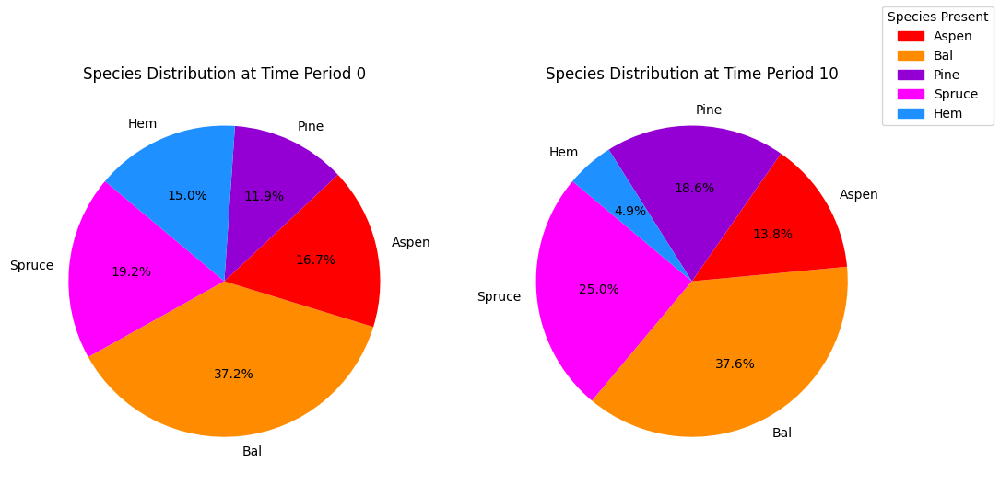

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_40%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

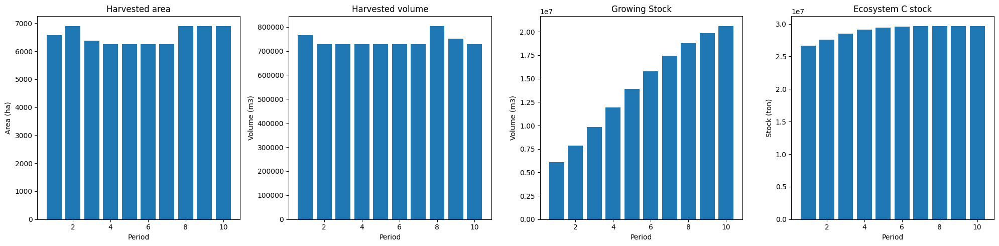

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


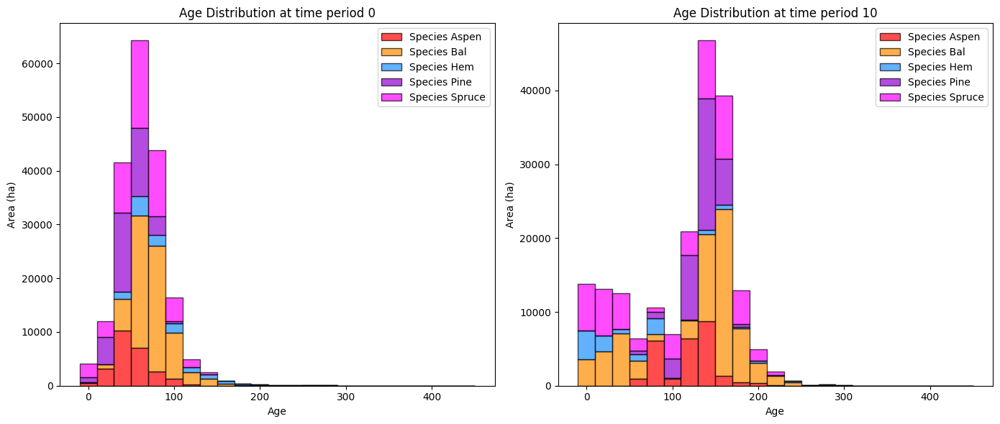

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


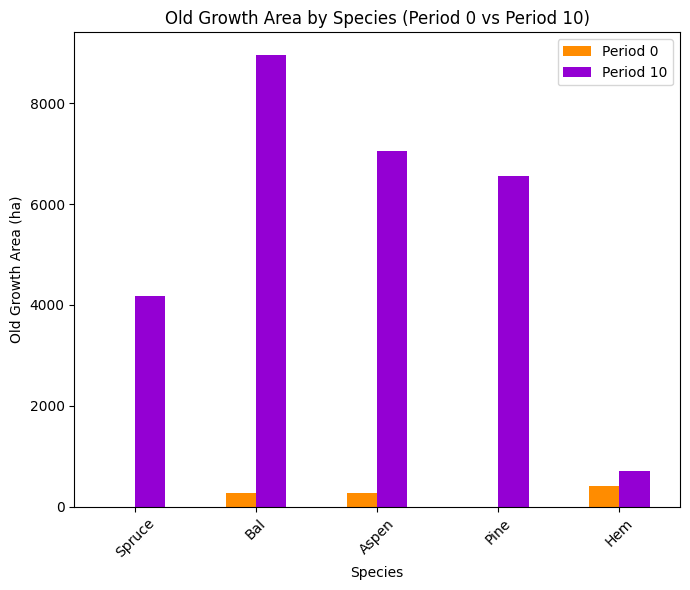

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


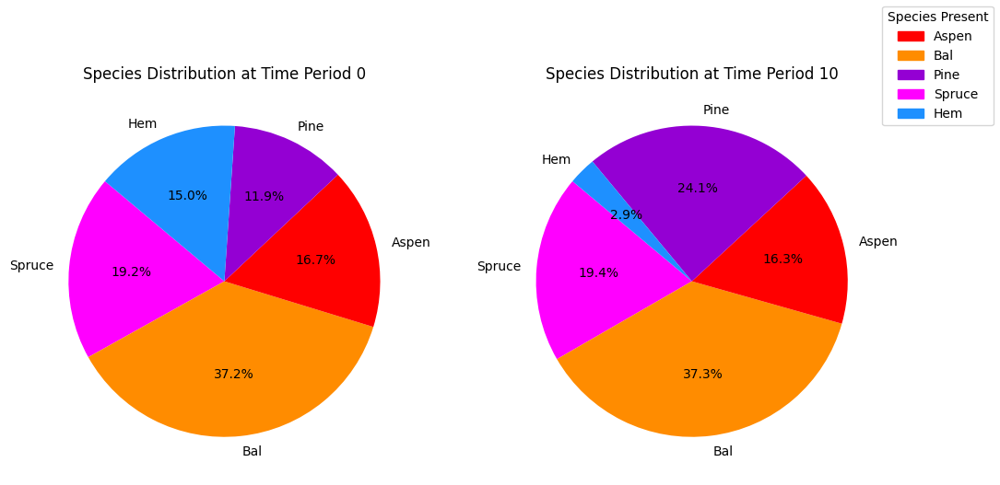

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


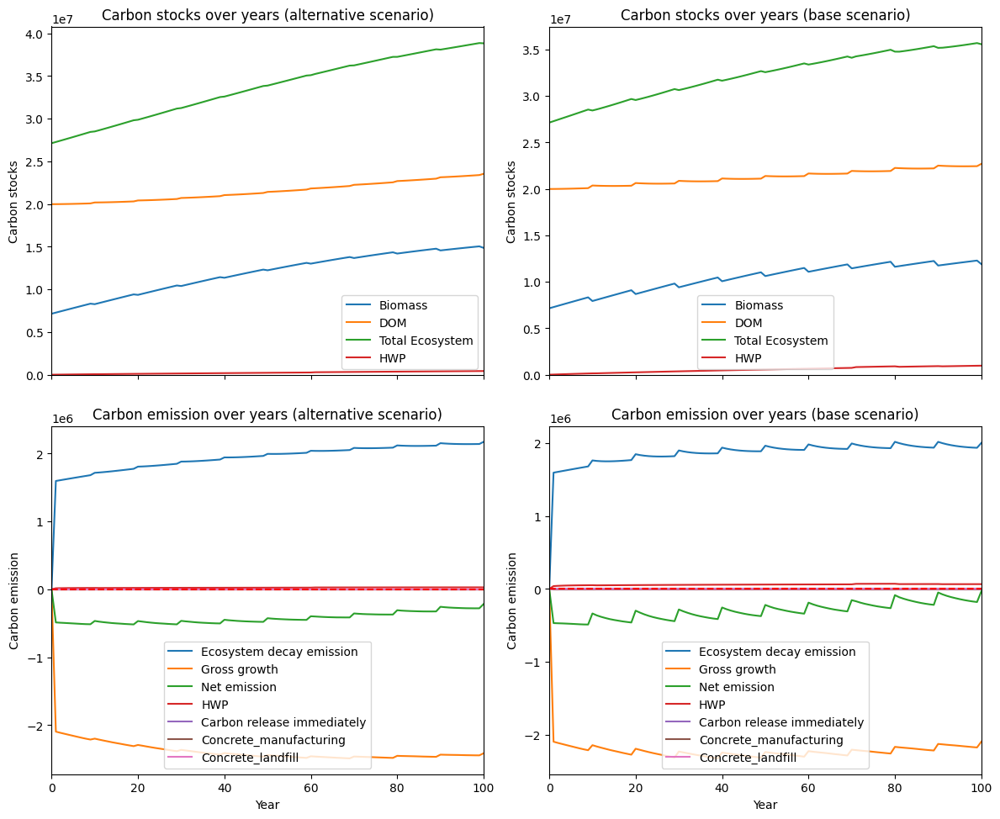

---------------------------------------------------------------------------------------
Net emission difference -1748478.231554159
Net emission base scenario -11894352.303091941
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  5.719259078857025
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  1801.318251  1801.318251
Bal     0.0  4361.646164  4361.646164
Aspen   0.0  4955.428151  4955.428151
Pine    0.0   995.139024   995.139024
Hem     0.0   294.062395   294.062395

Overall, the old growth area has **increased** by 12407.59 hectares in the alternative scenario compared to the base scenario.


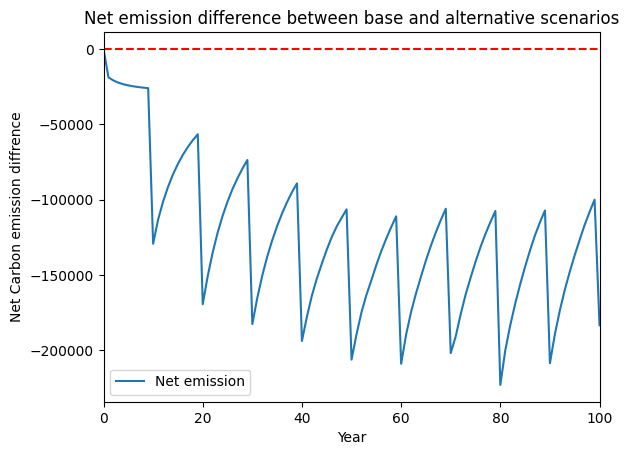

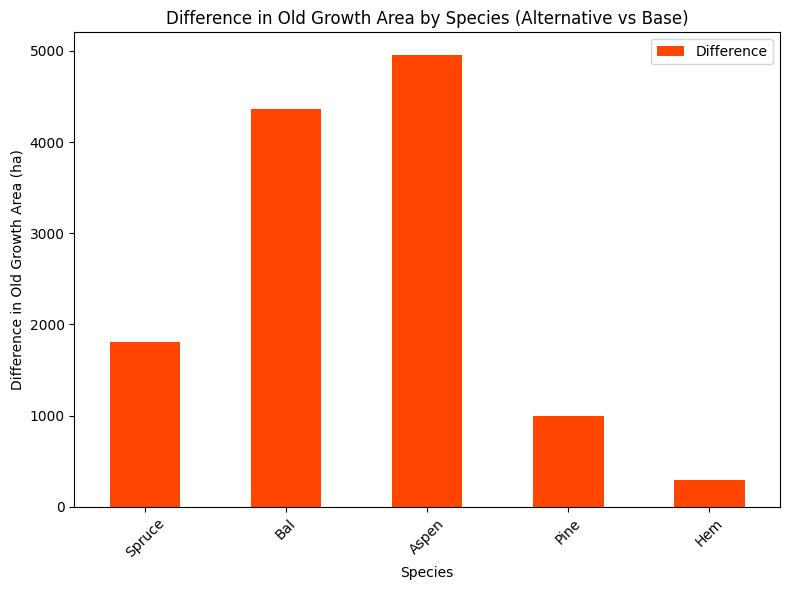

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


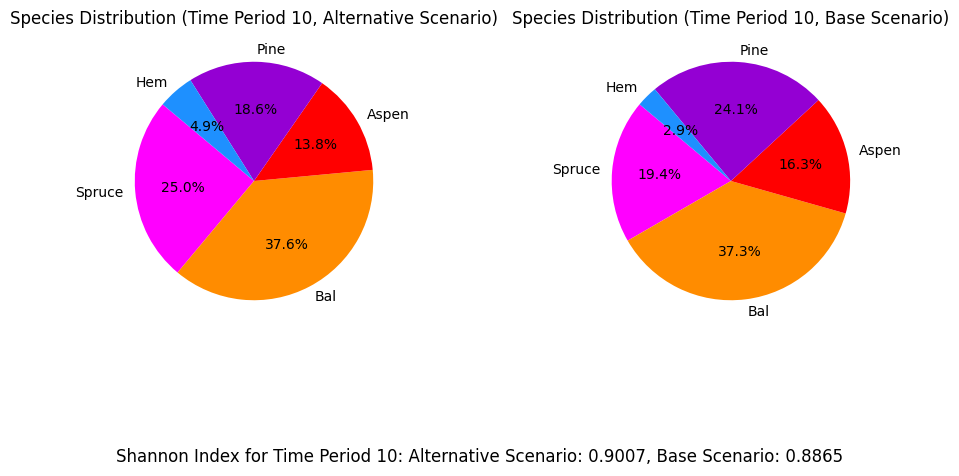

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_30%...
running the scenario for the Golden Bear mining site (30%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0x3014a340
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.14s
Presolved: 1911 rows, 34100 

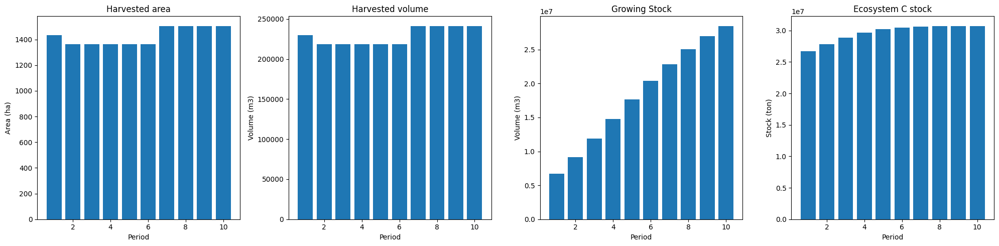

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_30%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  2417
The economic indicator (the provincial government revenues) is:  82442
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


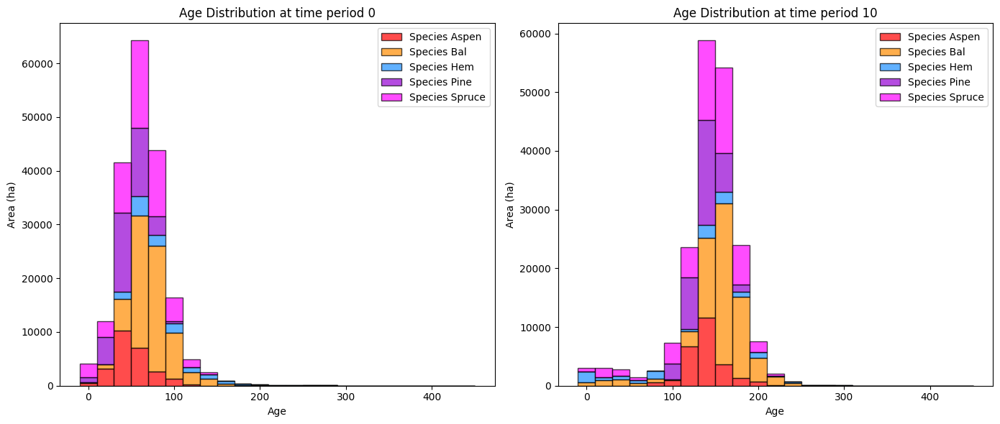

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_30%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   6387.237848   6384.529314
Bal     278.565372  13723.682465  13445.117093
Aspen   273.490478  12602.070884  12328.580406
Pine      0.000000   7631.887200   7631.887200
Hem     419.699331   1275.211146    855.511815

Overall diversity has **increased** by 40645.63 hectares from time period 0 to time period 10.


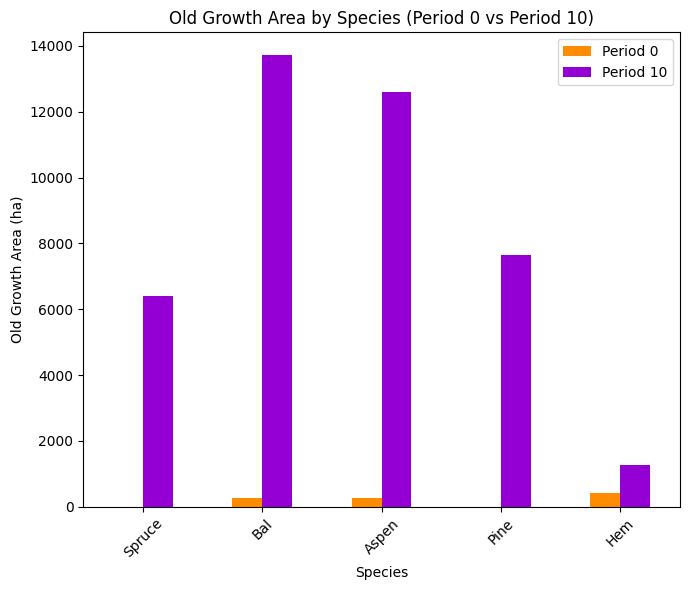

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_30%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.9101

Diversity has **decreased** by 3.54% from time 0 to time 10.


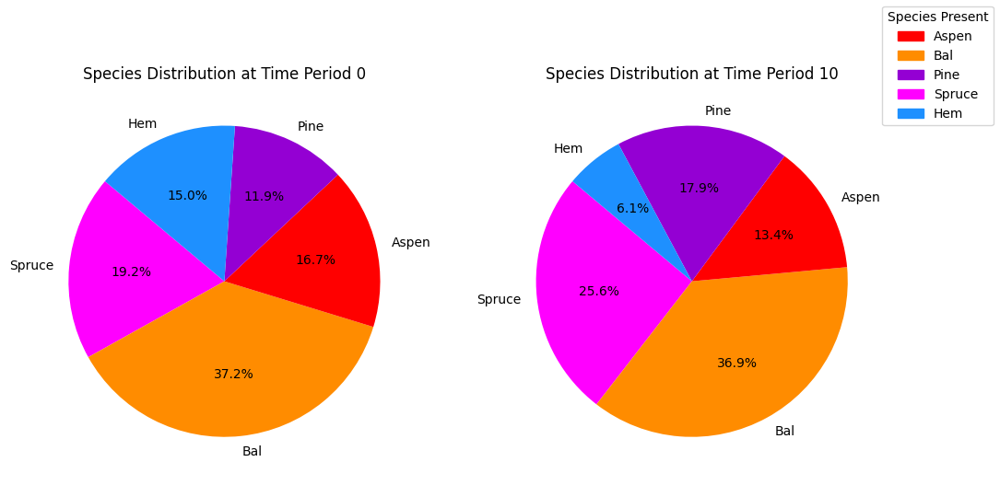

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_30%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

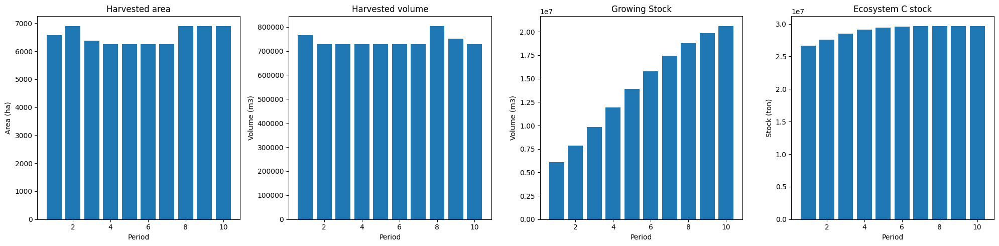

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


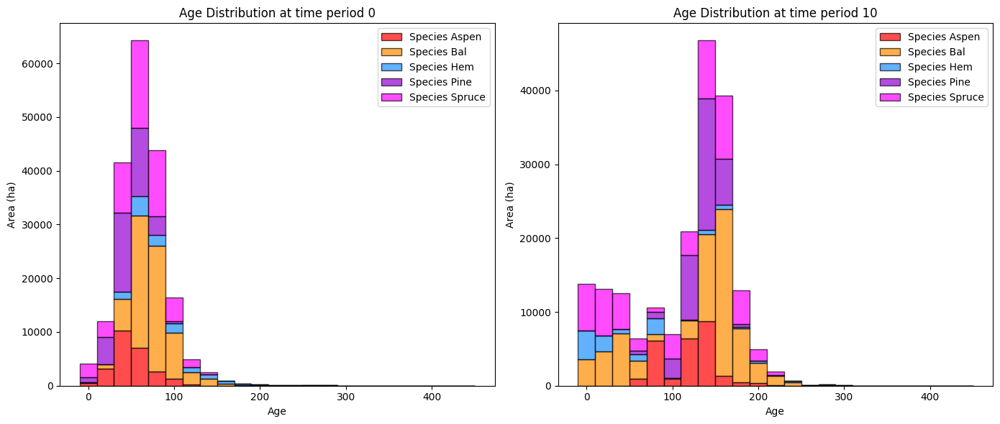

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


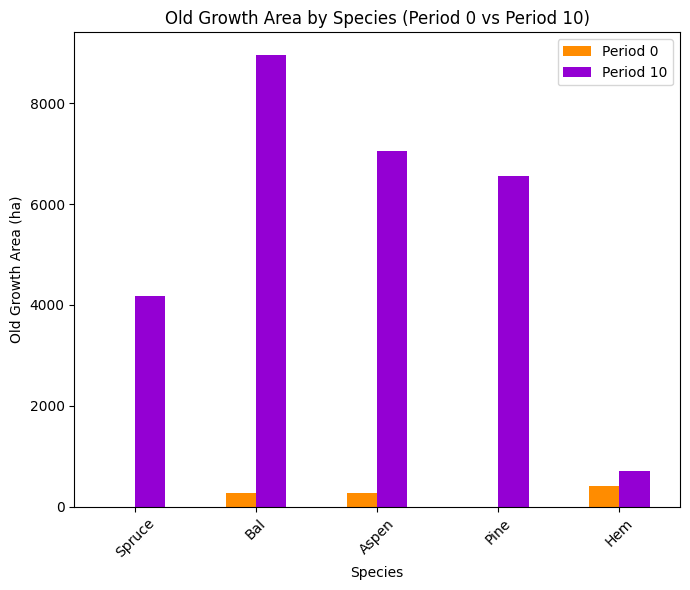

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


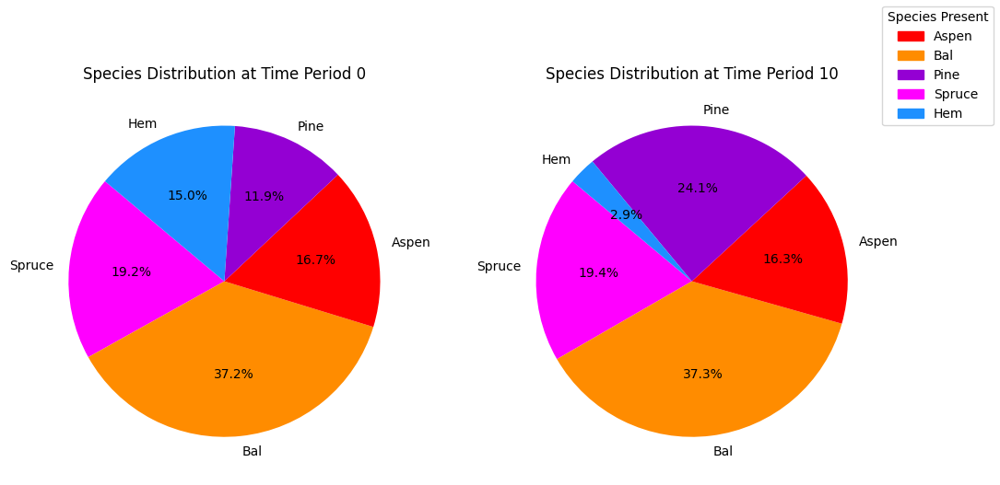

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


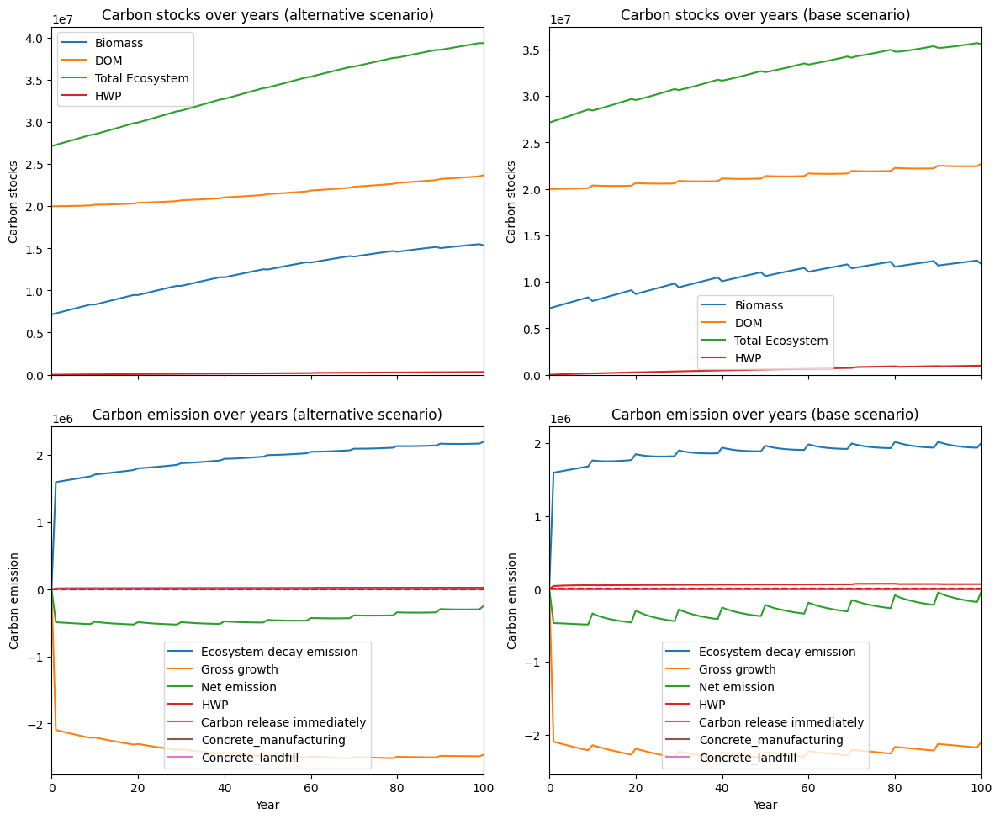

---------------------------------------------------------------------------------------
Net emission difference -2000025.214611558
Net emission base scenario -12145899.286149338
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  4.999936964265816
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  2216.258085  2216.258085
Bal     0.0  4768.129967  4768.129967
Aspen   0.0  5560.373875  5560.373875
Pine    0.0  1067.623420  1067.623420
Hem     0.0   564.307732   564.307732

Overall, the old growth area has **increased** by 14176.69 hectares in the alternative scenario compared to the base scenario.


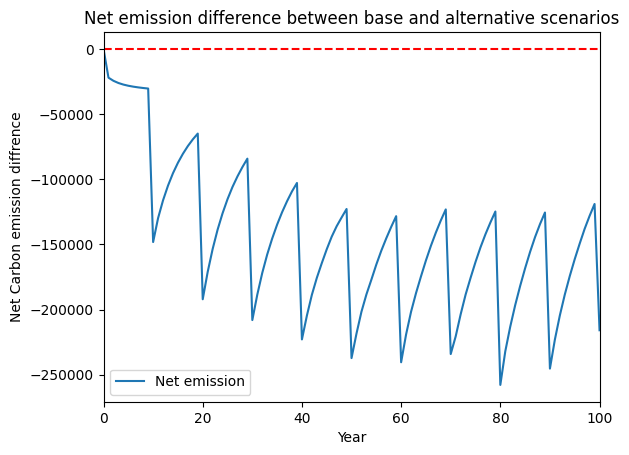

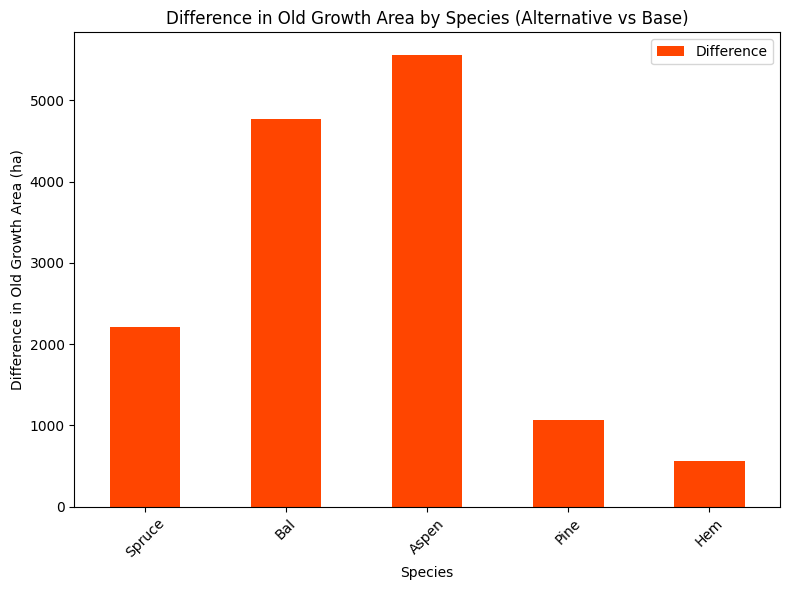

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


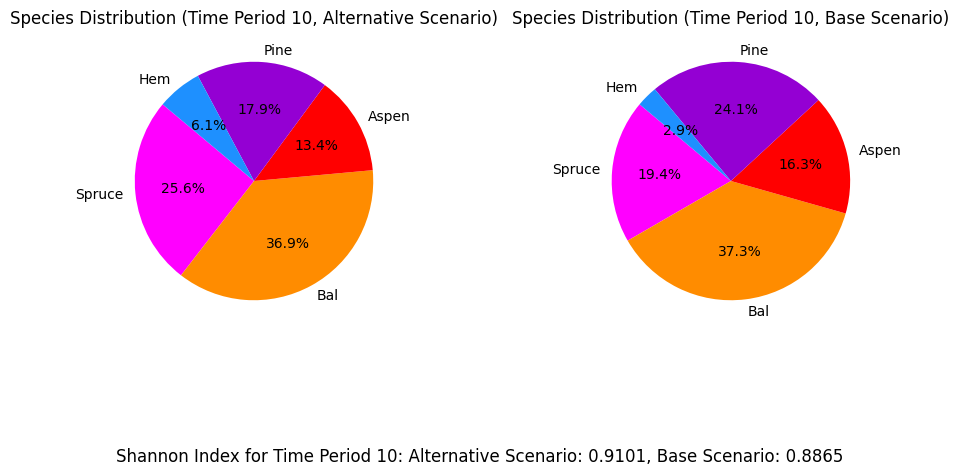

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_20%...
running the scenario for the Golden Bear mining site (20%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xc2b43e96
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.12s
Presolved: 1911 rows, 34100 

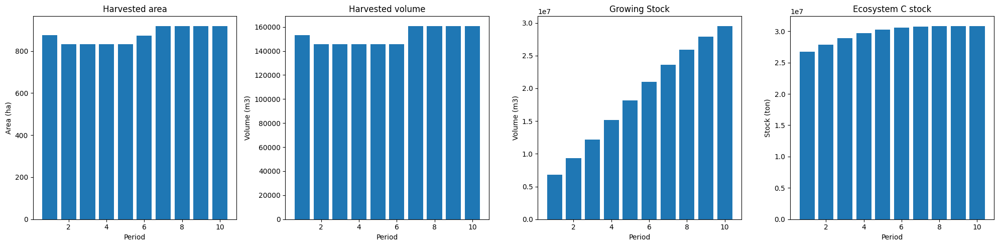

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_20%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  1611
The economic indicator (the provincial government revenues) is:  54961
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


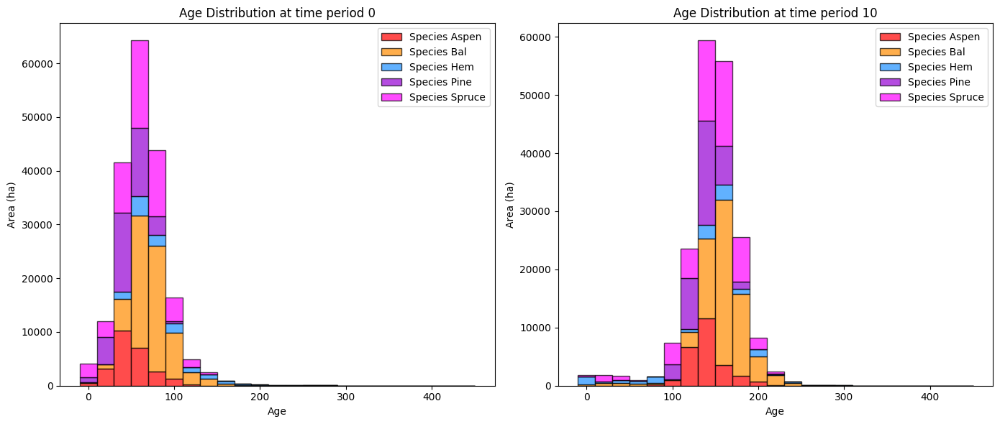

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_20%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   6903.317592   6900.609058
Bal     278.565372  14657.490394  14378.925023
Aspen   273.490478  13027.839047  12754.348569
Pine      0.000000   7631.887200   7631.887200
Hem     419.699331   1548.794344   1129.095013

Overall diversity has **increased** by 42794.86 hectares from time period 0 to time period 10.


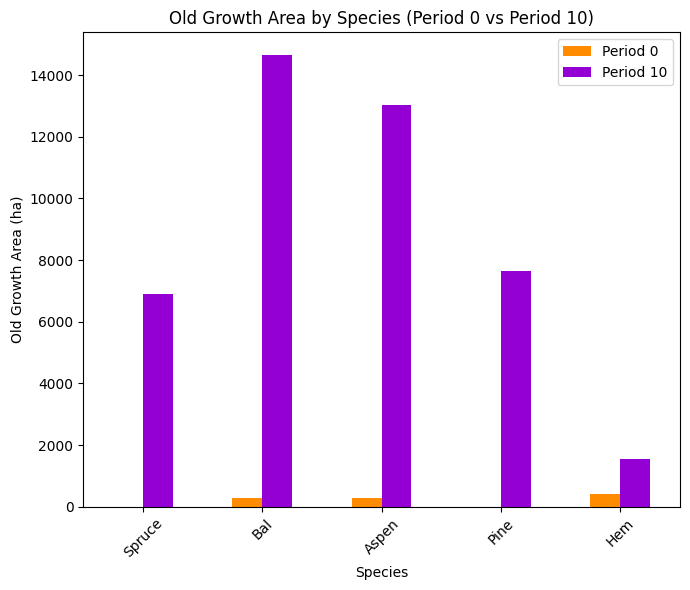

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_20%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.9137

Diversity has **decreased** by 3.18% from time 0 to time 10.


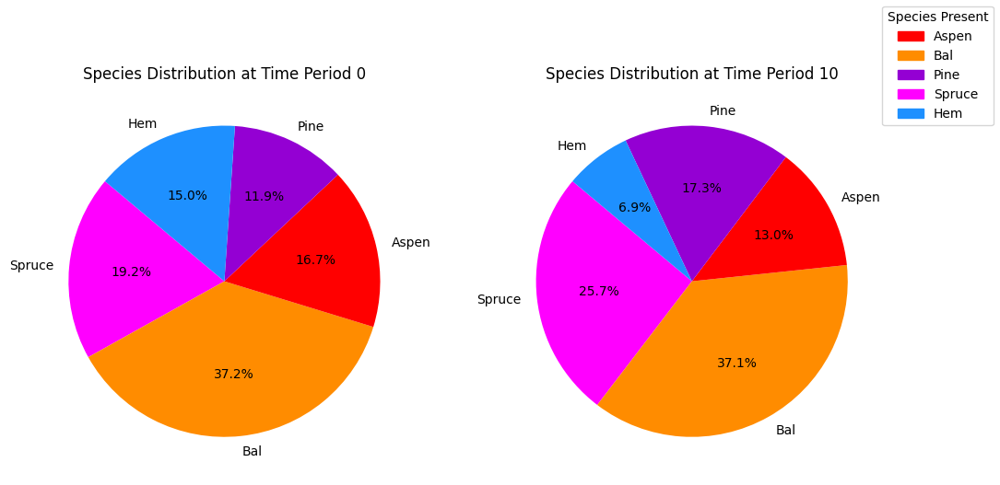

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_20%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

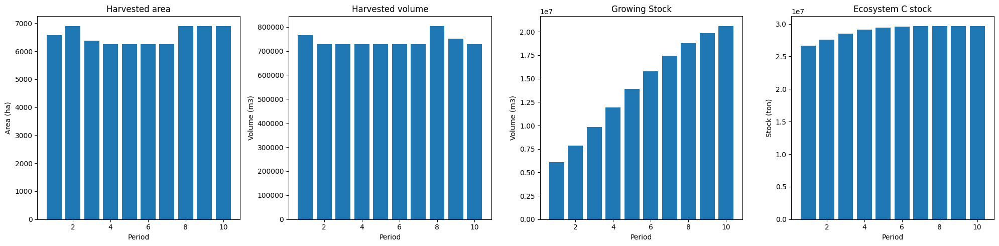

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


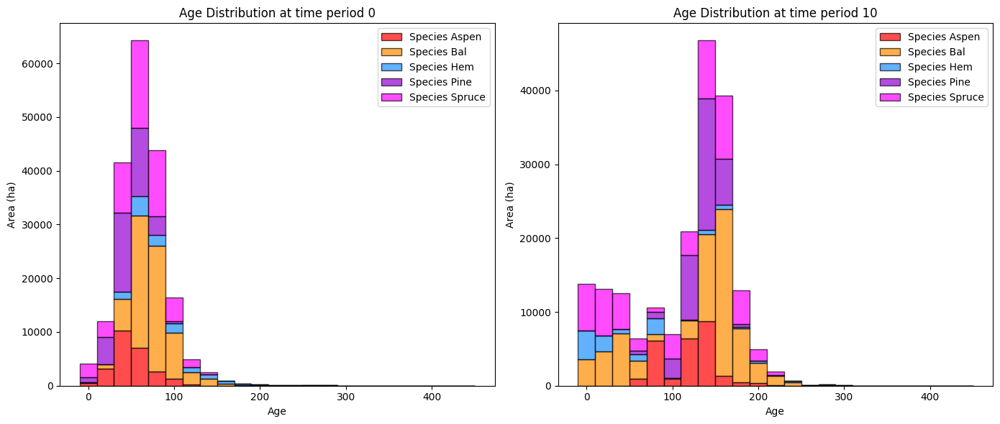

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


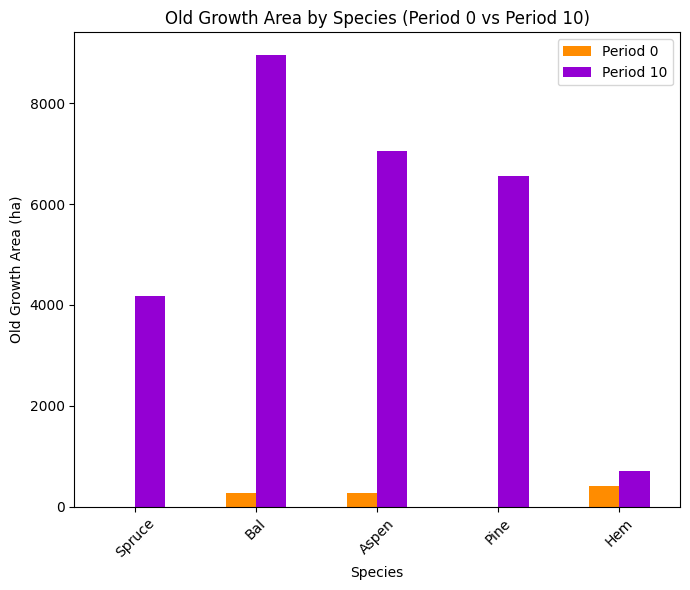

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


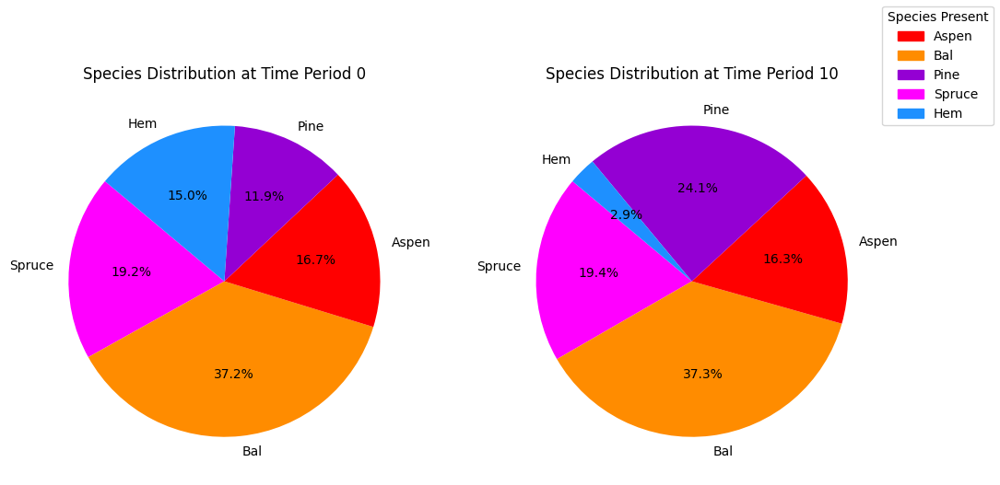

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


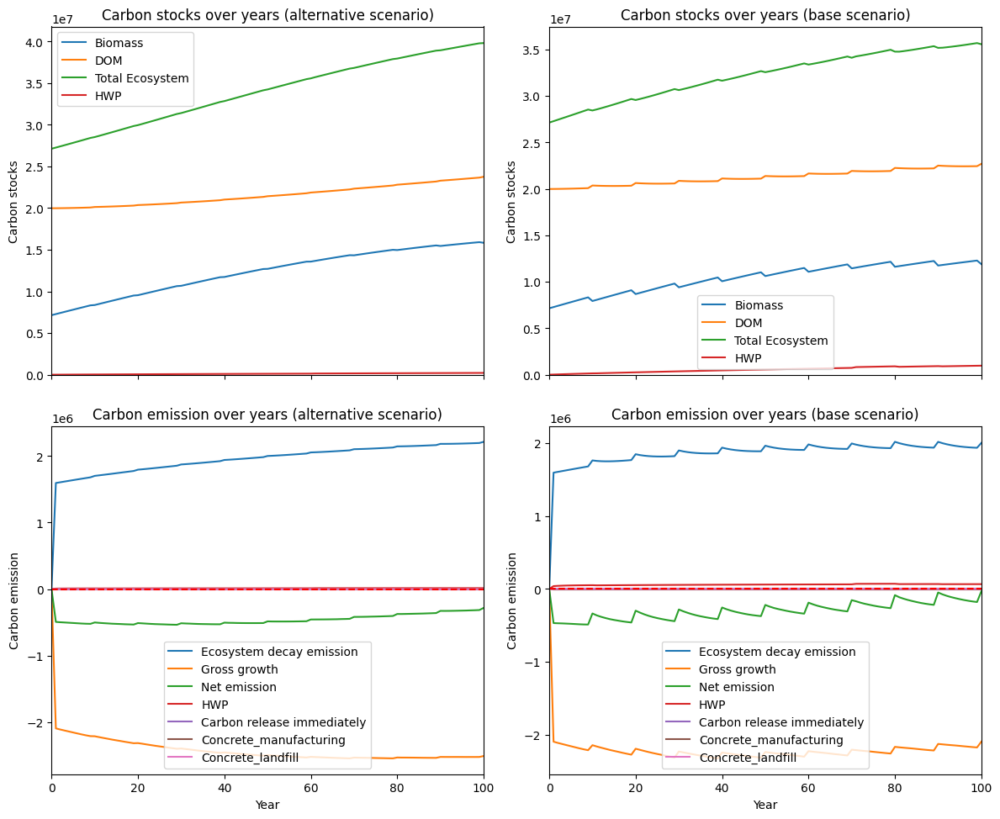

---------------------------------------------------------------------------------------
Net emission difference -2246262.7546977056
Net emission base scenario -12392136.826235488
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  4.45183893962831
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  2732.337829  2732.337829
Bal     0.0  5701.937897  5701.937897
Aspen   0.0  5986.142038  5986.142038
Pine    0.0  1067.623420  1067.623420
Hem     0.0   837.890930   837.890930

Overall, the old growth area has **increased** by 16325.93 hectares in the alternative scenario compared to the base scenario.


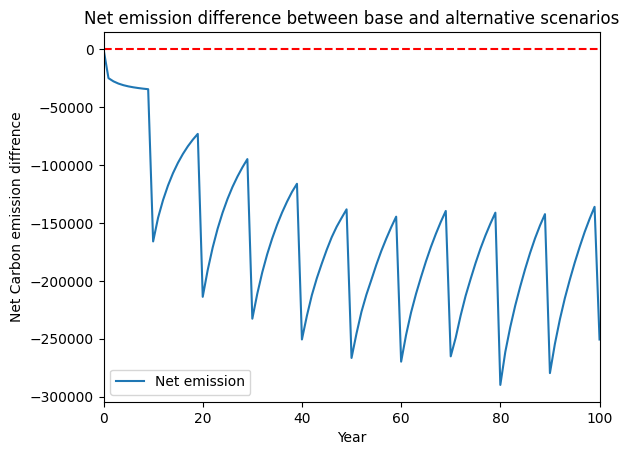

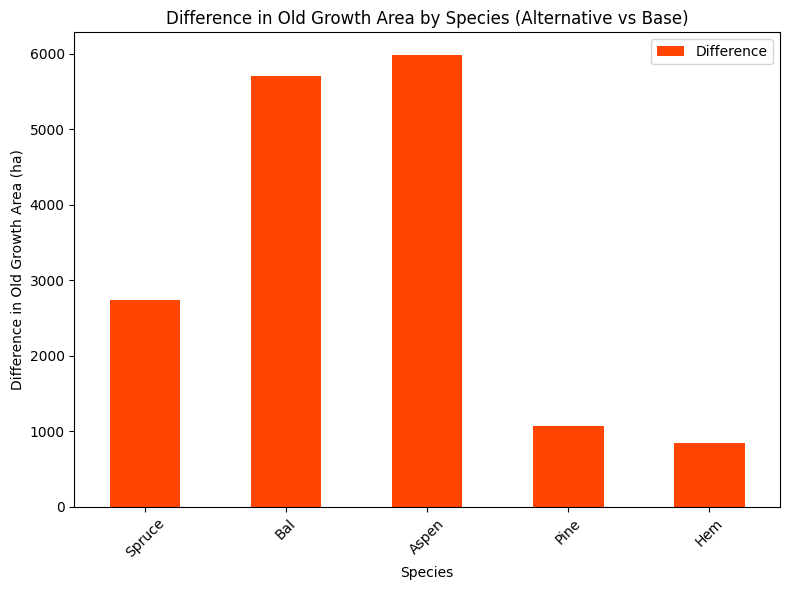

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


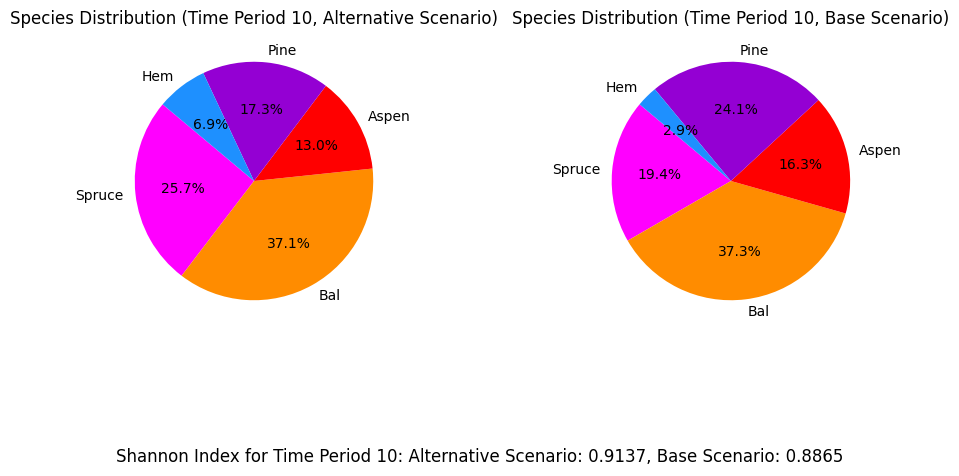

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
Running for goldenbear_max_st_gldbr_AAC_10%...
running the scenario for the Golden Bear mining site (10%_AAC),
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xd8cdd800
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 7e+09]
         Consider reformulating model or setting NumericFocus parameter
         to avoid numerical issues.
Presolve removed 2038 rows and 2031 columns
Presolve time: 0.14s
Presolved: 1911 rows, 34100 

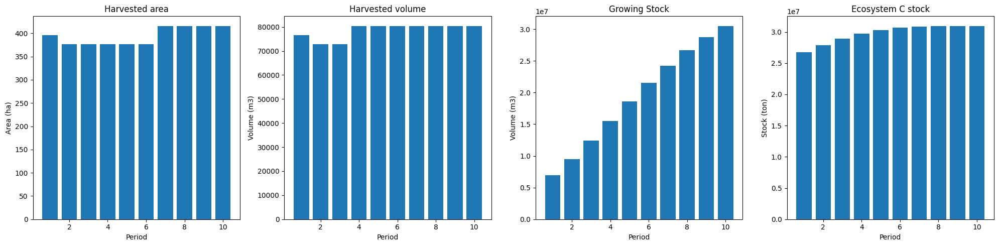

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_10%_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  830
The economic indicator (the provincial government revenues) is:  28309
------------------------------------------------
Saved cbm_output_1 and cbm_output_2 as pickle files.


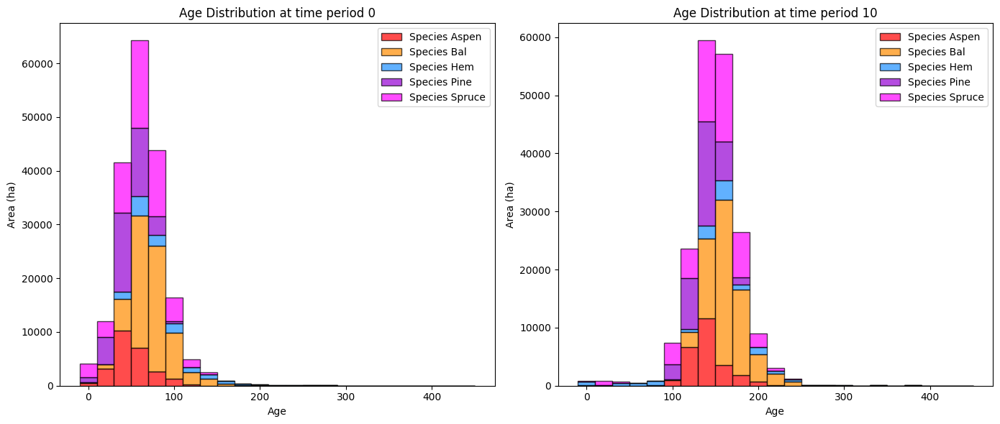

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_10%_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0            10    Difference
Spruce    2.708533   7418.514051   7415.805518
Bal     278.565372  15769.417536  15490.852164
Aspen   273.490478  13191.618272  12918.127794
Pine      0.000000   7631.887200   7631.887200
Hem     419.699331   2209.827259   1790.127928

Overall diversity has **increased** by 45246.80 hectares from time period 0 to time period 10.


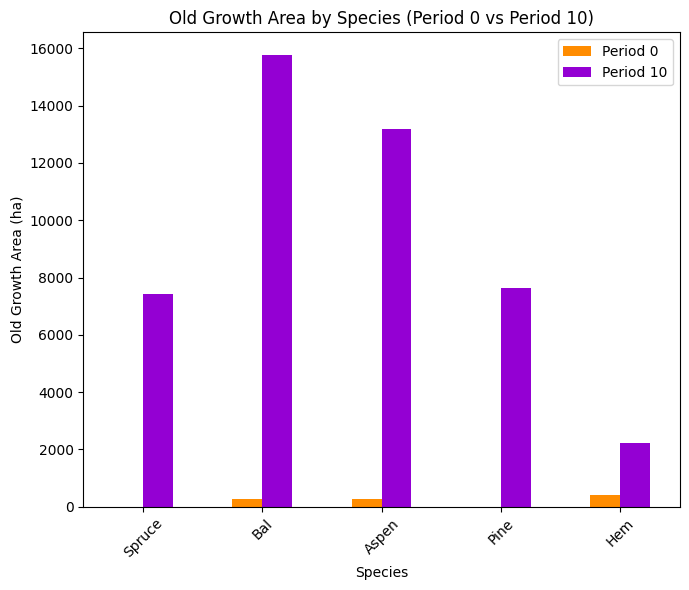

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_10%_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.9183

Diversity has **decreased** by 2.72% from time 0 to time 10.


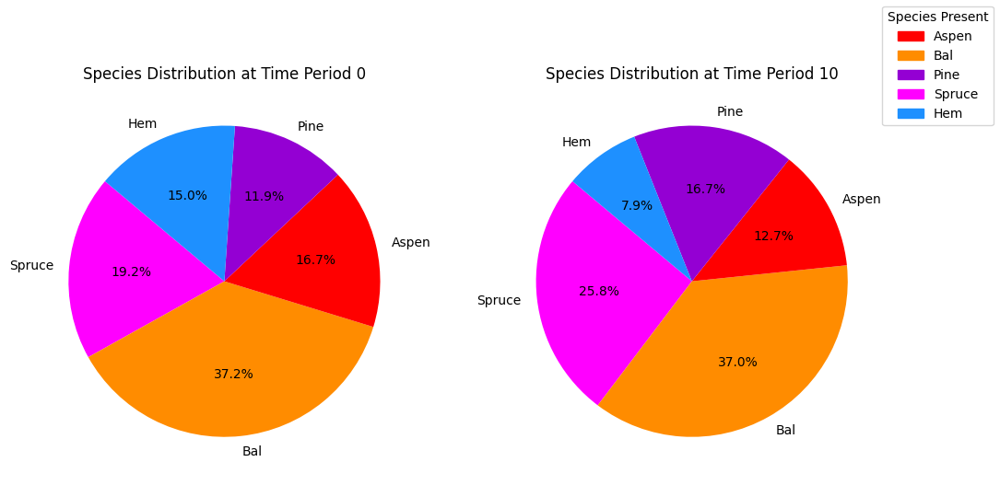

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_gldbr_AAC_10%_species_pie.pdf
running business as usual scenario for the Golden Bear mine site
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (linux64)

CPU model: Intel Core Processor (Broadwell, IBRS), instruction set [SSE2|AVX|AVX2]
Thread count: 16 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 3949 rows, 36130 columns and 470612 nonzeros
Model fingerprint: 0xfb314479
Coefficient statistics:
  Matrix range     [1e-02, 1e+05]
  Objective range  [2e+02, 1e+06]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+00, 4e+07]
Presolve removed 2037 rows and 2031 columns
Presolve time: 0.13s
Presolved: 1912 rows, 34099 columns, 421112 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.876e+04
 Factor NZ  : 9.245e+04 (roughly 15 MB of memory)
 Fact

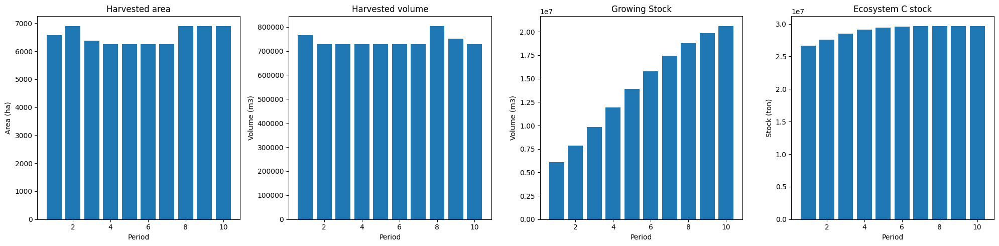

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_scheduling_maxstock.pdf
------------------------------------------------
The scocial indicator (the number of job creation) is:  7839
The economic indicator (the provincial government revenues) is:  267353
------------------------------------------------
Saved cbm_output_3 and cbm_output_4 as pickle files.


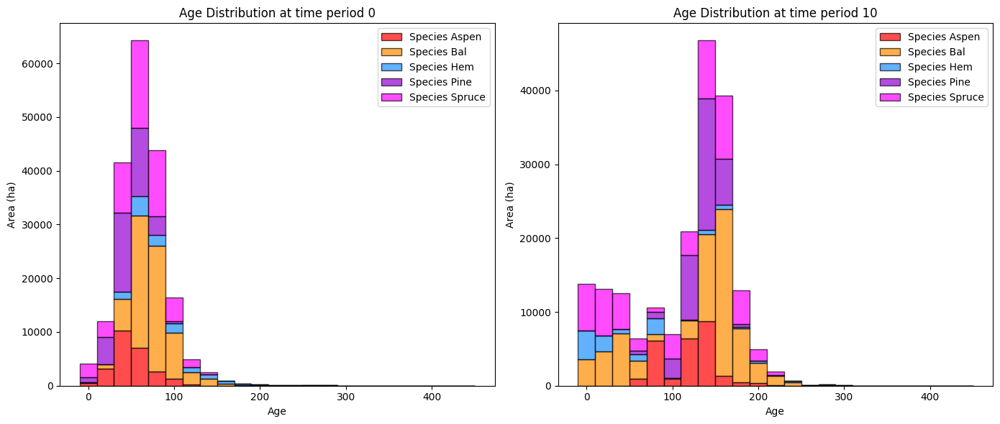

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_age_distribution.pdf

Old Growth Data (in hectares). 
Negative value indicates loss of old growth and positive value indicates gain of old growth.
                 0           10   Difference
Spruce    2.708533  4170.979763  4168.271230
Bal     278.565372  8955.552498  8676.987126
Aspen   273.490478  7041.697009  6768.206531
Pine      0.000000  6564.263781  6564.263781
Hem     419.699331   710.903413   291.204082

Overall diversity has **increased** by 26468.93 hectares from time period 0 to time period 10.


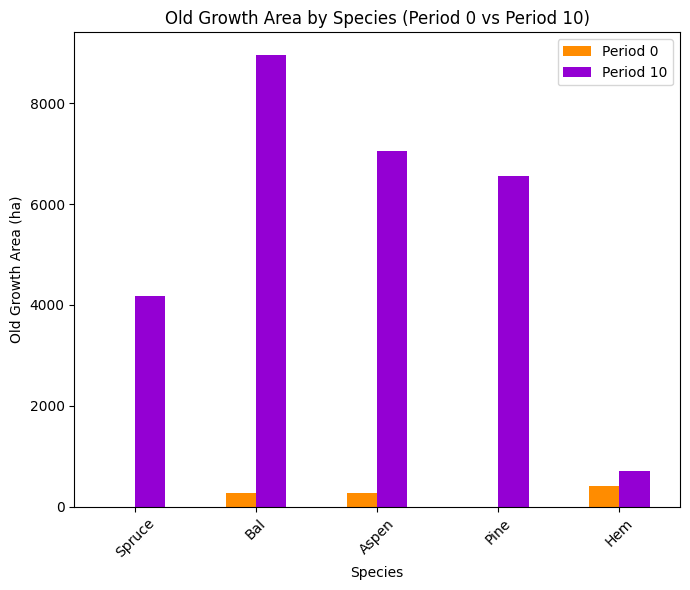

Clustered column plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_old_growth_comparison.pdf

Shannon Evenness Index for time period 0: 0.9455
Shannon Evenness Index for time period 10: 0.8865

Diversity has **decreased** by 5.90% from time 0 to time 10.


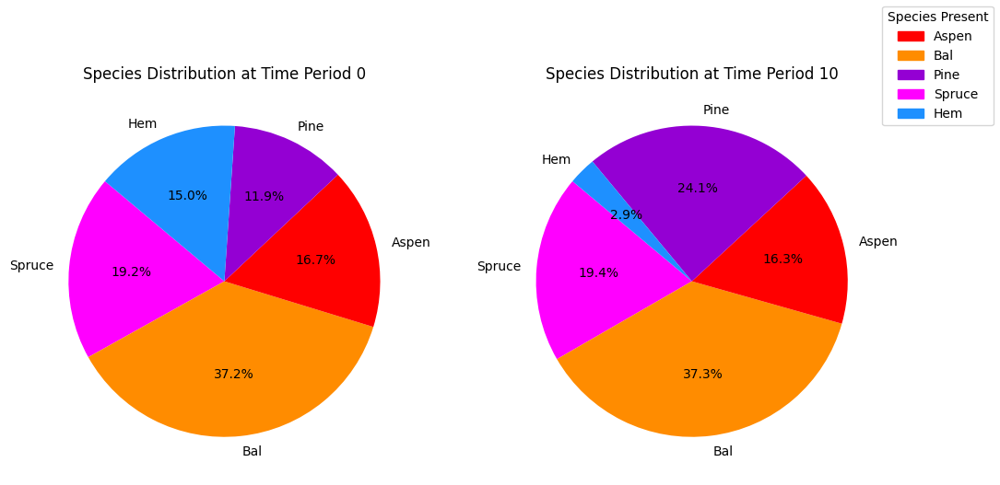

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_bau_gldbr_species_pie.pdf


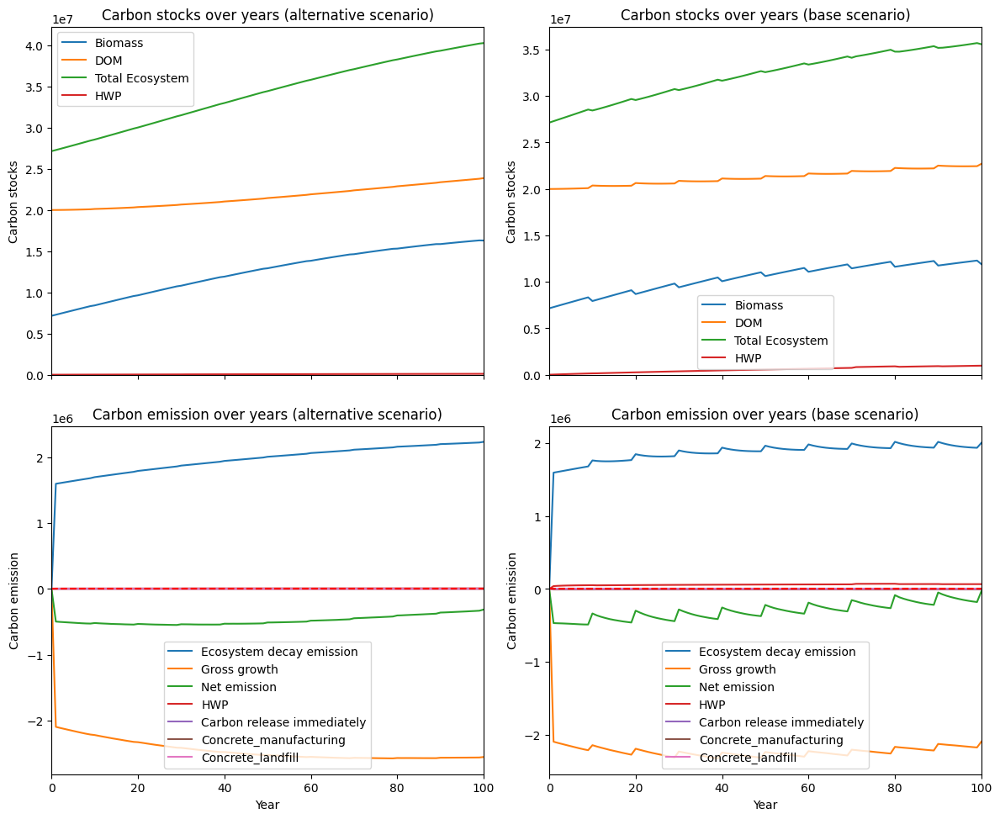

---------------------------------------------------------------------------------------
Net emission difference -2492384.930565298
Net emission base scenario -12638259.00210308
Net emission alternative scenario -10145874.071537782
dollar_per_ton is:  4.012221337629376
Comparison of Old Growth Areas (Alternative - Base)
          0           10   Difference
Spruce  0.0  3247.534288  3247.534288
Bal     0.0  6813.865038  6813.865038
Aspen   0.0  6149.921263  6149.921263
Pine    0.0  1067.623420  1067.623420
Hem     0.0  1498.923846  1498.923846

Overall, the old growth area has **increased** by 18777.87 hectares in the alternative scenario compared to the base scenario.


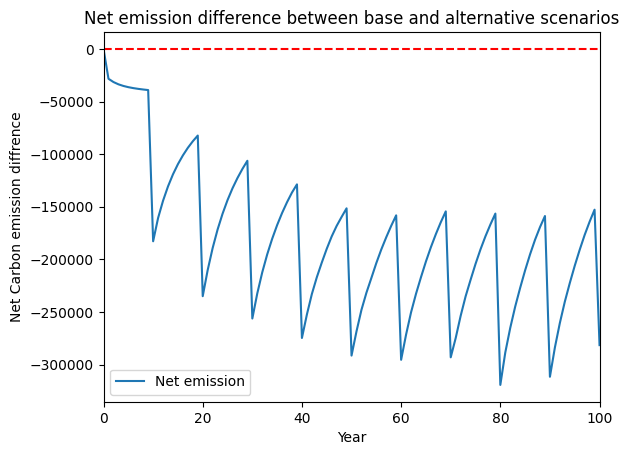

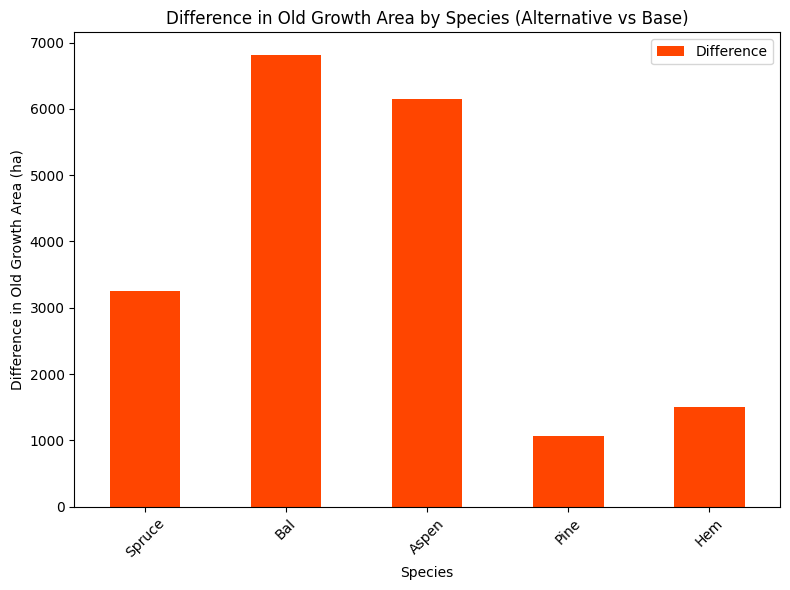

<Figure size 640x480 with 0 Axes>

Plot saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_age_difference.pdf


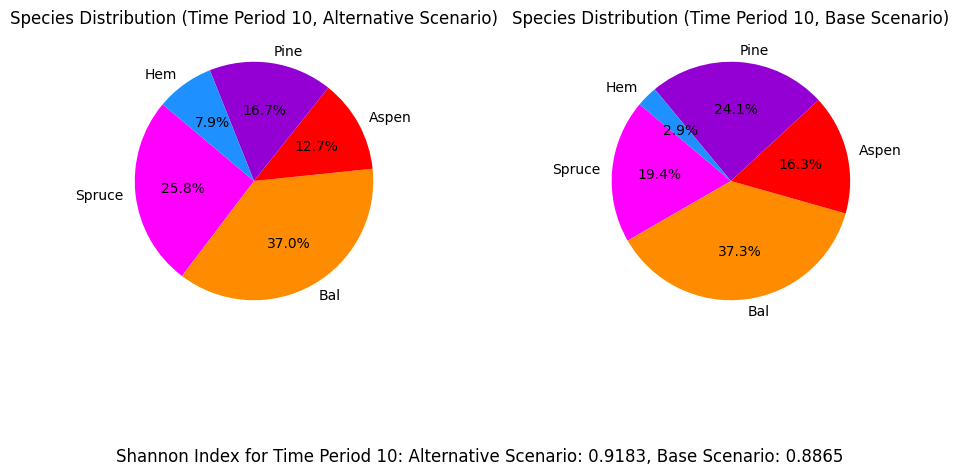

Pie Charts for Time Periods 0 and 10 saved to ./outputs/fig/goldenbear/goldenbear_max_st_kpi_species_difference_pie.pdf
---------------------------------------------------------------------------------------
It took 98.2 minutes to run all scenarios.


In [13]:
Start = time.time()
scenario_names = scenario_options.get(case_study, [])
for scenario_name in scenario_names:
    print(f"Running for {case_study}_{obj_mode}_{scenario_name}...")
    results_scenarios(fm, 
                      clt_percentage, 
                      credibility, 
                      budget_input, 
                      n_steps, 
                      max_harvest, 
                      scenario_name, 
                      displacement_effect, 
                      hwp_pool_effect_value, 
                      release_immediately_value, 
                      case_study, 
                      obj_mode,                   
                      pickle_output_base=True, 
                      pickle_output_alter=False)
print('It took', round((time.time() - Start) / 60, 1), "minutes to run all scenarios.")

In [14]:
print('It took', round((time.time() - Start) / 60, 1), "minutes to run this script.")

It took 98.2 minutes to run this script.
